# Figure - Covariance Comparison

May 2, 2022

The goal here is to generate plots for Figure 2 of the paper. The metric we want to use here is the *covariance* metric and not necessarily the *flow field* metric I've used previously.

Additionally, I want to sweep through different initializations and also different choices of $M$ and $W^{bmi1}$

* Metric plots averaged over initializations for biased RFLO, REINFORCE, and biased BPTT

* Metric plots for different choices of M (RFLO and BPTT)

* Metric plots for different choices of $W^{bmi0}$ and $W^{bmi1}$


This notebook combines code from `experiments/TCM-2022-4-5/fig2-gradient-2022-4-3.ipynb` and `experiments/Analytics-2022-4-20/New-Covariance-Metric-2022-4-28.ipynb`

In [1]:
folder = 'figures-2022-5-8/'

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator,FixedFormatter
import matplotlib.pylab as pylab

# analysis
from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.linear_model import LinearRegression
from scipy import interpolate # don't import stats
from scipy import linalg as LA
from scipy.ndimage.filters import uniform_filter1d

# miscellaneous
from tqdm import tqdm
from itertools import cycle
from copy import deepcopy
import pickle

import logging
import warnings
import dataclasses
from dataclasses import dataclass
from typing import Optional, List

import sys
sys.path.append("../..")

In [3]:
from rnn import RNNparams, RNN
from task import Task
from simulation import Simulation
from algorithms.bptt import BPTT
from algorithms.rflo import RFLO
from algorithms.reinforce import REINFORCE
from algorithms.track_vars import TrackVars

from utils.plotting import plot_trained_trajectories, paper_format
from utils.metric import cos_sim, return_norm_and_angle
from utils.functions import choose_aligned_matrix

from utils.metric import cos_sim, flow_field_data, flow_field_predicted, calculate_flow_field_correlation


In [4]:
def paper_format(fig,ax,xlabels=None,ylabels=None,labelsize=12,ticksize=10,linewidth=2,ylim=[0,1],figsize=(2.5,2.5)):
    
    """ Format Figure for Paper 8.5 x 11 
    
    This allows for quick reformatting of figures
    
    Args
    ----
    labelsize
    ticksize
    linewidth
    ylim
    figsize
    
    Returns
    -------
    fig
    ax
    
    TO DO: Need to be able to set linewidth
    """
    
    ax.set_ylim(ylim)
    
    fig.set_figheight(figsize[0])
    fig.set_figwidth(figsize[1])
    
    ax.xaxis.label.set_size(labelsize)
    ax.yaxis.label.set_size(labelsize)
    
    ax.tick_params(axis='x', labelsize=ticksize)
    ax.tick_params(axis='y', labelsize=ticksize)
    
    ax.set_title(ax.get_title(),fontsize=labelsize)
    
    """ for small figures """
    if xlabels:
        ax.xaxis.set_major_locator(FixedLocator(xlabels))
        ax.xaxis.set_major_formatter(FixedFormatter(xlabels))
    
    if ylabels:
        ax.yaxis.set_major_locator(FixedLocator(ylabels))
        ax.yaxis.set_major_formatter(FixedFormatter(ylabels))
    
    if ax.get_legend_handles_labels()[1] != []:
        ax.legend(prop={"size":labelsize})
        
    plt.tight_layout()

    return fig,ax

### Train RNN on four targets

Note here that the input is only "on" for 20% of the trial.

In [5]:
trial_duration = 20
n_in=4
frac_on = 0.2

x_tonic = 0.0*np.ones((trial_duration, n_in)) # shape 20 x 4 i.e. time x channel
x_pulse1 = x_tonic.copy()
x_pulse2 = x_tonic.copy()
x_pulse3 = x_tonic.copy()
x_pulse4 = x_tonic.copy()
x_pulse1[0:int(trial_duration*frac_on),0] = 1
x_pulse2[0:int(trial_duration*frac_on),1] = 1
x_pulse3[0:int(trial_duration*frac_on),2] = 1
x_pulse4[0:int(trial_duration*frac_on),3] = 1

task1 = Task(x_in=x_pulse1,y_target=np.asarray([[1],[1]]))
task2 = Task(x_in=x_pulse2,y_target=np.asarray([[-1],[1]]))
task3 = Task(x_in=x_pulse3,y_target=np.asarray([[1],[-1]]))
task4 = Task(x_in=x_pulse4,y_target=np.asarray([[-1],[-1]]))

# Part 1 - RFLO across multiple seeds

In [ ]:
# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.1,
               sig_in=0.0,sig_rec=0.25,sig_out=0.01,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(72))
params.print_params()

# Initialize RNN
net0 = RNN(params)
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec'],online=False)
sim0.run_session(n_trials=2500, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')






""" Average over multiple seeds """
seeds = [0,1,12,54,72,81]
overlaps = [0.6]
n_changes = [50]



stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []
stats['corrcoef'] = []

stats['covariance1'] = []
stats['covariance2'] = []
stats['covariance3'] = []

for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []
    corrcoef_list = []
    
    covariance1_list = []
    covariance2_list = []
    covariance3_list = []

    for overlap,n_change in zip(overlaps,n_changes):
        
        w_out1 = choose_aligned_matrix(net0.w_out.copy(),n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)
        w_m = choose_aligned_matrix(w_out1,n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)

        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        net1_pre = RNN(params)
        net1_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1_pre.set_weights(w_out = w_out1)
        net1_pre.set_weights(w_m = w_m.T)

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net1 = RNN(params)
        net1.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1.set_weights(w_out = w_out1)
        net1.set_weights(w_m = w_m.T)




        """ Track activity with new decoder, before training """

        sim1_pre = Simulation(net1_pre)
        trackvars = TrackVars(net1_pre,apply_to=[]) 
        sim1_pre.run_session(n_trials=500, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
        #fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        """ Train with new decoder """

        sim1_train = Simulation(net1)
        rflo = RFLO(net1,apply_to=['w_rec'],online=False)
        sim1_train.run_session(n_trials=1500, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['h','loss','err'], plot=True, plot_freq=10)

        """ Track activity with new decoder, after training """
        net1_post = RNN(params)
        net1_post.set_weights(w_in=net1.w_in.copy(), w_rec=net1.w_rec.copy())
        net1_post.set_weights(w_out = net1.w_out)
        net1_post.set_weights(w_m = net1.w_m)

        sim1_post = Simulation(net1_post)
        trackvars = TrackVars(net1_post,apply_to=[]) 
        sim1_post.run_session(n_trials=500, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)

        
        fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        fig = plot_trained_trajectories(sim=sim1_post, tasks=[task1,task2,task3,task4],title='RFLO, after training with new decoder')
        
        
        """ Calculate F fields """
        F_early, score_early = flow_field_data(sim1_pre.session_probes['h'])
        F_late, score_late = flow_field_data(sim1_post.session_probes['h'])

        print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

        Fdata = F_late - F_early

        # separate train and test data from sim1_train
        n_total = len(sim1_train.session_probes['h'])
        n_train = int(0.5 * n_total)
        idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
        idx_test = np.arange(0,n_total)[~idx_train].astype(int)
        #idx_test=idx_train

        h_train = np.asarray(sim1_train.session_probes['h'])[idx_train,:,:,:]
        err_train = np.asarray(sim1_train.session_probes['err'])[idx_train,:,:,:]

        Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
        Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
        Fpred_w_m = flow_field_predicted(w_m,err_train,h_train)

        h_test = np.asarray(sim1_train.session_probes['h'])[idx_test,:,:,:]

        corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
        corr1_list.append(corr1)

        corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
        corr2_list.append(corr2)

        corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
        corr3_list.append(corr3)
        
        fig,ax = plt.subplots(1,1)
        plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])
        plt.ylim([0,1])
        plt.show()
        
        
        
        
        
        
        """ Calculate Covariance """
        """ Activity During """
        covariance1 = np.zeros(task1.trial_duration)
        covariance2 = np.zeros(task1.trial_duration)
        covariance3 = np.zeros(task1.trial_duration)
        
        for t_ind in range(1,task1.trial_duration):
            """ Covariance Before """
            h1_pre = np.asarray(sim1_pre.session_probes['h']).squeeze()

            C1_pre = np.cov(h1_pre[:,t_ind,:].T) # neurons x trials at a single time point

            """ Covariance After """
            h1_post = np.asarray(sim1_post.session_probes['h']).squeeze()

            C1_post = np.cov(h1_post[:,t_ind,:].T) # neurons x trials at a single time point
            
            """ Change in Covariance (Measured)"""
            DeltaC1 = C1_post - C1_pre

            h1_train = sim1_train.session_probes['h']
            err1_train = sim1_train.session_probes['err']

            dW1_w_out = flow_field_predicted(net0.w_out,err1_train,h1_train)
            dW1_w_out *= 0.001 #dW1_w_out/LA.norm(dW1_w_out)
            dW1_w_out1 = flow_field_predicted(net1.w_out,err1_train,h1_train)
            dW1_w_out1 *= 0.001 #dW1_w_out/LA.norm(dW1_w_out)
            dW1_w_m = flow_field_predicted(net1.w_m.T,err1_train,h1_train)
            dW1_w_m *= 0.001 #dW1_w_m/LA.norm(dW1_w_m)

            h1_pre = np.asarray(sim1_pre.session_probes['h']).squeeze()
            h1_post = np.asarray(sim1_post.session_probes['h']).squeeze()

            C1_pred_w_out = np.cov(h1_pre[:,t_ind,:].T + dW1_w_out@(h1_pre[:,t_ind-1,:].T))
            C1_pred_w_out1 = np.cov(h1_pre[:,t_ind,:].T + dW1_w_out1@(h1_pre[:,t_ind-1,:].T))
            C1_pred_w_m = np.cov(h1_pre[:,t_ind,:].T + dW1_w_m@(h1_pre[:,t_ind-1,:].T))
            
            """ Change in Covariance (Predicted) """
            DeltaC1_pred_w_out = C1_pred_w_out - C1_pre
            DeltaC1_pred_w_out1 = C1_pred_w_out1 - C1_pre
            DeltaC1_pred_w_m = C1_pred_w_m - C1_pre

            covariance1[t_ind] = np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out.ravel())[0,1]
            covariance2[t_ind] = np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out1.ravel())[0,1]
            covariance3[t_ind] = np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_m.ravel())[0,1]
            


            if t_ind == 10:
                print('similarity DeltaC1 & DeltaC1_pred_w_out: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out.ravel())[0,1]))
                print('similarity DeltaC1 & DeltaC1_pred_w_out1: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out1.ravel())[0,1]))
                print('similarity DeltaC1 & DeltaC1_pred_w_m: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_m.ravel())[0,1]))
                print('\n')

            CTRL_h1_pre = np.cov(h1_pre[:,t_ind,:].T)
            CTRL_h1_post = np.cov(h1_post[:,t_ind,:].T)
            CTRL_dW1_w_out_h1_post = np.cov(dW1_w_out@(h1_post[:,t_ind,:].T))
            CTRL_dW1_w_out1_h1_post = np.cov(dW1_w_out1@(h1_post[:,t_ind,:].T))
            CTRL_dW1_w_m_h1_post = np.cov(dW1_w_m@(h1_post[:,t_ind,:].T))

            if t_ind == 10:
                print('>> CTRL DeltaC1 & CTRL_h1_pre: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_h1_pre.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_h1_post.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_dW1_w_out_h1_post.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_dW1_w_out1_h1_post.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_dW1_w_m_h1_post.ravel())[0,1]))

                print('\n')
                
        covariance1_list.append(covariance1)
        covariance2_list.append(covariance2)
        covariance3_list.append(covariance3)
        
        fig,ax = plt.subplots(1,1)
        plt.plot(np.asarray(covariance1).T,'o-',label='cov Wout0',color='teal')
        plt.plot(np.asarray(covariance2).T,'o-',label='cov Wout1',color='darkblue')
        plt.plot(np.asarray(covariance3).T,'o-',label='cov M',color='tomato')
        plt.legend()
        plt.xlabel('timestep')
        plt.ylabel('corr pred measured dCov')
        plt.show()
        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)
    #stats['corrcoef'].append(corrcoef_list)
    stats['covariance1'].append(covariance1_list)
    stats['covariance2'].append(covariance2_list)
    stats['covariance3'].append(covariance3_list)


In [72]:
#stats_rflo = stats
#stats = stats_rflo

### Combine Covariance results

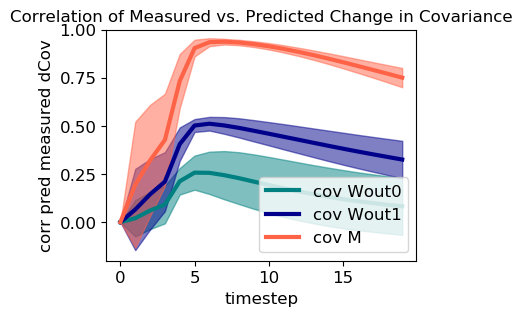

In [102]:
fig,ax = plt.subplots(1,1,figsize=(4,3))

cov1 = np.mean(np.asarray(stats['covariance1']),axis=0).squeeze()
cov1_std = np.std(np.asarray(stats['covariance1']),axis=0).squeeze()
plt.plot(cov1,label='cov Wout0',color='teal',linewidth=3)
plt.fill_between(np.arange(cov1.shape[0]),cov1-cov1_std,cov1+cov1_std,alpha=0.5,color='teal')

cov2 = np.mean(np.asarray(stats['covariance2']),axis=0).squeeze()
cov2_std = np.std(np.asarray(stats['covariance2']),axis=0).squeeze()
plt.plot(cov2,label='cov Wout1',color='darkblue',linewidth=3)
plt.fill_between(np.arange(cov2.shape[0]),cov2-cov2_std,cov2+cov2_std,alpha=0.5,color='darkblue')

cov3 = np.mean(np.asarray(stats['covariance3']),axis=0).squeeze()
cov3_std = np.std(np.asarray(stats['covariance3']),axis=0).squeeze()
plt.plot(cov3,label='cov M',color='tomato',linewidth=3)
plt.fill_between(np.arange(cov3.shape[0]),cov3-cov3_std,cov3+cov3_std,alpha=0.5,color='tomato')

plt.legend(loc=4)
plt.ylim(top=1)
plt.xlabel('timestep')
plt.ylabel('corr pred measured dCov')
plt.title('Correlation of Measured vs. Predicted Change in Covariance')
plt.show()

Not too bad! It seems that the values start looking different _after_ the input signal stops

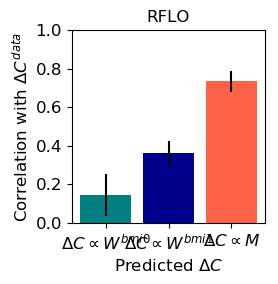

In [103]:
""" use covariance calculation to plot summary """
paper = False
save = False

fig,ax=plt.subplots(1,1)

""" take mean and std """
mn1 = np.mean(np.sum(np.asarray(stats['covariance1']),axis=2).squeeze()/task1.trial_duration)
mn2 = np.mean(np.sum(np.asarray(stats['covariance2']),axis=2).squeeze()/task1.trial_duration)
mn3 = np.mean(np.sum(np.asarray(stats['covariance3']),axis=2).squeeze()/task1.trial_duration)
std1 = np.std(np.sum(np.asarray(stats['covariance1']),axis=2).squeeze()/task1.trial_duration)
std2 = np.std(np.sum(np.asarray(stats['covariance2']),axis=2).squeeze()/task1.trial_duration)
std3 = np.std(np.sum(np.asarray(stats['covariance3']),axis=2).squeeze()/task1.trial_duration)

plt.bar([0,1,2],[mn1,mn2,mn3],yerr=[std1,std2,std3],tick_label=[r'$\Delta C \propto W^{bmi0}$',r'$\Delta C \propto W^{bmi1}$',r'$\Delta C \propto M$'],color=['teal','darkblue','tomato'])

plt.title('RFLO')
plt.ylabel('Correlation with '+r'$\Delta C^{data}$')
plt.xlabel('Predicted '+r'$\Delta C$')
plt.ylim(top=1)

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=None,ylabels=[0,0.25,0.5,0.75,1],fontsize=12,linewidth=2,ylim=[0,1],figsize=(2.5,2.5))

plt.show()

if save:

    fig.savefig('rflo-cov-correlation.pdf')

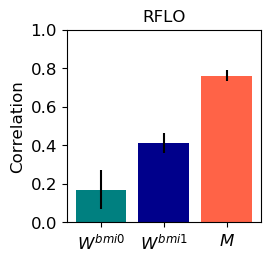

In [104]:
paper = False
save  = False

""" take mean and std """
mn1 = np.mean(np.asarray(stats['corr1']),axis=0)[0]
mn2 = np.mean(np.asarray(stats['corr2']),axis=0)[0]
mn3 = np.mean(np.asarray(stats['corr3']),axis=0)[0]
std1 = np.std(np.asarray(stats['corr1']),axis=0)[0]
std2 = np.std(np.asarray(stats['corr2']),axis=0)[0]
std3 = np.std(np.asarray(stats['corr3']),axis=0)[0]

fig,ax = plt.subplots(1,1)

plt.bar([0,1,2],[mn1,mn2,mn3],yerr=[std1,std2,std3],tick_label=[r'$W^{bmi0}$',r'$W^{bmi1}$',r'$M$'],color=['teal','darkblue','tomato'])

plt.title('RFLO')
plt.ylabel('Correlation') #with '+r'$\Delta F^{data}$
#plt.xlabel('Predicted '+r'$\Delta F$')
plt.ylim(top=1)

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=None,ylabels=[0,0.25,0.5,0.75,1],linewidth=2,ylim=[0,1],figsize=(2,2.25))

plt.show()

if save:
    fig.savefig(folder+'rflo-dF-correlation.pdf')

# Part 1a - biased BPTT

In [ ]:
# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.1,
               sig_in=0.0,sig_rec=0.25,sig_out=0.01,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(72))
params.print_params()

# Initialize RNN
net0 = RNN(params)
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec'],online=False)
sim0.run_session(n_trials=2500, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')






""" Average over multiple seeds """
seeds = [0,1,12,54,72,81]
overlaps = [0.6]
n_changes = [50]
overlap_w_out0 = 0.5
n_change_w_out0 = 50


stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []
stats['corrcoef'] = []

stats['covariance1'] = []
stats['covariance2'] = []
stats['covariance3'] = []

for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []
    corrcoef_list = []
    
    covariance1_list = []
    covariance2_list = []
    covariance3_list = []

    for overlap,n_change in zip(overlaps,n_changes):
        
        w_out1 = choose_aligned_matrix(net0.w_out.copy(),n_change=n_change_w_out0,overlap=overlap_w_out0,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)
        w_m = choose_aligned_matrix(w_out1,n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)

        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        net1_pre = RNN(params)
        net1_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1_pre.set_weights(w_out = w_out1)
        net1_pre.set_weights(w_m = w_m.T)

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net1 = RNN(params)
        net1.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1.set_weights(w_out = w_out1)
        net1.set_weights(w_m = w_m.T)




        """ Track activity with new decoder, before training """

        sim1_pre = Simulation(net1_pre)
        trackvars = TrackVars(net1_pre,apply_to=[]) 
        sim1_pre.run_session(n_trials=500, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
        #fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        """ Train with new decoder """

        sim1_train = Simulation(net1)
        print('>> Biased BPTT')
        bptt = BPTT(net1,apply_to=['w_rec'],online=False)
        sim1_train.run_session(n_trials=1000, tasks=[task1,task2,task3,task4], learn_alg=[bptt], probe_types=['h','loss','err'], plot=True, plot_freq=10)

        """ Track activity with new decoder, after training """
        net1_post = RNN(params)
        net1_post.set_weights(w_in=net1.w_in.copy(), w_rec=net1.w_rec.copy())
        net1_post.set_weights(w_out = net1.w_out)
        net1_post.set_weights(w_m = net1.w_m)

        sim1_post = Simulation(net1_post)
        trackvars = TrackVars(net1_post,apply_to=[]) 
        sim1_post.run_session(n_trials=500, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)

        
        fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        fig = plot_trained_trajectories(sim=sim1_post, tasks=[task1,task2,task3,task4],title='RFLO, after training with new decoder')
        
        
        """ Calculate F fields """
        F_early, score_early = flow_field_data(sim1_pre.session_probes['h'])
        F_late, score_late = flow_field_data(sim1_post.session_probes['h'])

        print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

        Fdata = F_late - F_early

        # separate train and test data from sim1_train
        n_total = len(sim1_train.session_probes['h'])
        n_train = int(0.5 * n_total)
        idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
        idx_test = np.arange(0,n_total)[~idx_train].astype(int)
        #idx_test=idx_train

        h_train = np.asarray(sim1_train.session_probes['h'])[idx_train,:,:,:]
        err_train = np.asarray(sim1_train.session_probes['err'])[idx_train,:,:,:]

        Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
        Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
        Fpred_w_m = flow_field_predicted(w_m,err_train,h_train)

        h_test = np.asarray(sim1_train.session_probes['h'])[idx_test,:,:,:]

        corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
        corr1_list.append(corr1)

        corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
        corr2_list.append(corr2)

        corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
        corr3_list.append(corr3)
        
        fig,ax = plt.subplots(1,1)
        plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])
        plt.ylim([0,1])
        plt.show()
        
        
        
        
        
        
        """ Calculate Covariance """
        """ Activity During """
        covariance1 = np.zeros(task1.trial_duration)
        covariance2 = np.zeros(task1.trial_duration)
        covariance3 = np.zeros(task1.trial_duration)
        
        for t_ind in range(1,task1.trial_duration):
            """ Covariance Before """
            h1_pre = np.asarray(sim1_pre.session_probes['h']).squeeze()

            C1_pre = np.cov(h1_pre[:,t_ind,:].T) # neurons x trials at a single time point

            """ Covariance After """
            h1_post = np.asarray(sim1_post.session_probes['h']).squeeze()

            C1_post = np.cov(h1_post[:,t_ind,:].T) # neurons x trials at a single time point
            
            """ Change in Covariance (Measured)"""
            DeltaC1 = C1_post - C1_pre

            h1_train = sim1_train.session_probes['h']
            err1_train = sim1_train.session_probes['err']

            dW1_w_out = flow_field_predicted(net0.w_out,err1_train,h1_train)
            dW1_w_out *= 0.001 #dW1_w_out/LA.norm(dW1_w_out)
            dW1_w_out1 = flow_field_predicted(net1.w_out,err1_train,h1_train)
            dW1_w_out1 *= 0.001 #dW1_w_out/LA.norm(dW1_w_out)
            dW1_w_m = flow_field_predicted(net1.w_m.T,err1_train,h1_train)
            dW1_w_m *= 0.001 #dW1_w_m/LA.norm(dW1_w_m)

            h1_pre = np.asarray(sim1_pre.session_probes['h']).squeeze()
            h1_post = np.asarray(sim1_post.session_probes['h']).squeeze()

            C1_pred_w_out = np.cov(h1_pre[:,t_ind,:].T + dW1_w_out@(h1_pre[:,t_ind-1,:].T))
            C1_pred_w_out1 = np.cov(h1_pre[:,t_ind,:].T + dW1_w_out1@(h1_pre[:,t_ind-1,:].T))
            C1_pred_w_m = np.cov(h1_pre[:,t_ind,:].T + dW1_w_m@(h1_pre[:,t_ind-1,:].T))
            
            """ Change in Covariance (Predicted) """
            DeltaC1_pred_w_out = C1_pred_w_out - C1_pre
            DeltaC1_pred_w_out1 = C1_pred_w_out1 - C1_pre
            DeltaC1_pred_w_m = C1_pred_w_m - C1_pre

            covariance1[t_ind] = np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out.ravel())[0,1]
            covariance2[t_ind] = np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out1.ravel())[0,1]
            covariance3[t_ind] = np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_m.ravel())[0,1]
            


            if t_ind == 10:
                print('similarity DeltaC1 & DeltaC1_pred_w_out: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out.ravel())[0,1]))
                print('similarity DeltaC1 & DeltaC1_pred_w_out1: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out1.ravel())[0,1]))
                print('similarity DeltaC1 & DeltaC1_pred_w_m: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_m.ravel())[0,1]))
                print('\n')

            CTRL_h1_pre = np.cov(h1_pre[:,t_ind,:].T)
            CTRL_h1_post = np.cov(h1_post[:,t_ind,:].T)
            CTRL_dW1_w_out_h1_post = np.cov(dW1_w_out@(h1_post[:,t_ind,:].T))
            CTRL_dW1_w_out1_h1_post = np.cov(dW1_w_out1@(h1_post[:,t_ind,:].T))
            CTRL_dW1_w_m_h1_post = np.cov(dW1_w_m@(h1_post[:,t_ind,:].T))

            if t_ind == 10:
                print('>> CTRL DeltaC1 & CTRL_h1_pre: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_h1_pre.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_h1_post.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_dW1_w_out_h1_post.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_dW1_w_out1_h1_post.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_dW1_w_m_h1_post.ravel())[0,1]))

                print('\n')
                
        covariance1_list.append(covariance1)
        covariance2_list.append(covariance2)
        covariance3_list.append(covariance3)
        
        fig,ax = plt.subplots(1,1)
        plt.plot(np.asarray(covariance1).T,'o-',label='cov Wout0',color='teal')
        plt.plot(np.asarray(covariance2).T,'o-',label='cov Wout1',color='darkblue')
        plt.plot(np.asarray(covariance3).T,'o-',label='cov M',color='tomato')
        plt.legend()
        plt.xlabel('timestep')
        plt.ylabel('corr pred measured dCov')
        plt.show()
        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)
    #stats['corrcoef'].append(corrcoef_list)
    stats['covariance1'].append(covariance1_list)
    stats['covariance2'].append(covariance2_list)
    stats['covariance3'].append(covariance3_list)


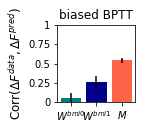

In [13]:
paper = True
save  = True

""" take mean and std """
mn1 = np.mean(np.asarray(stats['corr1']),axis=0)[0]
mn2 = np.mean(np.asarray(stats['corr2']),axis=0)[0]
mn3 = np.mean(np.asarray(stats['corr3']),axis=0)[0]
std1 = np.std(np.asarray(stats['corr1']),axis=0)[0]
std2 = np.std(np.asarray(stats['corr2']),axis=0)[0]
std3 = np.std(np.asarray(stats['corr3']),axis=0)[0]

fig,ax = plt.subplots(1,1)

plt.bar([0,1,2],[mn1,mn2,mn3],yerr=[std1,std2,std3],tick_label=[r'$W^{bmi0}$',r'$W^{bmi1}$',r'$M$'],color=['teal','darkblue','tomato'])

plt.title('biased BPTT')
plt.ylabel('Corr'+r'$(\Delta F^{data}, \Delta F^{pred})$') #with '+r'$\Delta F^{data}$
#plt.xlabel('Predicted '+r'$\Delta F$')
plt.ylim(top=1)

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=None,ylabels=[0,0.25,0.5,0.75,1],linewidth=2,ylim=[0,1],figsize=(2,2.25))

plt.show()

if save:
    fig.savefig(folder+'bptt-dF-correlation.pdf')

# Part 2 - REINFORCE

18it [00:00, 177.49it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fb81d62f990>


2500it [00:07, 330.91it/s]
60it [00:00, 591.42it/s]

M norm: 1.06	 M angle: 0.61, 0 iterations
w_out1 norm: 1.37	 w_out vs. w_out1 angle: 0.60
w_m norm: 1.06	 w_out1 vs. w_m angle: 0.61
w_m norm: 1.57	 w_out vs. w_m angle: 0.41

1000it [00:01, 670.20it/s]
15000it [00:43, 341.50it/s]
1000it [00:01, 715.40it/s]


AR early fit 0.964, late fit 0.980


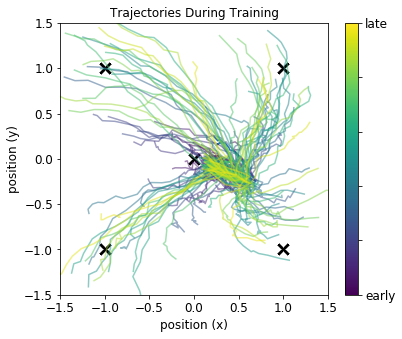

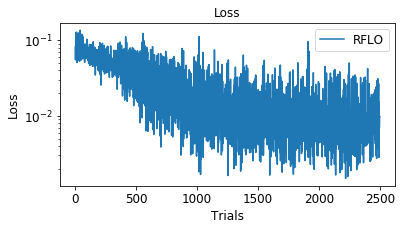

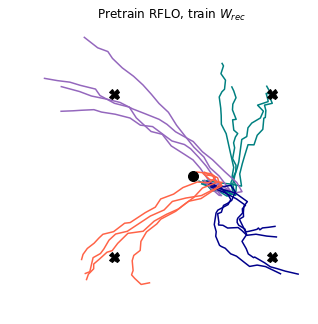

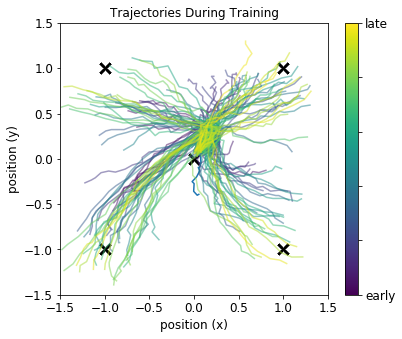

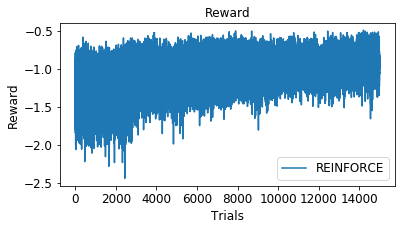

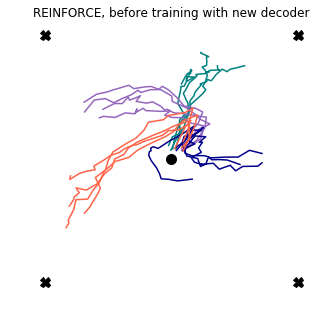

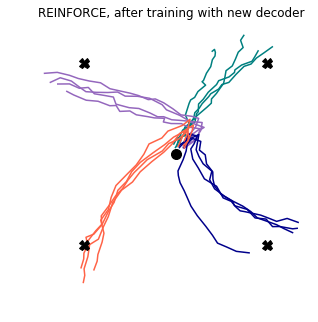

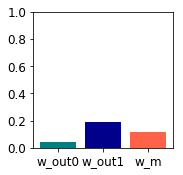

similarity DeltaC2 & DeltaC2_pred_w_out: 0.434
similarity DeltaC2 & DeltaC2_pred_w_out1: 0.612
similarity DeltaC2 & DeltaC2_pred_w_m: 0.402


>> CTRL DeltaC2 & CTRL_h2_pre: 0.636
>> CTRL DeltaC2 & CTRL_h2_post: 0.909
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.427
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.415
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.216




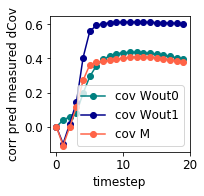

62it [00:00, 619.91it/s]

M norm: 1.10	 M angle: 0.60, 0 iterations
w_out1 norm: 1.38	 w_out vs. w_out1 angle: 0.60
w_m norm: 1.10	 w_out1 vs. w_m angle: 0.60
w_m norm: 1.71	 w_out vs. w_m angle: 0.29

1000it [00:00, 1009.31it/s]
15000it [00:43, 343.85it/s]
1000it [00:00, 1005.79it/s]


AR early fit 0.964, late fit 0.982


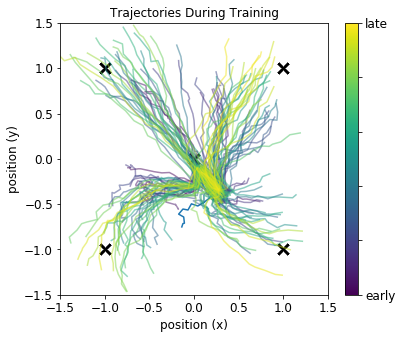

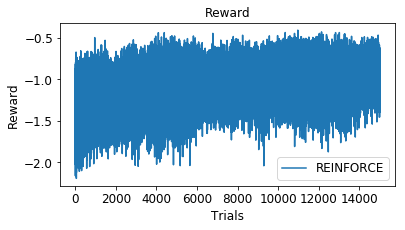

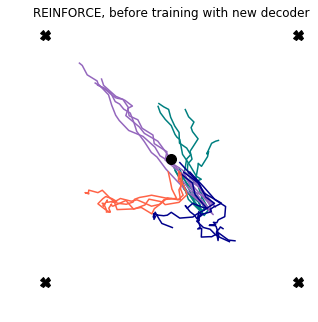

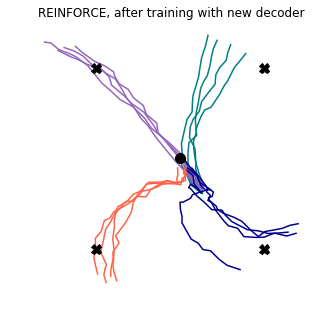

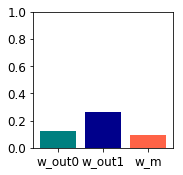

similarity DeltaC2 & DeltaC2_pred_w_out: 0.572
similarity DeltaC2 & DeltaC2_pred_w_out1: 0.683
similarity DeltaC2 & DeltaC2_pred_w_m: 0.315


>> CTRL DeltaC2 & CTRL_h2_pre: 0.709
>> CTRL DeltaC2 & CTRL_h2_post: 0.946
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.569
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.436
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.105




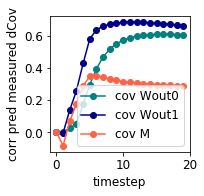

63it [00:00, 627.17it/s]

M norm: 1.09	 M angle: 0.60, 4 iterations
w_out1 norm: 1.37	 w_out vs. w_out1 angle: 0.60
w_m norm: 1.09	 w_out1 vs. w_m angle: 0.60
w_m norm: 1.69	 w_out vs. w_m angle: 0.31

1000it [00:01, 896.77it/s]
15000it [00:32, 457.54it/s]
1000it [00:01, 998.38it/s]


AR early fit 0.964, late fit 0.981


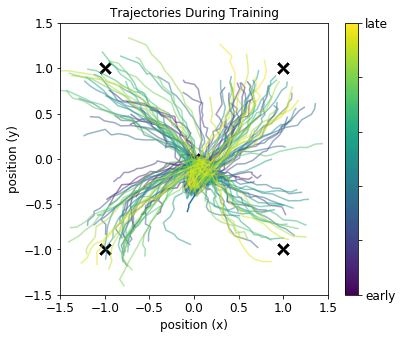

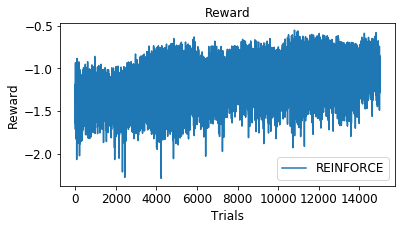

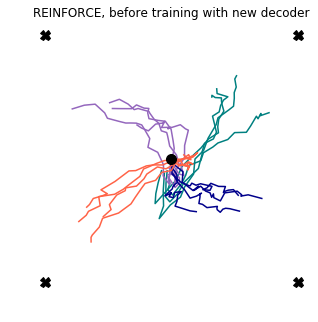

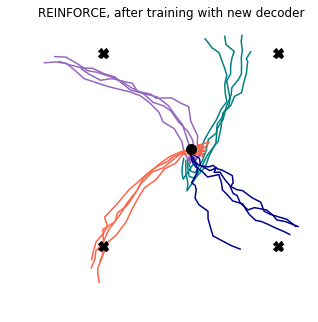

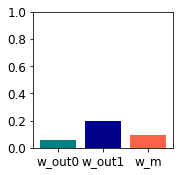

similarity DeltaC2 & DeltaC2_pred_w_out: 0.492
similarity DeltaC2 & DeltaC2_pred_w_out1: 0.563
similarity DeltaC2 & DeltaC2_pred_w_m: 0.305


>> CTRL DeltaC2 & CTRL_h2_pre: 0.588
>> CTRL DeltaC2 & CTRL_h2_post: 0.900
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.486
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.328
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.063




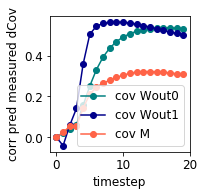

69it [00:00, 689.88it/s]

M norm: 1.07	 M angle: 0.60, 49 iterations
w_out1 norm: 1.35	 w_out vs. w_out1 angle: 0.61
w_m norm: 1.07	 w_out1 vs. w_m angle: 0.60
w_m norm: 1.63	 w_out vs. w_m angle: 0.36

1000it [00:01, 968.84it/s]
15000it [00:42, 354.64it/s]
1000it [00:01, 873.37it/s]


AR early fit 0.964, late fit 0.981


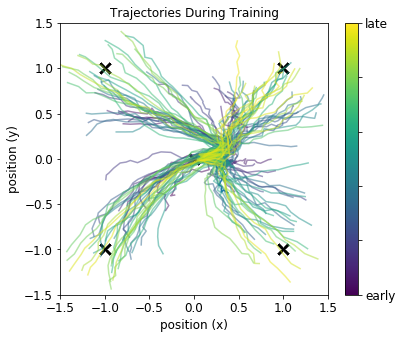

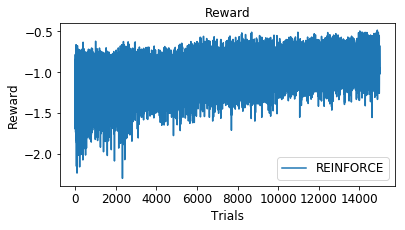

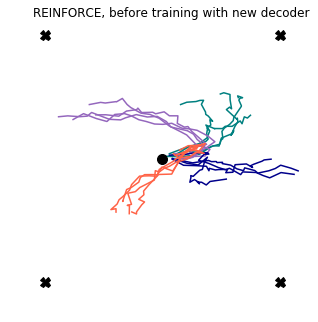

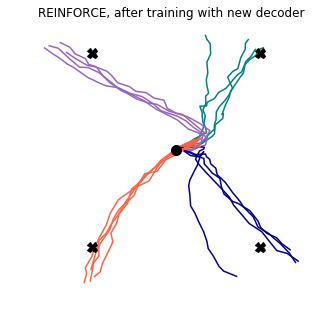

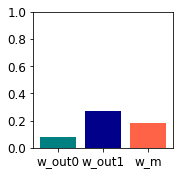

similarity DeltaC2 & DeltaC2_pred_w_out: 0.384
similarity DeltaC2 & DeltaC2_pred_w_out1: 0.690
similarity DeltaC2 & DeltaC2_pred_w_m: 0.351


>> CTRL DeltaC2 & CTRL_h2_pre: 0.620
>> CTRL DeltaC2 & CTRL_h2_post: 0.919
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.378
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.493
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.149




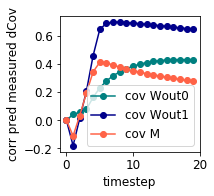

82it [00:00, 812.95it/s]

M norm: 1.08	 M angle: 0.61, 19 iterations
w_out1 norm: 1.36	 w_out vs. w_out1 angle: 0.61
w_m norm: 1.08	 w_out1 vs. w_m angle: 0.61
w_m norm: 1.59	 w_out vs. w_m angle: 0.40

1000it [00:00, 1040.27it/s]
15000it [00:31, 473.92it/s]
1000it [00:00, 1075.53it/s]


AR early fit 0.964, late fit 0.981


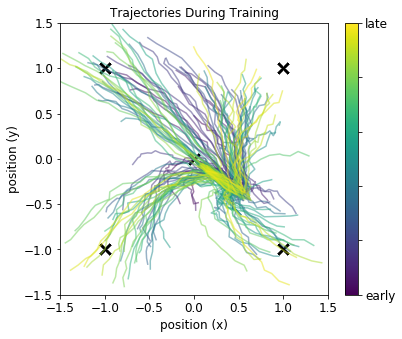

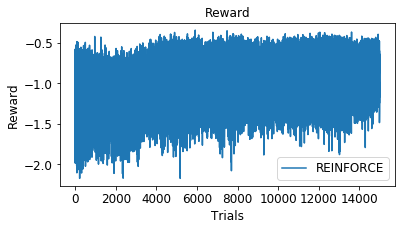

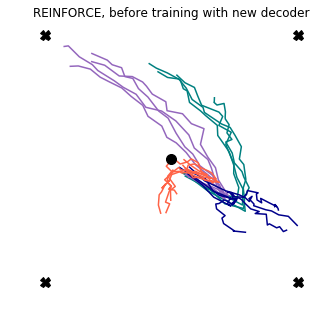

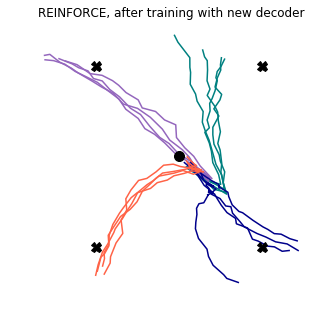

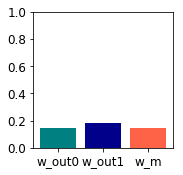

similarity DeltaC2 & DeltaC2_pred_w_out: 0.511
similarity DeltaC2 & DeltaC2_pred_w_out1: 0.626
similarity DeltaC2 & DeltaC2_pred_w_m: 0.386


>> CTRL DeltaC2 & CTRL_h2_pre: 0.656
>> CTRL DeltaC2 & CTRL_h2_post: 0.929
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.511
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.368
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.145




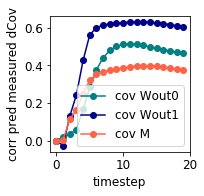

75it [00:00, 748.07it/s]

M norm: 1.10	 M angle: 0.61, 38 iterations
w_out1 norm: 1.36	 w_out vs. w_out1 angle: 0.61
w_m norm: 1.10	 w_out1 vs. w_m angle: 0.61
w_m norm: 1.57	 w_out vs. w_m angle: 0.42

1000it [00:01, 949.73it/s]
15000it [00:35, 422.64it/s]
1000it [00:01, 992.36it/s]


AR early fit 0.964, late fit 0.982


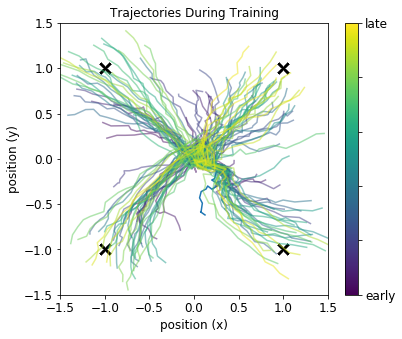

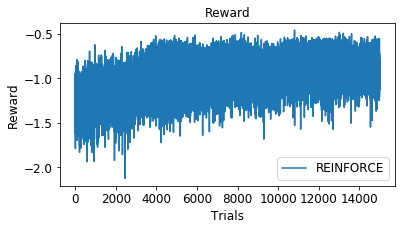

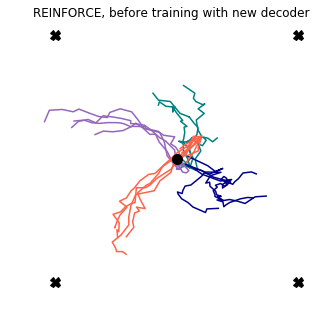

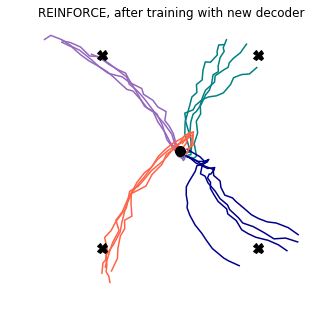

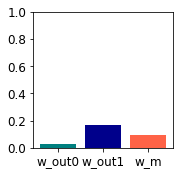

similarity DeltaC2 & DeltaC2_pred_w_out: 0.552
similarity DeltaC2 & DeltaC2_pred_w_out1: 0.631
similarity DeltaC2 & DeltaC2_pred_w_m: 0.314


>> CTRL DeltaC2 & CTRL_h2_pre: 0.730
>> CTRL DeltaC2 & CTRL_h2_post: 0.947
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.549
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.404
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.102




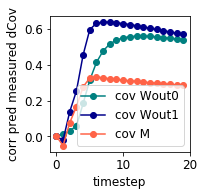

In [15]:
# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.1,
               sig_in=0.0,sig_rec=0.25,sig_out=0.01,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(72))
params.print_params()

# Initialize RNN, train with RFLO
net0 = RNN(params)
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec'],online=False)
sim0.run_session(n_trials=2500, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')



""" Average over multiple seeds """
seeds = [0,1,12,54,72,81]
overlaps = [0.6]
n_changes = [50]



stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []
stats['corrcoef'] = []

stats['covariance1'] = []
stats['covariance2'] = []
stats['covariance3'] = []

for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []
    corrcoef_list = []
    
    covariance1_list = []
    covariance2_list = []
    covariance3_list = []

    for overlap,n_change in zip(overlaps,n_changes):
        
        w_out1 = choose_aligned_matrix(net0.w_out.copy(),n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)
        w_m = choose_aligned_matrix(w_out1,n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)

        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        net2_pre = RNN(params)
        net2_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net2_pre.set_weights(w_out = w_out1)
        net2_pre.set_weights(w_m = 0*w_m.T) # shouldn't matter for REINFORCE

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net2 = RNN(params)
        net2.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net2.set_weights(w_out = w_out1)
        net2.set_weights(w_m = 0*w_m.T) # shouldn't matter for REINFORCE



        """ Track activity with new decoder, before training """

        sim2_pre = Simulation(net2_pre)
        trackvars = TrackVars(net2_pre,apply_to=[]) 
        sim2_pre.run_session(n_trials=1000, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
        #fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        """ Train with new decoder """

        sim2_train = Simulation(net2)
        reinforce = REINFORCE(net2,apply_to=['w_rec'],online=False,tau_reward=5)
        sim2_train.run_session(n_trials=15000, tasks=[task1,task2,task3,task4], learn_alg=[reinforce], probe_types=['h','reward','err'], plot=True, plot_freq=100)

        """ Track activity with new decoder, after training """
        net2_post = RNN(params)
        net2_post.set_weights(w_in=net2.w_in.copy(), w_rec=net2.w_rec.copy())
        net2_post.set_weights(w_out = net2.w_out)
        net2_post.set_weights(w_m = 0*net2.w_m) # shouldn't matter for REINFORCE

        sim2_post = Simulation(net2_post)
        trackvars = TrackVars(net2_post,apply_to=[]) 
        sim2_post.run_session(n_trials=1000, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)

        
        fig = plot_trained_trajectories(sim=sim2_pre, tasks=[task1,task2,task3,task4],title='REINFORCE, before training with new decoder')

        fig = plot_trained_trajectories(sim=sim2_post, tasks=[task1,task2,task3,task4],title='REINFORCE, after training with new decoder')
        
        
        """ Calculate F fields """
        F_early, score_early = flow_field_data(sim2_pre.session_probes['h'])
        F_late, score_late = flow_field_data(sim2_post.session_probes['h'])

        print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

        Fdata = F_late - F_early

        # separate train and test data from sim1_train
        n_total = len(sim2_train.session_probes['h'])
        n_train = int(0.5 * n_total)
        idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
        idx_test = np.arange(0,n_total)[~idx_train].astype(int)
        #idx_test=idx_train

        h_train = np.asarray(sim2_train.session_probes['h'])[idx_train,:,:,:]
        err_train = np.asarray(sim2_train.session_probes['err'])[idx_train,:,:,:]

        Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
        Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
        Fpred_w_m = flow_field_predicted(w_m,err_train,h_train)

        h_test = np.asarray(sim2_train.session_probes['h'])[idx_test,:,:,:]

        corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
        corr1_list.append(corr1)

        corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
        corr2_list.append(corr2)

        corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
        corr3_list.append(corr3)
        
        fig,ax = plt.subplots(1,1)
        plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])
        plt.ylim([0,1])
        plt.show()
        
        
        
        
        
        
        
        """ Calculate Covariance """
        """ Activity During """
        covariance1 = np.zeros(task1.trial_duration)
        covariance2 = np.zeros(task1.trial_duration)
        covariance3 = np.zeros(task1.trial_duration)
        
        for t_ind in range(1,task1.trial_duration):
            """ Covariance Before """
            h2_pre = np.asarray(sim2_pre.session_probes['h']).squeeze()

            C2_pre = np.cov(h2_pre[:,t_ind,:].T) # neurons x trials at a single time point

            """ Covariance After """
            h2_post = np.asarray(sim2_post.session_probes['h']).squeeze()

            C2_post = np.cov(h2_post[:,t_ind,:].T) # neurons x trials at a single time point
            
            """ Change in Covariance """
            DeltaC2 = C2_post - C2_pre

            h2_train = sim2_train.session_probes['h']
            err2_train = sim2_train.session_probes['err']

            dW2_w_out = flow_field_predicted(net0.w_out,err2_train,h2_train)
            dW2_w_out *= 0.001 #dW1_w_out/LA.norm(dW1_w_out)
            dW2_w_out1 = flow_field_predicted(net2.w_out,err2_train,h2_train)
            dW2_w_out1 *= 0.001 #dW1_w_out/LA.norm(dW1_w_out)
            dW2_w_m = flow_field_predicted(w_m,err2_train,h2_train) # w_m defined above
            dW2_w_m *= 0.001 #dW1_w_m/LA.norm(dW1_w_m)

            h2_pre = np.asarray(sim2_pre.session_probes['h']).squeeze()
            h2_post = np.asarray(sim2_post.session_probes['h']).squeeze()

            C2_pred_w_out = np.cov(h2_pre[:,t_ind,:].T + dW2_w_out@(h2_post[:,t_ind-1,:].T))
            C2_pred_w_out1 = np.cov(h2_pre[:,t_ind,:].T + dW2_w_out1@(h2_post[:,t_ind-1,:].T))
            C2_pred_w_m = np.cov(h2_pre[:,t_ind,:].T + dW2_w_m@(h2_post[:,t_ind-1,:].T))
            
            DeltaC2_pred_w_out = C2_pred_w_out - C2_pre
            DeltaC2_pred_w_out1 = C2_pred_w_out1 - C2_pre
            DeltaC2_pred_w_m = C2_pred_w_m - C2_pre

            covariance1[t_ind] = np.corrcoef(DeltaC2.ravel(),DeltaC2_pred_w_out.ravel())[0,1]
            covariance2[t_ind] = np.corrcoef(DeltaC2.ravel(),DeltaC2_pred_w_out1.ravel())[0,1]
            covariance3[t_ind] = np.corrcoef(DeltaC2.ravel(),DeltaC2_pred_w_m.ravel())[0,1]
            


            if t_ind == 10:
                print('similarity DeltaC2 & DeltaC2_pred_w_out: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),DeltaC2_pred_w_out.ravel())[0,1]))
                print('similarity DeltaC2 & DeltaC2_pred_w_out1: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),DeltaC2_pred_w_out1.ravel())[0,1]))
                print('similarity DeltaC2 & DeltaC2_pred_w_m: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),DeltaC2_pred_w_m.ravel())[0,1]))
                print('\n')

            CTRL_h2_pre = np.cov(h2_pre[:,t_ind,:].T)
            CTRL_h2_post = np.cov(h2_post[:,t_ind,:].T)
            CTRL_dW2_w_out_h2_post = np.cov(dW2_w_out@(h2_post[:,t_ind,:].T))
            CTRL_dW2_w_out1_h2_post = np.cov(dW2_w_out1@(h2_post[:,t_ind,:].T))
            CTRL_dW2_w_m_h2_post = np.cov(dW2_w_m@(h2_post[:,t_ind,:].T))

            if t_ind == 10:
                print('>> CTRL DeltaC2 & CTRL_h2_pre: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),CTRL_h2_pre.ravel())[0,1]))
                print('>> CTRL DeltaC2 & CTRL_h2_post: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),CTRL_h2_post.ravel())[0,1]))
                print('>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),CTRL_dW2_w_out_h2_post.ravel())[0,1]))
                print('>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),CTRL_dW2_w_out1_h2_post.ravel())[0,1]))
                print('>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),CTRL_dW2_w_m_h2_post.ravel())[0,1]))

                print('\n')
                
        covariance1_list.append(covariance1)
        covariance2_list.append(covariance2)
        covariance3_list.append(covariance3)
        
        fig,ax = plt.subplots(1,1)
        plt.plot(np.asarray(covariance1).T,'o-',label='cov Wout0',color='teal')
        plt.plot(np.asarray(covariance2).T,'o-',label='cov Wout1',color='darkblue')
        plt.plot(np.asarray(covariance3).T,'o-',label='cov M',color='tomato')
        plt.legend()
        plt.xlabel('timestep')
        plt.ylabel('corr pred measured dCov')
        plt.show()
        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)
    #stats['corrcoef'].append(corrcoef_list)
    
    stats['covariance1'].append(covariance1_list)
    stats['covariance2'].append(covariance2_list)
    stats['covariance3'].append(covariance3_list)


In [69]:
stats_reinforce = stats

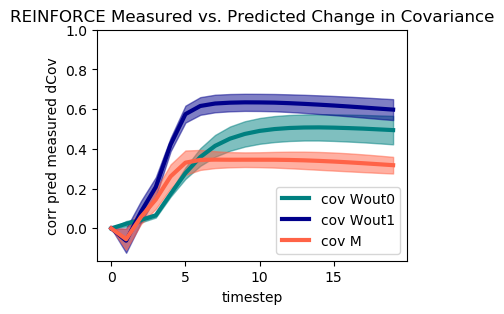

In [26]:
fig,ax = plt.subplots(1,1,figsize=(4,3))

cov1 = np.mean(np.asarray(stats['covariance1']),axis=0).squeeze()
cov1_std = np.std(np.asarray(stats['covariance1']),axis=0).squeeze()
plt.plot(cov1,label='cov Wout0',color='teal',linewidth=3)
plt.fill_between(np.arange(cov1.shape[0]),cov1-cov1_std,cov1+cov1_std,alpha=0.5,color='teal')

cov2 = np.mean(np.asarray(stats['covariance2']),axis=0).squeeze()
cov2_std = np.std(np.asarray(stats['covariance2']),axis=0).squeeze()
plt.plot(cov2,label='cov Wout1',color='darkblue',linewidth=3)
plt.fill_between(np.arange(cov2.shape[0]),cov2-cov2_std,cov2+cov2_std,alpha=0.5,color='darkblue')

cov3 = np.mean(np.asarray(stats['covariance3']),axis=0).squeeze()
cov3_std = np.std(np.asarray(stats['covariance3']),axis=0).squeeze()
plt.plot(cov3,label='cov M',color='tomato',linewidth=3)
plt.fill_between(np.arange(cov3.shape[0]),cov3-cov3_std,cov3+cov3_std,alpha=0.5,color='tomato')

plt.legend(loc=4)
plt.ylim(top=1)
plt.xlabel('timestep')
plt.ylabel('corr pred measured dCov')
plt.title('REINFORCE Measured vs. Predicted Change in Covariance')
plt.show()

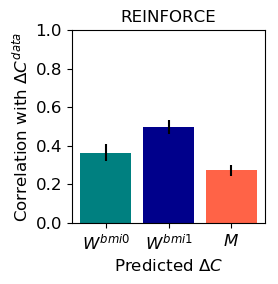

In [35]:
paper = False
save = False

""" use covariance calculation to plot summary """

""" take mean and std """
mn1 = np.mean(np.sum(np.asarray(stats['covariance1']),axis=2).squeeze()/task1.trial_duration)
mn2 = np.mean(np.sum(np.asarray(stats['covariance2']),axis=2).squeeze()/task1.trial_duration)
mn3 = np.mean(np.sum(np.asarray(stats['covariance3']),axis=2).squeeze()/task1.trial_duration)
std1 = np.std(np.sum(np.asarray(stats['covariance1']),axis=2).squeeze()/task1.trial_duration)
std2 = np.std(np.sum(np.asarray(stats['covariance2']),axis=2).squeeze()/task1.trial_duration)
std3 = np.std(np.sum(np.asarray(stats['covariance3']),axis=2).squeeze()/task1.trial_duration)

fig,ax = plt.subplots(1,1)
plt.bar([0,1,2],[mn1,mn2,mn3],yerr=[std1,std2,std3],tick_label=[r'$W^{bmi0}$',r'$W^{bmi1}$',r'$M$'],color=['teal','darkblue','tomato'])

plt.title('REINFORCE')
plt.ylabel('Correlation with '+r'$\Delta C^{data}$')
plt.xlabel('Predicted '+r'$\Delta C$')
plt.ylim(top=1)

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=None,ylabels=[0,0.25,0.5,0.75,1],fontsize=12,linewidth=2,ylim=[0,1],figsize=(2.5,2.5))

plt.show()

if save:
    fig.savefig(folder+'reinforce-xov-correlation.pdf')

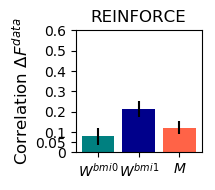

In [71]:
paper = True
save = True

""" take mean and std """
mn1 = np.mean(np.asarray(stats['corr1']),axis=0)[0]
mn2 = np.mean(np.asarray(stats['corr2']),axis=0)[0]
mn3 = np.mean(np.asarray(stats['corr3']),axis=0)[0]
std1 = np.std(np.asarray(stats['corr1']),axis=0)[0]
std2 = np.std(np.asarray(stats['corr2']),axis=0)[0]
std3 = np.std(np.asarray(stats['corr3']),axis=0)[0]

fig,ax = plt.subplots(1,1)
plt.bar([0,1,2],[mn1,mn2,mn3],yerr=[std1,std2,std3],tick_label=[r'$W^{bmi0}$',r'$W^{bmi1}$',r'$M$'],color=['teal','darkblue','tomato'])

plt.title('REINFORCE')
plt.ylabel('Correlation '+r'$\Delta F^{data}$')
#plt.xlabel('Predicted '+r'$\Delta F$')
plt.ylim(top=1)

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=None,ylabels=[0,0.05,0.1,0.2,0.3,0.40,0.5,0.6],ticksize=10,linewidth=2,ylim=[0,0.6],figsize=(2,2.25))

    

plt.show()

if save:
    fig.savefig(folder+'reinforce-dF-correlation.pdf')

# Part 3 - RFLO across choices of M

30it [00:00, 295.26it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fce54ea3438>


2500it [00:07, 324.89it/s]
79it [00:00, 785.06it/s]

M norm: 1.43	 M angle: 0.21, 4 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.43	 w_out1 vs. w_m angle: 0.21
w_m norm: 1.92	 w_out vs. w_m angle: 0.05

500it [00:00, 951.61it/s]
1500it [00:04, 343.27it/s]
500it [00:00, 1029.90it/s]


AR early fit 0.963, late fit 0.983


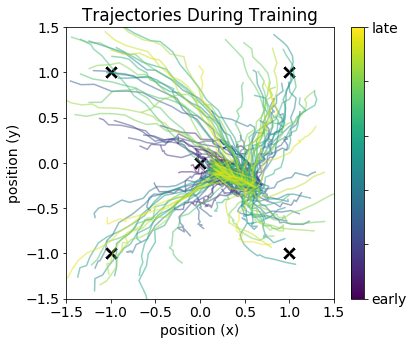

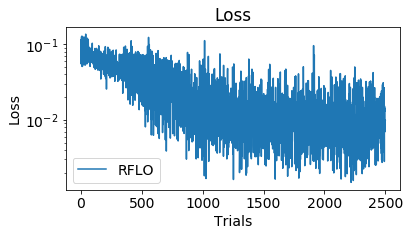

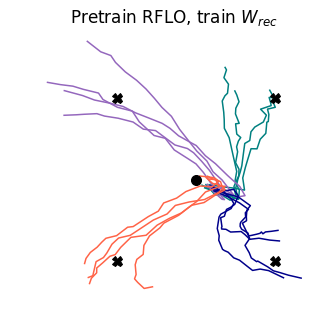

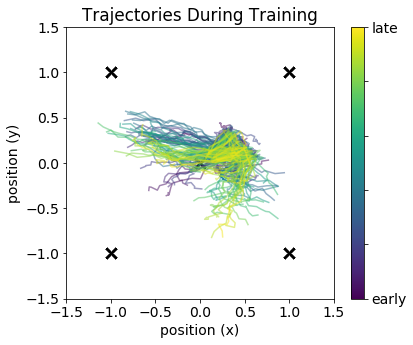

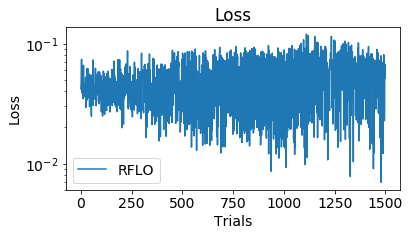

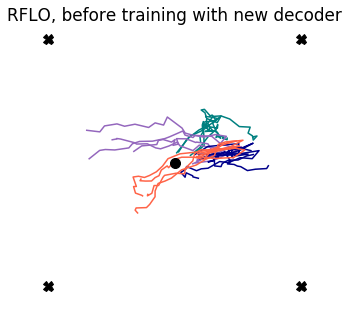

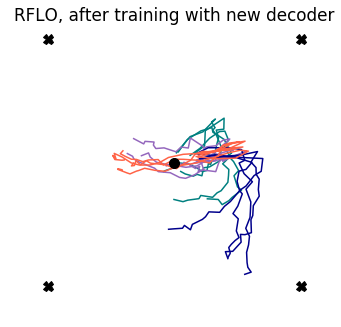

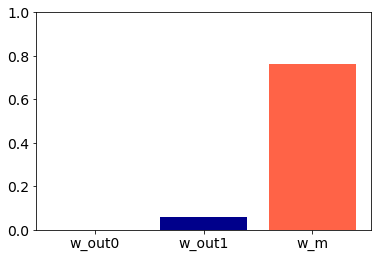

similarity DeltaC1 & DeltaC1_pred_w_out: -0.189
similarity DeltaC1 & DeltaC1_pred_w_out1: -0.001
similarity DeltaC1 & DeltaC1_pred_w_m: 0.650


>> CTRL DeltaC1 & CTRL_h1_pre: -0.318
>> CTRL DeltaC1 & CTRL_h1_post: 0.875
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.250
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: -0.024
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.658




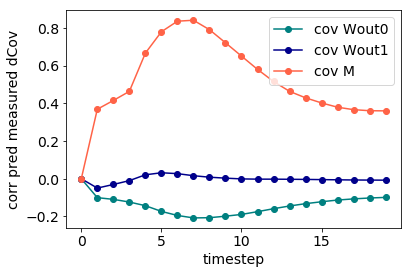

40it [00:00, 397.09it/s]

M norm: 1.38	 M angle: 0.30, 8 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.38	 w_out1 vs. w_m angle: 0.30
w_m norm: 1.78	 w_out vs. w_m angle: 0.17

500it [00:00, 779.64it/s]
1500it [00:04, 313.19it/s]
500it [00:00, 949.02it/s]


AR early fit 0.963, late fit 0.983


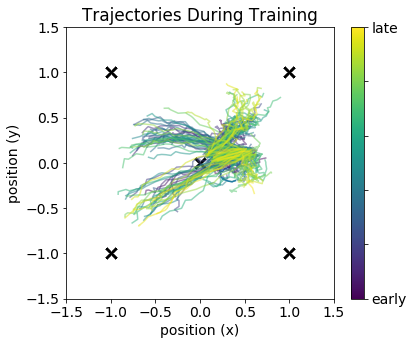

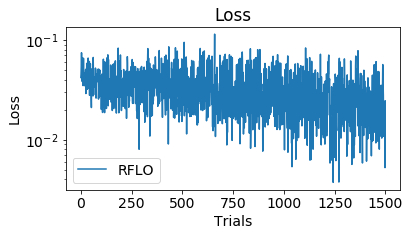

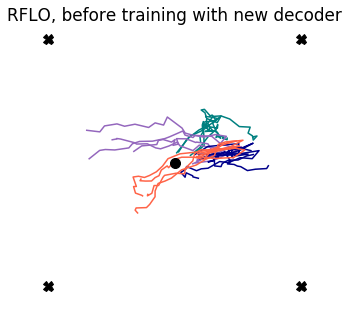

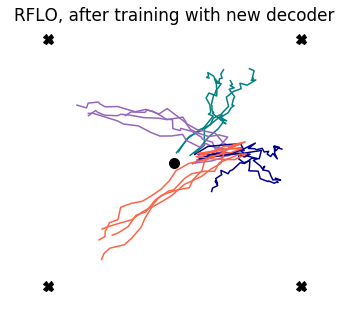

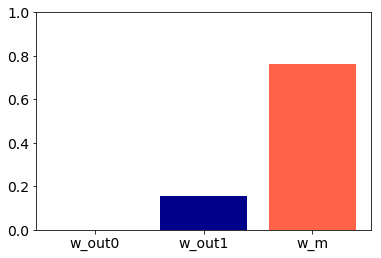

similarity DeltaC1 & DeltaC1_pred_w_out: -0.067
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.117
similarity DeltaC1 & DeltaC1_pred_w_m: 0.876


>> CTRL DeltaC1 & CTRL_h1_pre: -0.086
>> CTRL DeltaC1 & CTRL_h1_post: 0.899
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.061
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.108
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.721




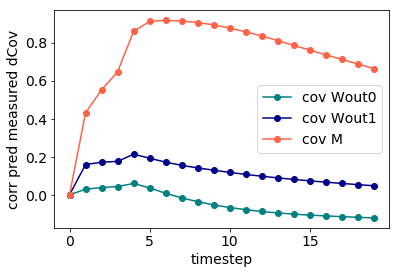

39it [00:00, 386.87it/s]

M norm: 1.32	 M angle: 0.41, 113 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.32	 w_out1 vs. w_m angle: 0.41
w_m norm: 1.84	 w_out vs. w_m angle: 0.15

500it [00:00, 905.12it/s]
1500it [00:04, 356.82it/s]
500it [00:00, 1029.99it/s]


AR early fit 0.963, late fit 0.983


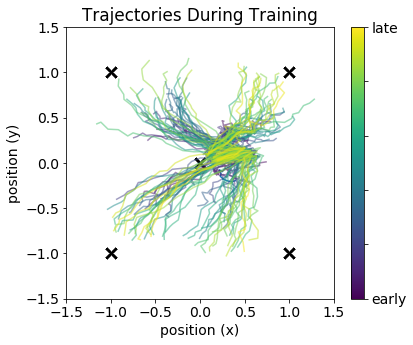

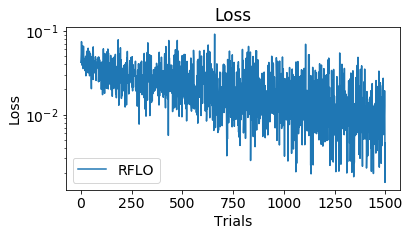

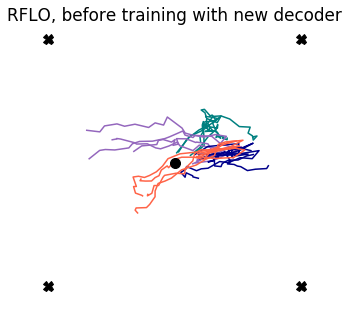

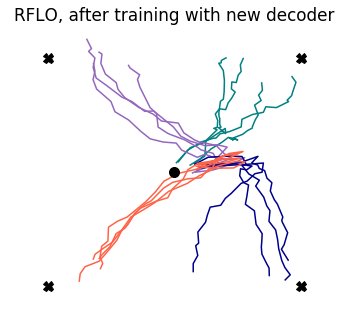

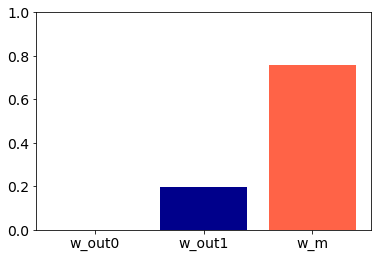

similarity DeltaC1 & DeltaC1_pred_w_out: 0.031
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.266
similarity DeltaC1 & DeltaC1_pred_w_m: 0.881


>> CTRL DeltaC1 & CTRL_h1_pre: 0.129
>> CTRL DeltaC1 & CTRL_h1_post: 0.905
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.017
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.156
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.639




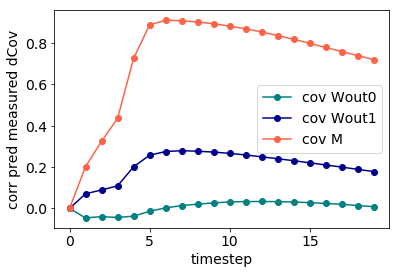

51it [00:00, 509.12it/s]

M norm: 1.21	 M angle: 0.49, 34 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.21	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.85	 w_out vs. w_m angle: 0.11

500it [00:00, 945.09it/s]
1500it [00:04, 353.38it/s]
500it [00:00, 1045.18it/s]


AR early fit 0.963, late fit 0.976


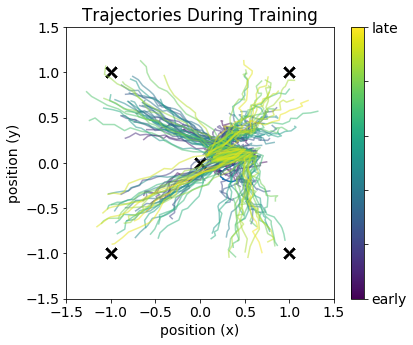

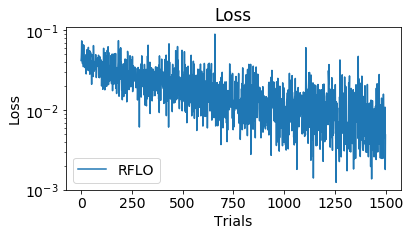

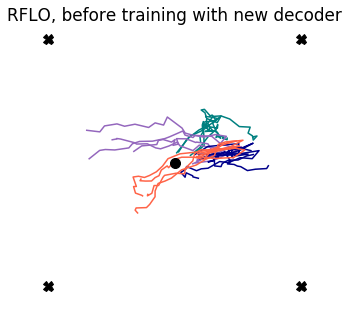

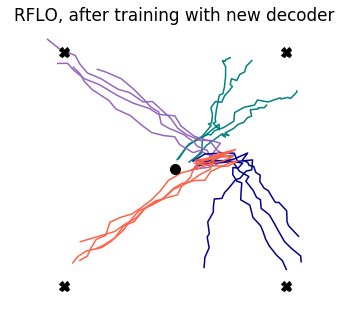

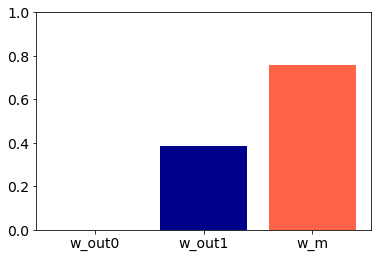

similarity DeltaC1 & DeltaC1_pred_w_out: -0.082
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.457
similarity DeltaC1 & DeltaC1_pred_w_m: 0.873


>> CTRL DeltaC1 & CTRL_h1_pre: -0.046
>> CTRL DeltaC1 & CTRL_h1_post: 0.740
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.082
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.371
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.446




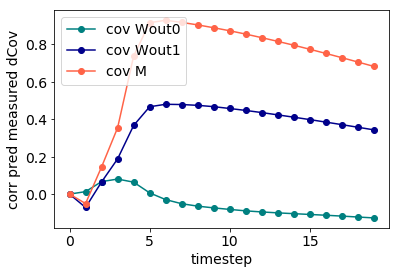

53it [00:00, 529.43it/s]

M norm: 1.11	 M angle: 0.60, 12 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.60
w_m norm: 1.72	 w_out vs. w_m angle: 0.29

500it [00:00, 977.07it/s]
1500it [00:04, 354.39it/s]
500it [00:00, 1107.44it/s]


AR early fit 0.963, late fit 0.981


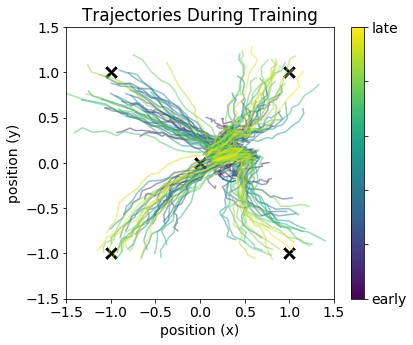

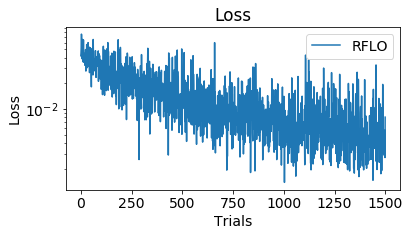

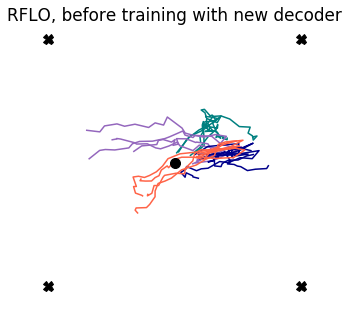

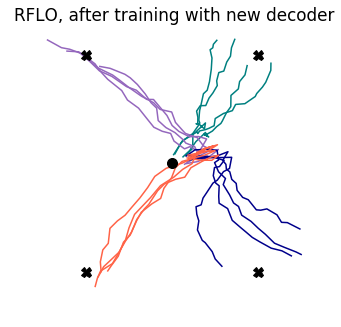

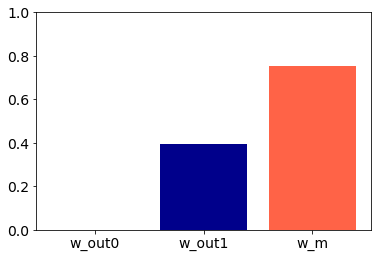

similarity DeltaC1 & DeltaC1_pred_w_out: 0.134
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.509
similarity DeltaC1 & DeltaC1_pred_w_m: 0.928


>> CTRL DeltaC1 & CTRL_h1_pre: 0.256
>> CTRL DeltaC1 & CTRL_h1_post: 0.870
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.075
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.347
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.618




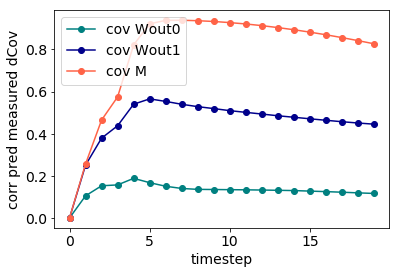

49it [00:00, 488.95it/s]

M norm: 0.97	 M angle: 0.70, 4 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.97	 w_out1 vs. w_m angle: 0.70
w_m norm: 1.67	 w_out vs. w_m angle: 0.33

500it [00:00, 966.37it/s]
1500it [00:04, 357.18it/s]
500it [00:00, 1056.15it/s]


AR early fit 0.963, late fit 0.980


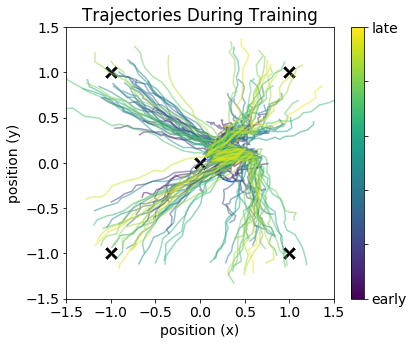

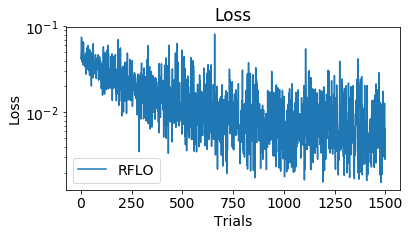

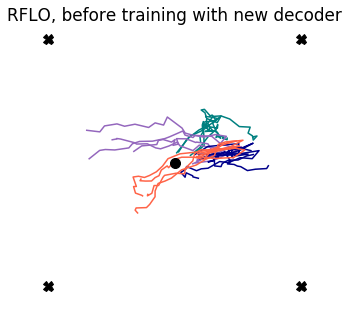

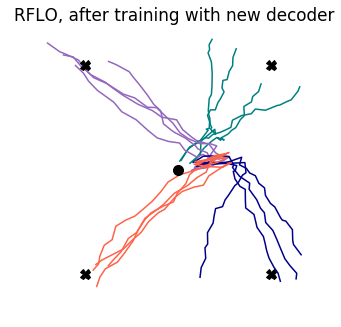

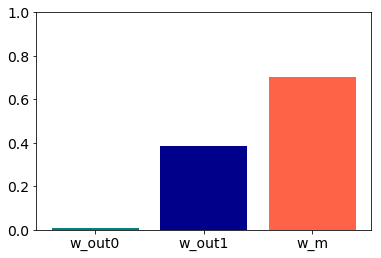

similarity DeltaC1 & DeltaC1_pred_w_out: 0.194
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.538
similarity DeltaC1 & DeltaC1_pred_w_m: 0.922


>> CTRL DeltaC1 & CTRL_h1_pre: 0.245
>> CTRL DeltaC1 & CTRL_h1_post: 0.866
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.149
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.372
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.588




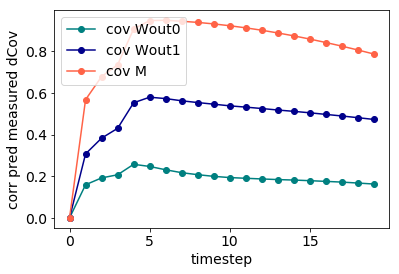

68it [00:00, 674.65it/s]

M norm: 0.80	 M angle: 0.81, 2 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.80	 w_out1 vs. w_m angle: 0.81
w_m norm: 1.69	 w_out vs. w_m angle: 0.35

500it [00:00, 949.14it/s]
1500it [00:04, 211.57it/s]
500it [00:00, 969.63it/s]


AR early fit 0.963, late fit 0.977


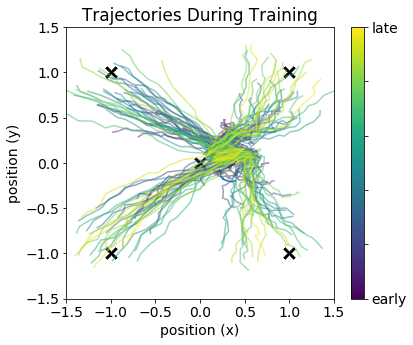

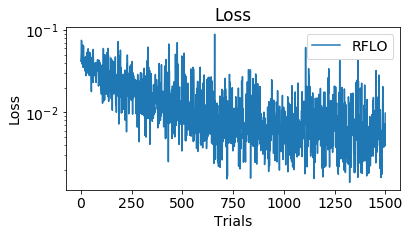

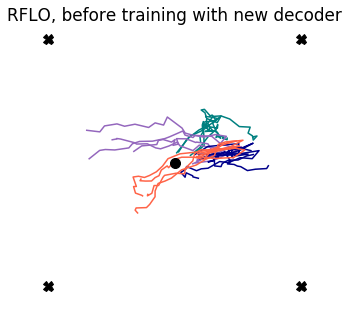

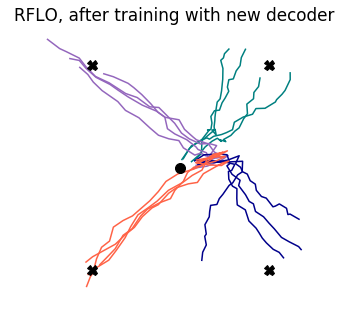

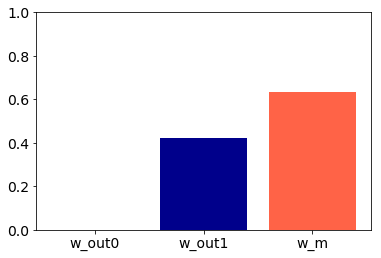

similarity DeltaC1 & DeltaC1_pred_w_out: 0.110
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.629
similarity DeltaC1 & DeltaC1_pred_w_m: 0.899


>> CTRL DeltaC1 & CTRL_h1_pre: 0.170
>> CTRL DeltaC1 & CTRL_h1_post: 0.798
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.078
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.441
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.450




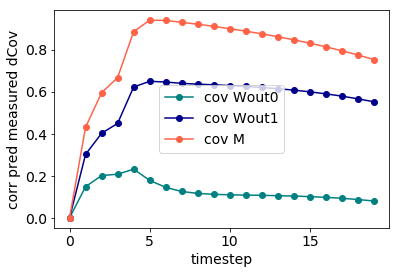

62it [00:00, 617.36it/s]

M norm: 0.56	 M angle: 0.91, 29 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.56	 w_out1 vs. w_m angle: 0.91
w_m norm: 1.63	 w_out vs. w_m angle: 0.40

500it [00:00, 965.76it/s]
1500it [00:04, 348.77it/s]
500it [00:00, 1033.65it/s]


AR early fit 0.963, late fit 0.979


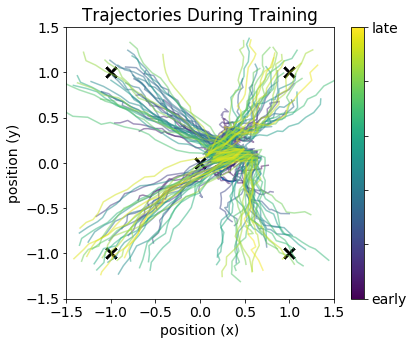

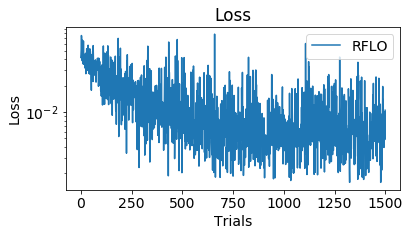

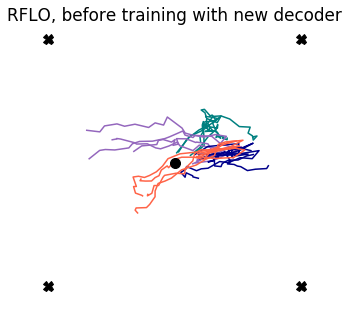

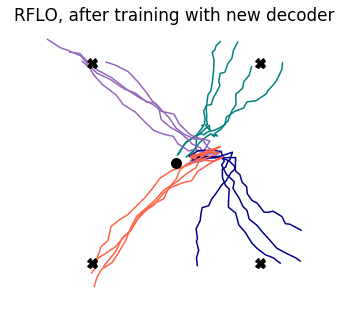

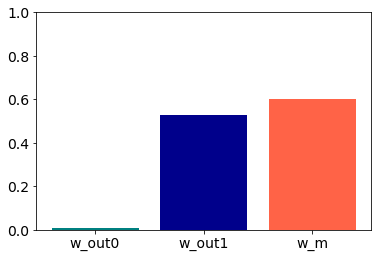

similarity DeltaC1 & DeltaC1_pred_w_out: 0.385
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.851
similarity DeltaC1 & DeltaC1_pred_w_m: 0.913


>> CTRL DeltaC1 & CTRL_h1_pre: 0.469
>> CTRL DeltaC1 & CTRL_h1_post: 0.880
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.287
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.554
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.550




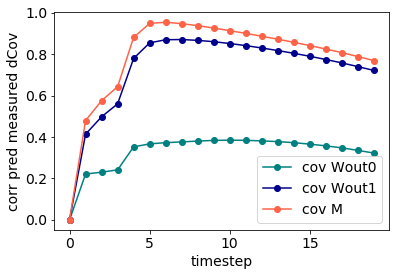

63it [00:00, 628.87it/s]

M norm: 0.00	 M angle: 1.00, 0 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.00	 w_out1 vs. w_m angle: 1.00
w_m norm: 1.52	 w_out vs. w_m angle: 0.51

500it [00:00, 976.93it/s]
1500it [00:04, 367.07it/s]
500it [00:00, 1051.18it/s]


AR early fit 0.963, late fit 0.979


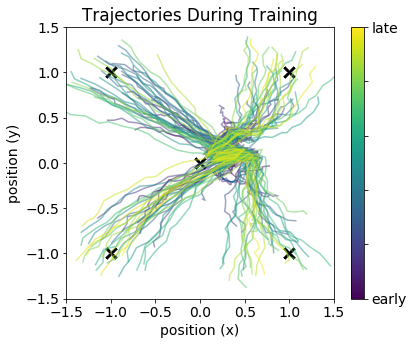

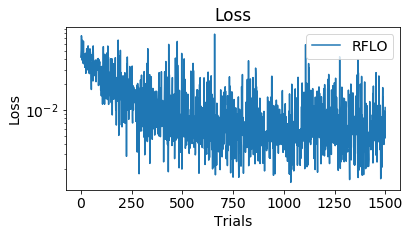

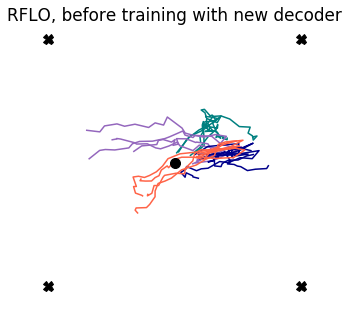

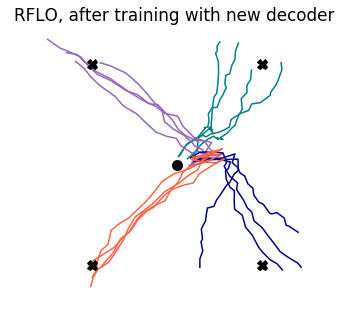

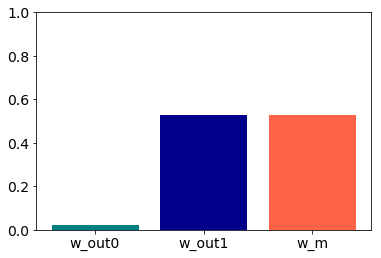

similarity DeltaC1 & DeltaC1_pred_w_out: 0.453
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.916
similarity DeltaC1 & DeltaC1_pred_w_m: 0.916


>> CTRL DeltaC1 & CTRL_h1_pre: 0.505
>> CTRL DeltaC1 & CTRL_h1_post: 0.882
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.357
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.595
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.595




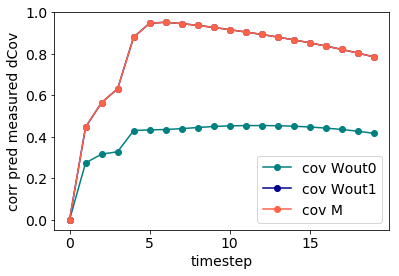

39it [00:00, 379.47it/s]

M norm: 1.37	 M angle: 0.19, 42 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.37	 w_out1 vs. w_m angle: 0.19
w_m norm: 1.84	 w_out vs. w_m angle: 0.08

500it [00:00, 859.05it/s]
1500it [00:04, 311.07it/s]
500it [00:00, 1043.73it/s]


AR early fit 0.963, late fit 0.987


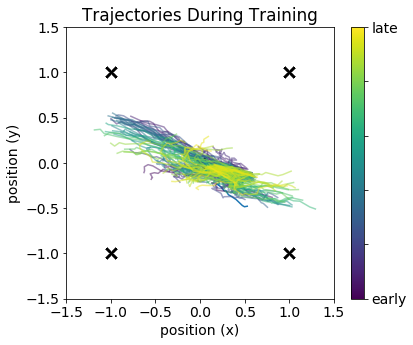

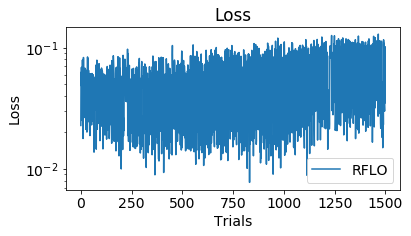

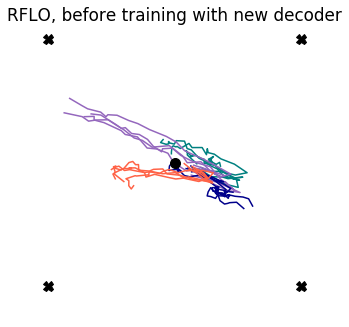

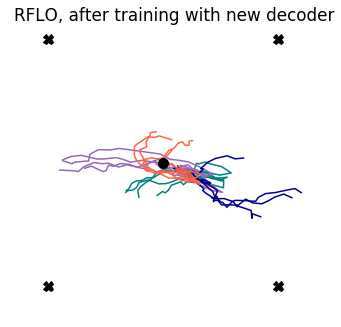

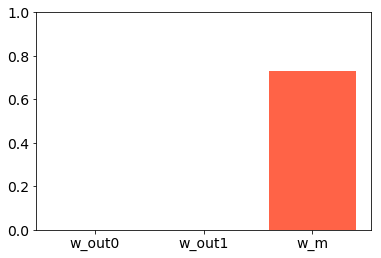

similarity DeltaC1 & DeltaC1_pred_w_out: -0.118
similarity DeltaC1 & DeltaC1_pred_w_out1: -0.047
similarity DeltaC1 & DeltaC1_pred_w_m: 0.895


>> CTRL DeltaC1 & CTRL_h1_pre: -0.116
>> CTRL DeltaC1 & CTRL_h1_post: 0.951
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.132
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: -0.021
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.807




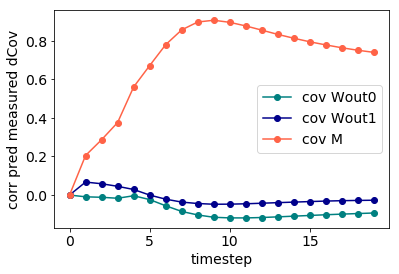

46it [00:00, 456.29it/s]

M norm: 1.29	 M angle: 0.30, 8 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.29	 w_out1 vs. w_m angle: 0.30
w_m norm: 1.84	 w_out vs. w_m angle: 0.08

500it [00:00, 946.66it/s]
1500it [00:04, 357.42it/s]
500it [00:00, 1070.56it/s]


AR early fit 0.963, late fit 0.980


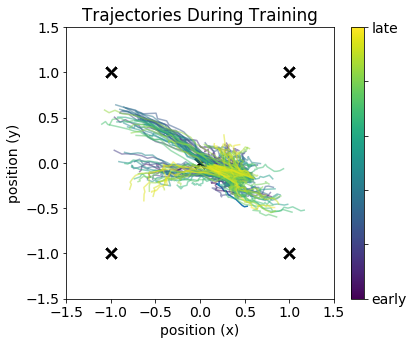

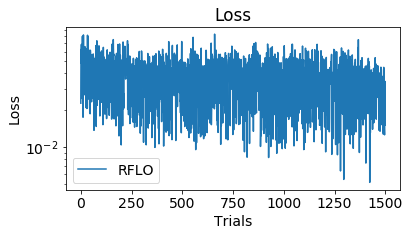

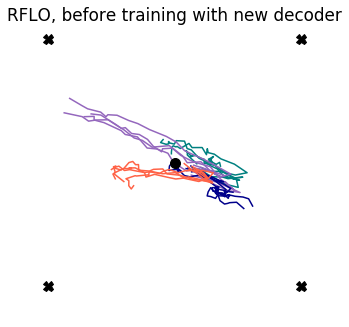

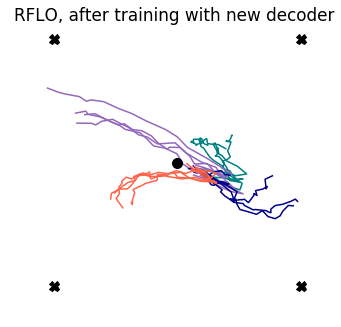

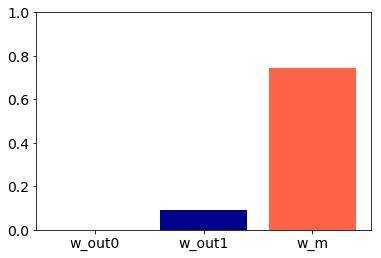

similarity DeltaC1 & DeltaC1_pred_w_out: -0.129
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.042
similarity DeltaC1 & DeltaC1_pred_w_m: 0.901


>> CTRL DeltaC1 & CTRL_h1_pre: -0.205
>> CTRL DeltaC1 & CTRL_h1_post: 0.858
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.142
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.031
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.662




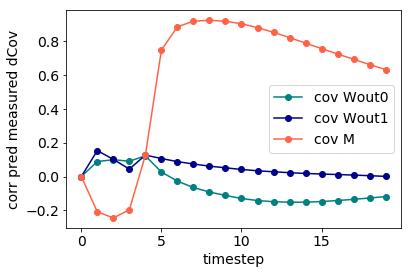

31it [00:00, 302.40it/s]

M norm: 1.18	 M angle: 0.39, 47 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.39
w_m norm: 1.78	 w_out vs. w_m angle: 0.12

500it [00:00, 916.44it/s]
1500it [00:04, 329.62it/s]
500it [00:00, 1025.87it/s]


AR early fit 0.963, late fit 0.981


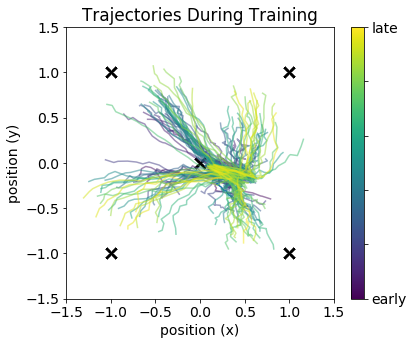

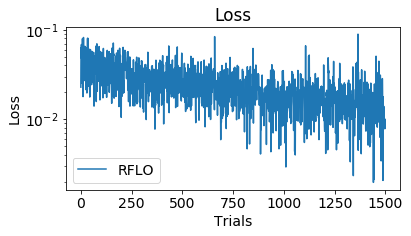

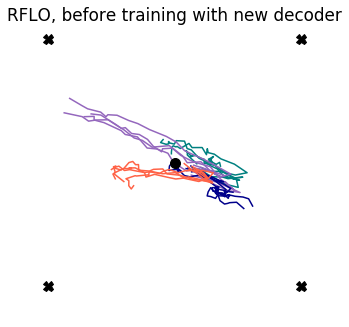

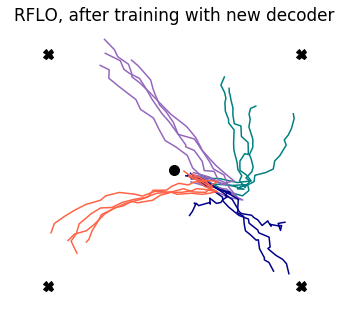

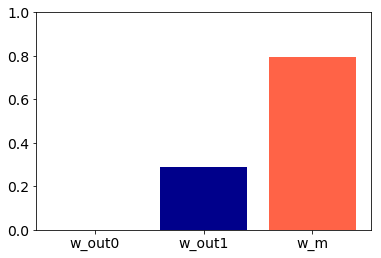

similarity DeltaC1 & DeltaC1_pred_w_out: 0.008
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.248
similarity DeltaC1 & DeltaC1_pred_w_m: 0.945


>> CTRL DeltaC1 & CTRL_h1_pre: -0.002
>> CTRL DeltaC1 & CTRL_h1_post: 0.874
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.023
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.158
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.670




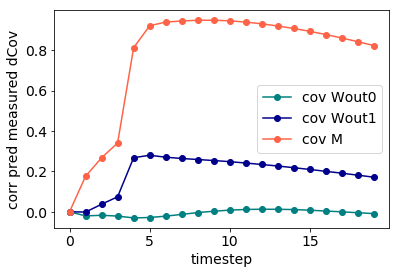

46it [00:00, 456.99it/s]

M norm: 1.13	 M angle: 0.50, 5 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.13	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.76	 w_out vs. w_m angle: 0.21

500it [00:00, 961.13it/s]
1500it [00:04, 363.53it/s]
500it [00:00, 898.31it/s]


AR early fit 0.963, late fit 0.979


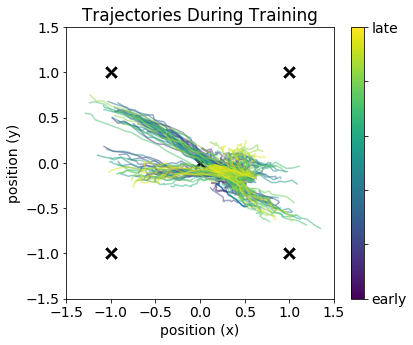

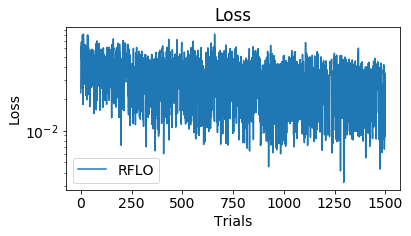

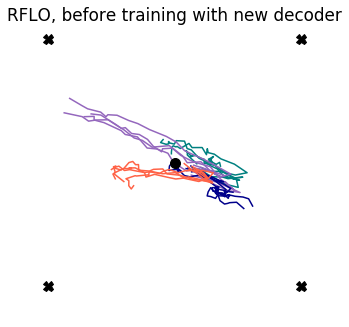

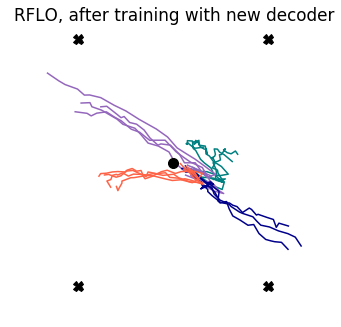

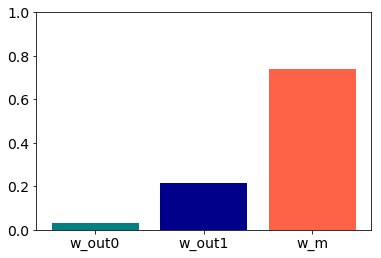

similarity DeltaC1 & DeltaC1_pred_w_out: -0.189
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.097
similarity DeltaC1 & DeltaC1_pred_w_m: 0.884


>> CTRL DeltaC1 & CTRL_h1_pre: -0.215
>> CTRL DeltaC1 & CTRL_h1_post: 0.817
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.184
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.047
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.592




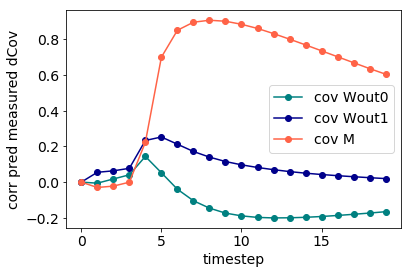

33it [00:00, 328.10it/s]

M norm: 1.01	 M angle: 0.61, 14 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.01	 w_out1 vs. w_m angle: 0.61
w_m norm: 1.67	 w_out vs. w_m angle: 0.31

500it [00:00, 932.61it/s]
1500it [00:04, 350.93it/s]
500it [00:00, 928.55it/s]


AR early fit 0.963, late fit 0.982


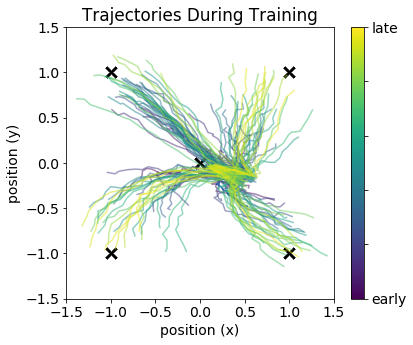

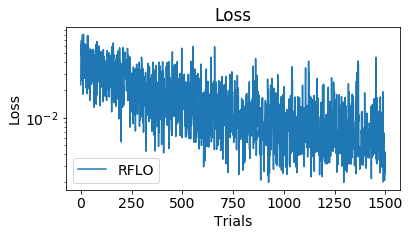

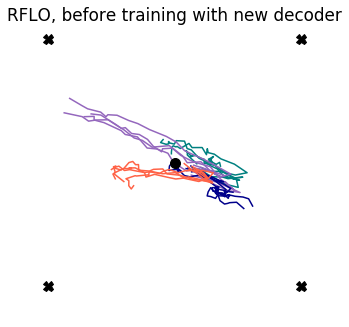

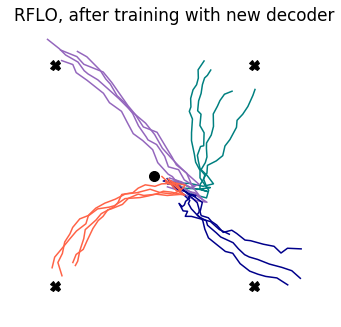

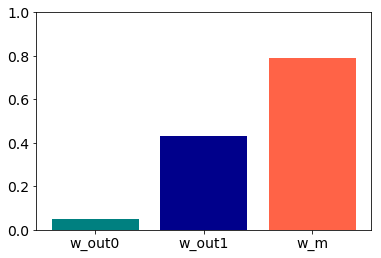

similarity DeltaC1 & DeltaC1_pred_w_out: 0.108
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.491
similarity DeltaC1 & DeltaC1_pred_w_m: 0.949


>> CTRL DeltaC1 & CTRL_h1_pre: 0.168
>> CTRL DeltaC1 & CTRL_h1_post: 0.886
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.081
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.333
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.622




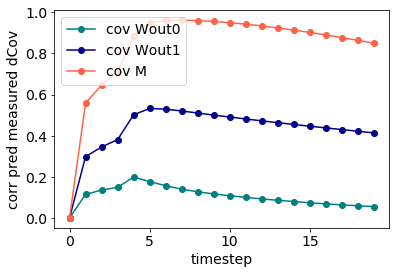

40it [00:00, 396.29it/s]

M norm: 0.89	 M angle: 0.70, 17 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.89	 w_out1 vs. w_m angle: 0.70
w_m norm: 1.57	 w_out vs. w_m angle: 0.41

500it [00:00, 917.64it/s]
1500it [00:04, 363.92it/s]
500it [00:00, 1053.75it/s]


AR early fit 0.963, late fit 0.982


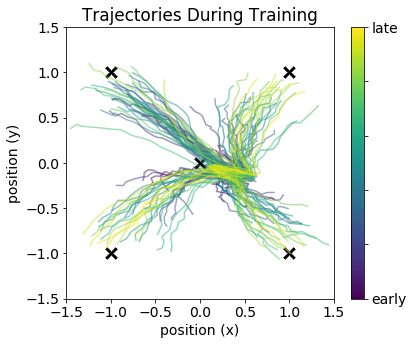

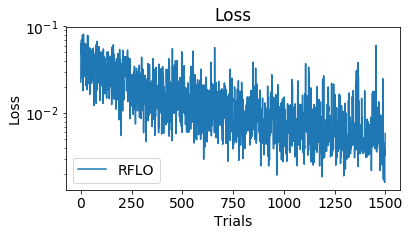

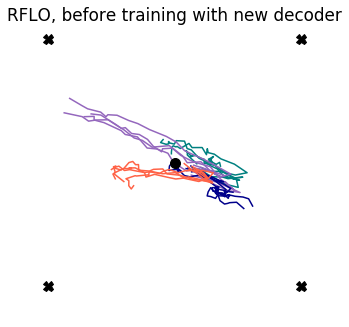

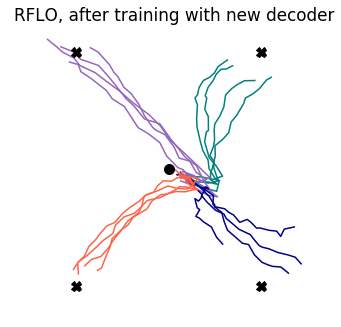

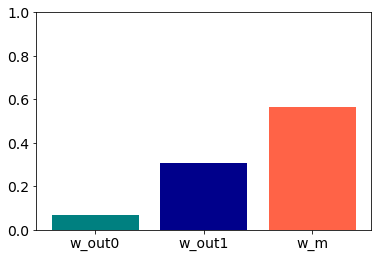

similarity DeltaC1 & DeltaC1_pred_w_out: 0.320
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.544
similarity DeltaC1 & DeltaC1_pred_w_m: 0.929


>> CTRL DeltaC1 & CTRL_h1_pre: 0.311
>> CTRL DeltaC1 & CTRL_h1_post: 0.910
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.286
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.338
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.666




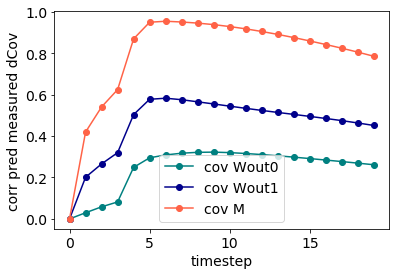

36it [00:00, 359.54it/s]

M norm: 0.73	 M angle: 0.80, 0 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.73	 w_out1 vs. w_m angle: 0.80
w_m norm: 1.66	 w_out vs. w_m angle: 0.33

500it [00:00, 935.64it/s]
1500it [00:04, 358.47it/s]
500it [00:00, 1082.23it/s]


AR early fit 0.963, late fit 0.980


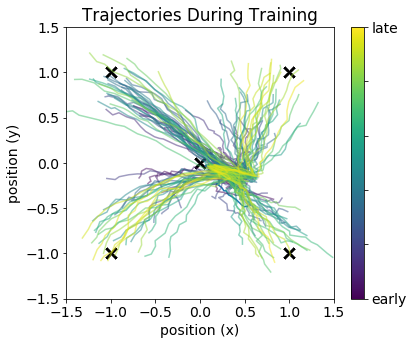

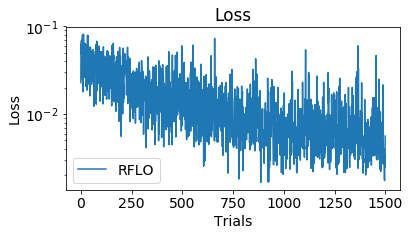

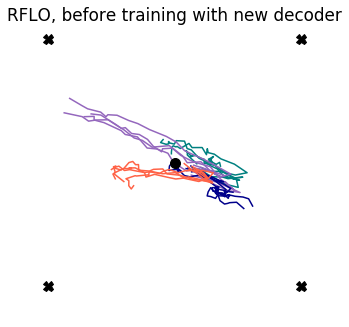

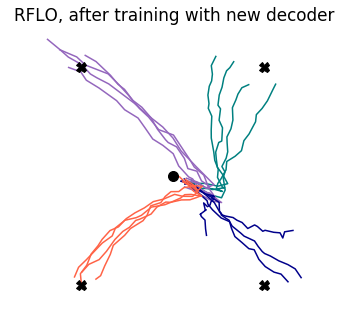

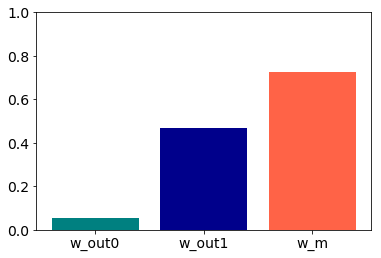

similarity DeltaC1 & DeltaC1_pred_w_out: 0.160
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.620
similarity DeltaC1 & DeltaC1_pred_w_m: 0.929


>> CTRL DeltaC1 & CTRL_h1_pre: 0.191
>> CTRL DeltaC1 & CTRL_h1_post: 0.869
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.131
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.424
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.582




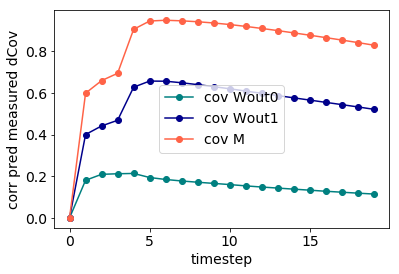

36it [00:00, 359.14it/s]

M norm: 0.53	 M angle: 0.90, 252 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.53	 w_out1 vs. w_m angle: 0.90
w_m norm: 1.55	 w_out vs. w_m angle: 0.45

500it [00:00, 847.71it/s]
1500it [00:04, 348.64it/s]
500it [00:00, 1073.84it/s]


AR early fit 0.963, late fit 0.982


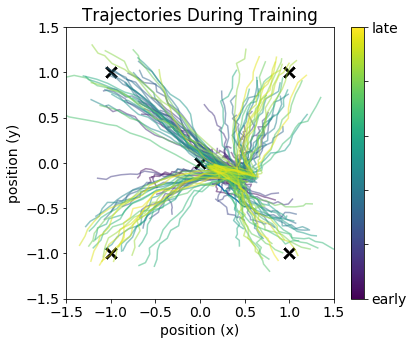

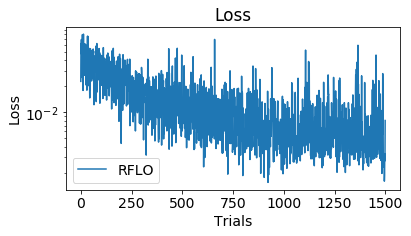

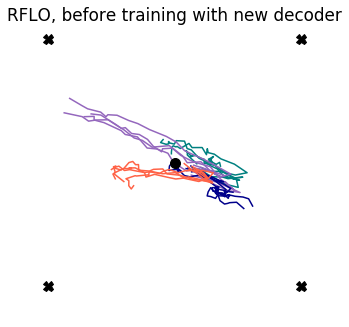

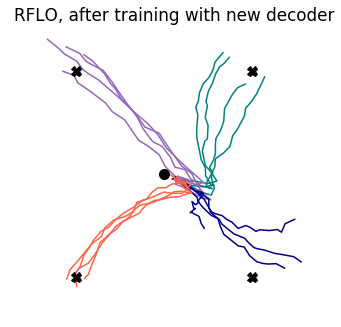

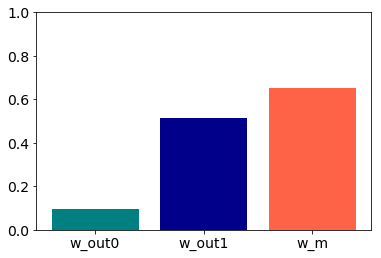

similarity DeltaC1 & DeltaC1_pred_w_out: 0.364
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.694
similarity DeltaC1 & DeltaC1_pred_w_m: 0.925


>> CTRL DeltaC1 & CTRL_h1_pre: 0.396
>> CTRL DeltaC1 & CTRL_h1_post: 0.912
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.317
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.424
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.627




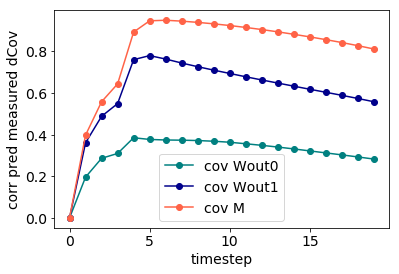

36it [00:00, 349.16it/s]

M norm: 0.00	 M angle: 1.00, 0 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.00	 w_out1 vs. w_m angle: 1.00
w_m norm: 1.50	 w_out vs. w_m angle: 0.50

500it [00:00, 913.14it/s]
1500it [00:04, 353.56it/s]
500it [00:00, 1048.97it/s]


AR early fit 0.963, late fit 0.979


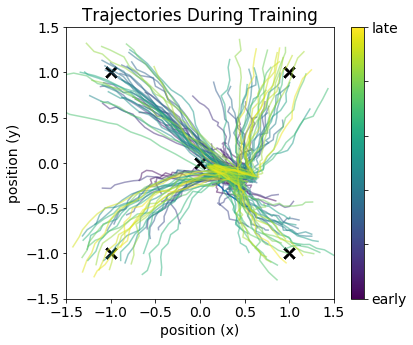

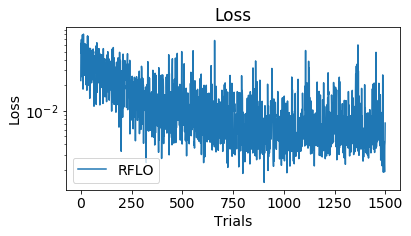

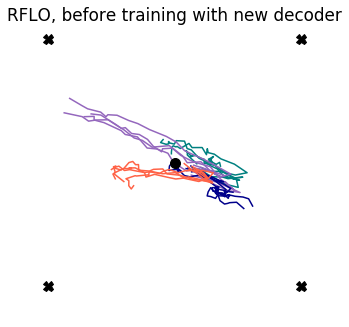

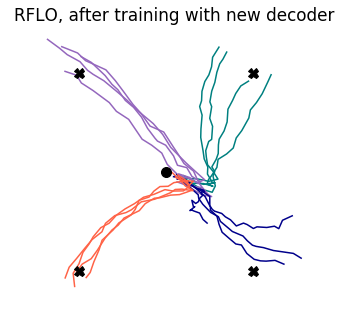

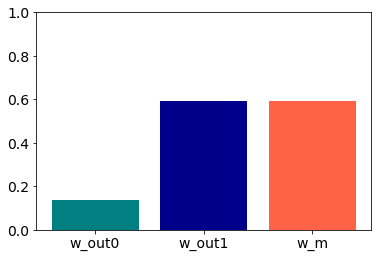

similarity DeltaC1 & DeltaC1_pred_w_out: 0.422
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.934
similarity DeltaC1 & DeltaC1_pred_w_m: 0.934


>> CTRL DeltaC1 & CTRL_h1_pre: 0.420
>> CTRL DeltaC1 & CTRL_h1_post: 0.878
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.374
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.612
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.612




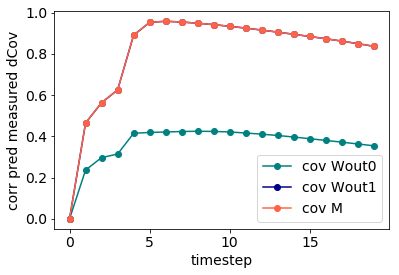

91it [00:00, 907.29it/s]

M norm: 1.38	 M angle: 0.21, 1 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.38	 w_out1 vs. w_m angle: 0.21
w_m norm: 1.87	 w_out vs. w_m angle: 0.04

500it [00:00, 1027.08it/s]
1500it [00:04, 358.01it/s]
500it [00:00, 1083.97it/s]


AR early fit 0.963, late fit 0.977


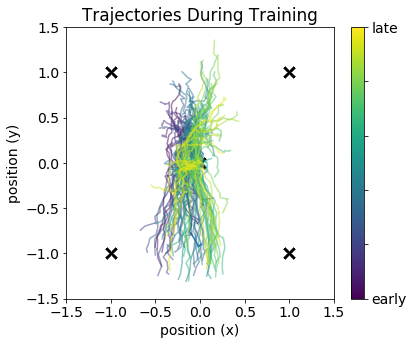

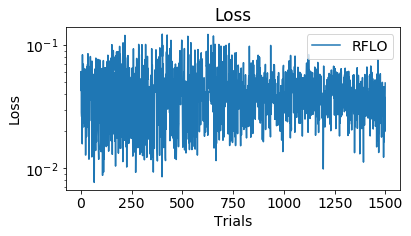

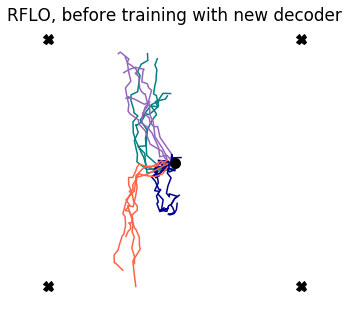

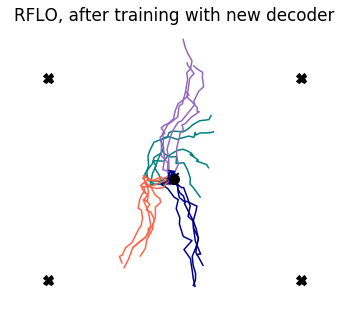

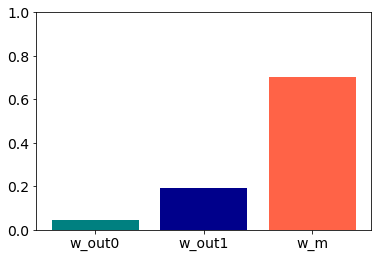

similarity DeltaC1 & DeltaC1_pred_w_out: -0.155
similarity DeltaC1 & DeltaC1_pred_w_out1: -0.058
similarity DeltaC1 & DeltaC1_pred_w_m: 0.738


>> CTRL DeltaC1 & CTRL_h1_pre: -0.340
>> CTRL DeltaC1 & CTRL_h1_post: 0.529
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.229
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.007
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.447




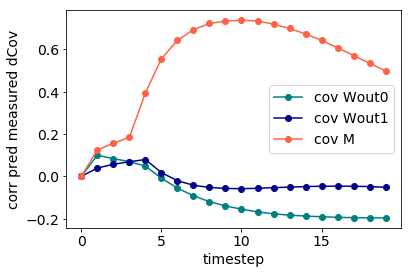

60it [00:00, 598.78it/s]

M norm: 1.31	 M angle: 0.30, 7 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.31	 w_out1 vs. w_m angle: 0.30
w_m norm: 1.72	 w_out vs. w_m angle: 0.23

500it [00:00, 984.25it/s]
1500it [00:04, 360.39it/s]
500it [00:00, 1045.68it/s]


AR early fit 0.963, late fit 0.982


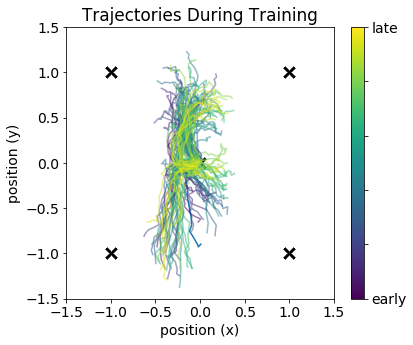

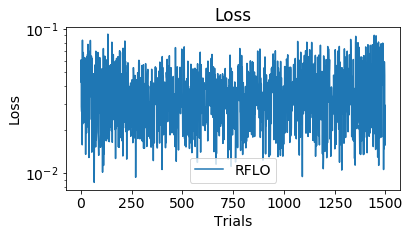

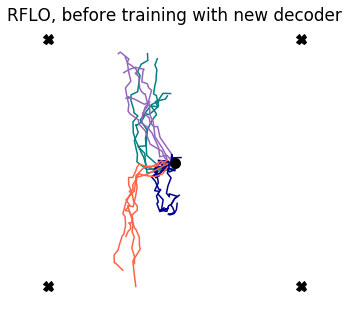

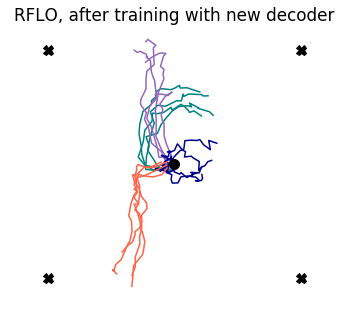

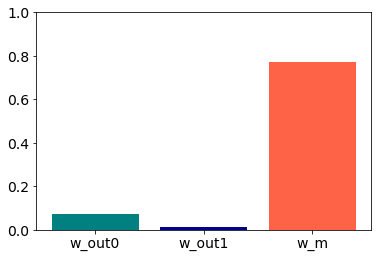

similarity DeltaC1 & DeltaC1_pred_w_out: -0.009
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.041
similarity DeltaC1 & DeltaC1_pred_w_m: 0.885


>> CTRL DeltaC1 & CTRL_h1_pre: -0.103
>> CTRL DeltaC1 & CTRL_h1_post: 0.814
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.001
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.007
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.714




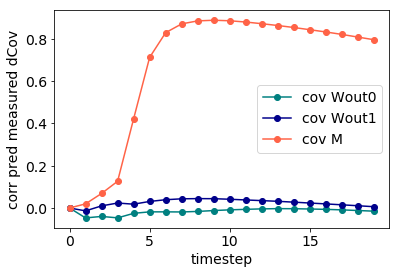

57it [00:00, 569.83it/s]

M norm: 1.28	 M angle: 0.40, 7 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.28	 w_out1 vs. w_m angle: 0.40
w_m norm: 1.77	 w_out vs. w_m angle: 0.23

500it [00:00, 945.93it/s]
1500it [00:04, 349.89it/s]
500it [00:00, 1084.53it/s]


AR early fit 0.963, late fit 0.983


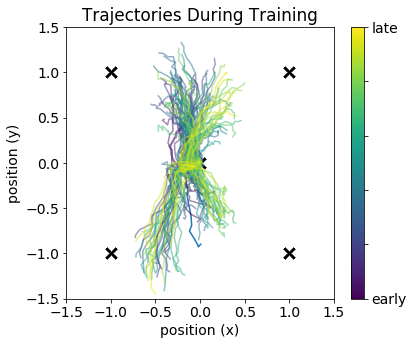

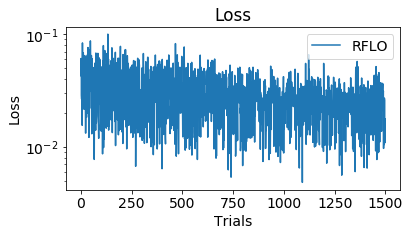

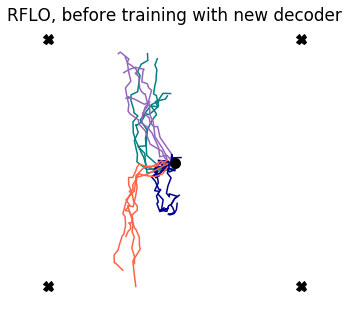

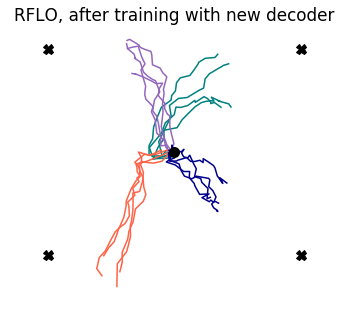

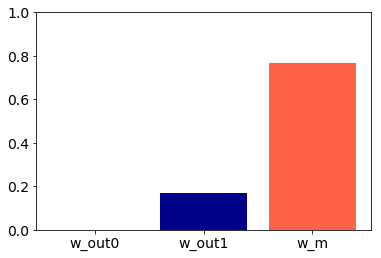

similarity DeltaC1 & DeltaC1_pred_w_out: -0.016
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.171
similarity DeltaC1 & DeltaC1_pred_w_m: 0.880


>> CTRL DeltaC1 & CTRL_h1_pre: 0.076
>> CTRL DeltaC1 & CTRL_h1_post: 0.872
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.040
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.057
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.655




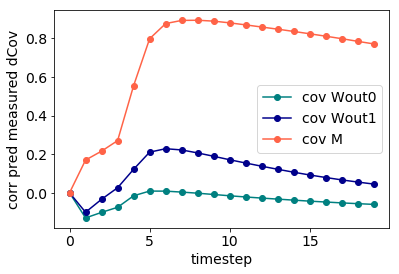

94it [00:00, 934.67it/s]

M norm: 1.14	 M angle: 0.51, 9 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.14	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.84	 w_out vs. w_m angle: 0.14

500it [00:00, 1028.36it/s]
1500it [00:04, 358.68it/s]
500it [00:00, 1025.94it/s]


AR early fit 0.963, late fit 0.978


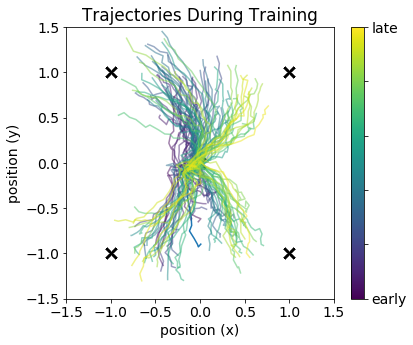

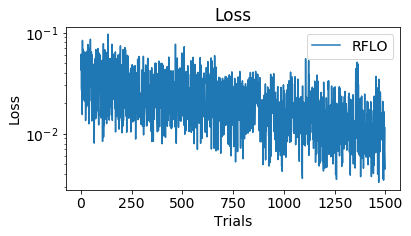

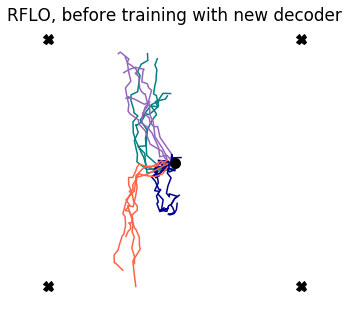

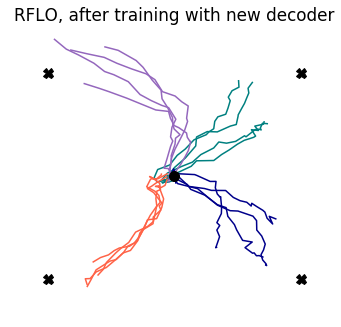

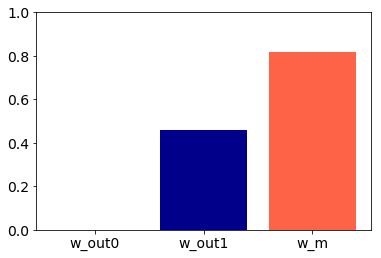

similarity DeltaC1 & DeltaC1_pred_w_out: -0.126
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.328
similarity DeltaC1 & DeltaC1_pred_w_m: 0.882


>> CTRL DeltaC1 & CTRL_h1_pre: -0.012
>> CTRL DeltaC1 & CTRL_h1_post: 0.796
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.139
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.215
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.561




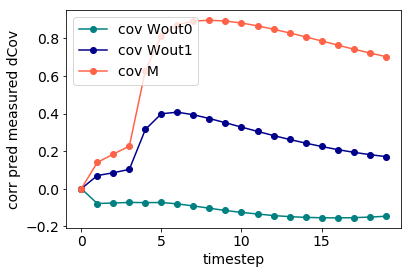

82it [00:00, 812.77it/s]

M norm: 1.07	 M angle: 0.59, 17 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.07	 w_out1 vs. w_m angle: 0.59
w_m norm: 1.64	 w_out vs. w_m angle: 0.36

500it [00:00, 1026.82it/s]
1500it [00:04, 346.85it/s]
500it [00:00, 893.54it/s]


AR early fit 0.963, late fit 0.979


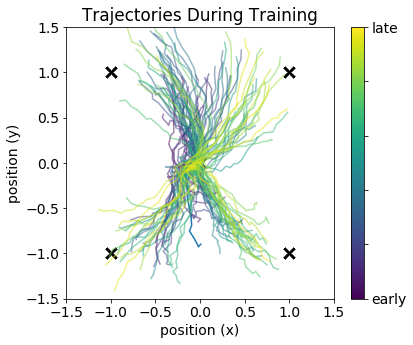

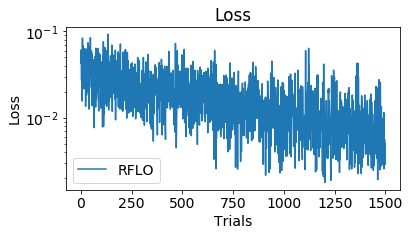

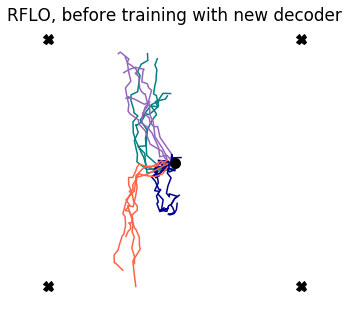

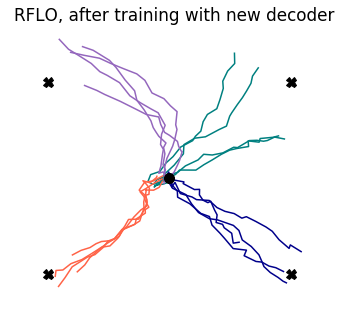

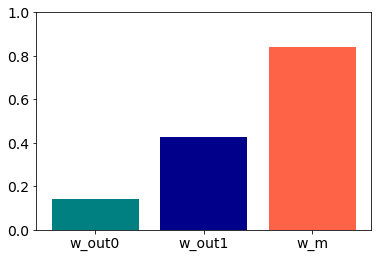

similarity DeltaC1 & DeltaC1_pred_w_out: 0.048
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.390
similarity DeltaC1 & DeltaC1_pred_w_m: 0.921


>> CTRL DeltaC1 & CTRL_h1_pre: 0.049
>> CTRL DeltaC1 & CTRL_h1_post: 0.805
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.036
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.237
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.582




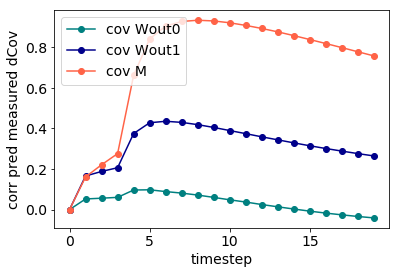

90it [00:00, 894.69it/s]

M norm: 0.93	 M angle: 0.70, 0 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.93	 w_out1 vs. w_m angle: 0.70
w_m norm: 1.45	 w_out vs. w_m angle: 0.52

500it [00:00, 1039.46it/s]
1500it [00:04, 358.23it/s]
500it [00:00, 1034.02it/s]


AR early fit 0.963, late fit 0.980


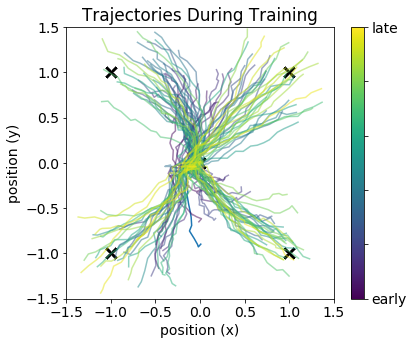

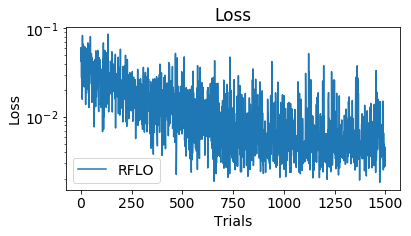

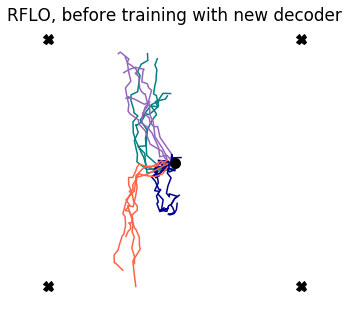

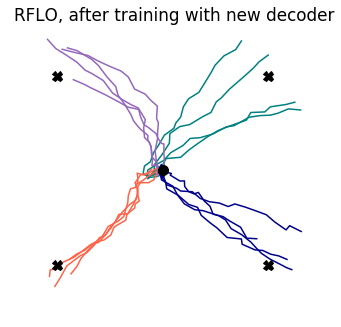

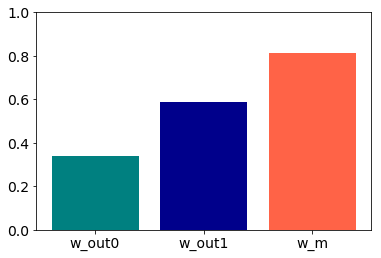

similarity DeltaC1 & DeltaC1_pred_w_out: 0.500
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.657
similarity DeltaC1 & DeltaC1_pred_w_m: 0.920


>> CTRL DeltaC1 & CTRL_h1_pre: 0.377
>> CTRL DeltaC1 & CTRL_h1_post: 0.875
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.467
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.308
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.637




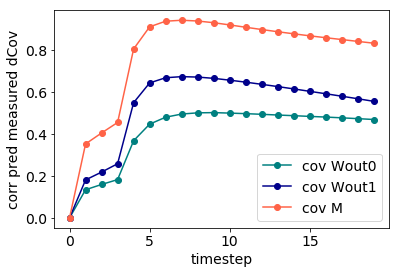

92it [00:00, 919.98it/s]

M norm: 0.76	 M angle: 0.80, 10 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.76	 w_out1 vs. w_m angle: 0.80
w_m norm: 1.56	 w_out vs. w_m angle: 0.43

500it [00:00, 1051.18it/s]
1500it [00:04, 346.87it/s]
500it [00:00, 1056.24it/s]


AR early fit 0.963, late fit 0.978


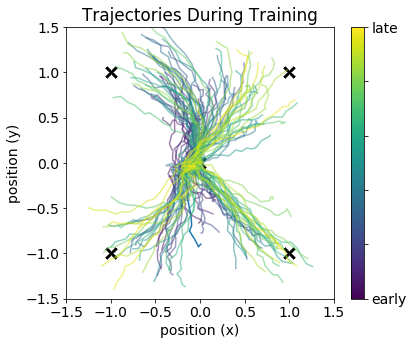

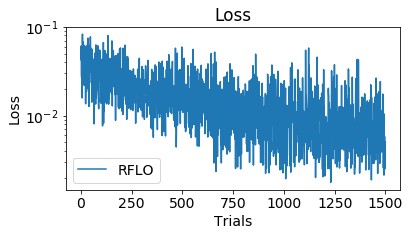

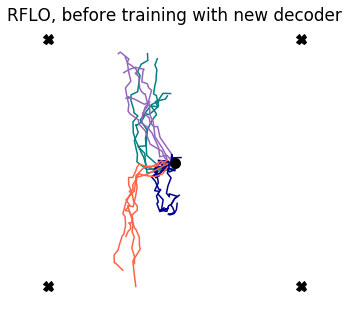

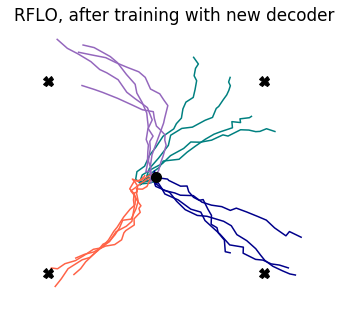

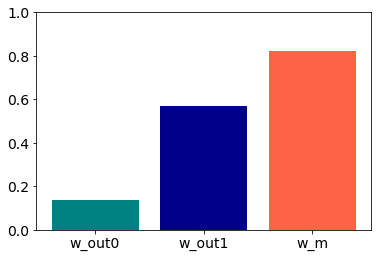

similarity DeltaC1 & DeltaC1_pred_w_out: 0.103
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.561
similarity DeltaC1 & DeltaC1_pred_w_m: 0.901


>> CTRL DeltaC1 & CTRL_h1_pre: 0.161
>> CTRL DeltaC1 & CTRL_h1_post: 0.792
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.086
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.331
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.591




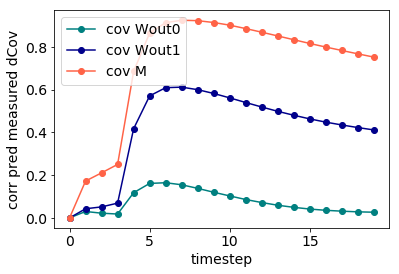

79it [00:00, 783.54it/s]

M norm: 0.54	 M angle: 0.90, 1 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.54	 w_out1 vs. w_m angle: 0.90
w_m norm: 1.50	 w_out vs. w_m angle: 0.50

500it [00:00, 947.24it/s]
1500it [00:04, 345.03it/s]
500it [00:00, 1075.91it/s]


AR early fit 0.963, late fit 0.977


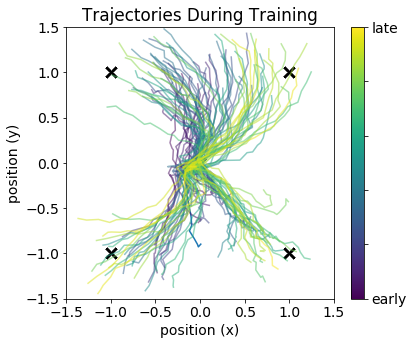

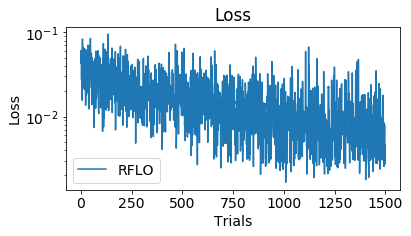

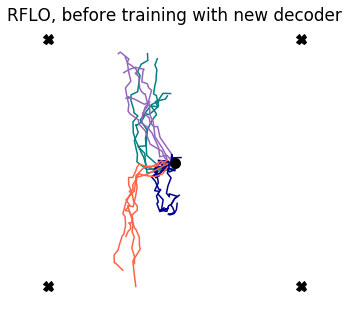

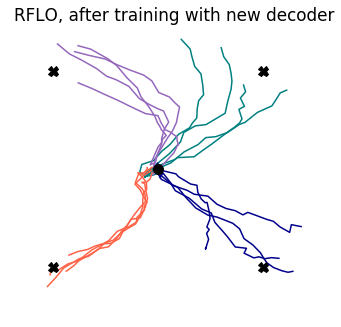

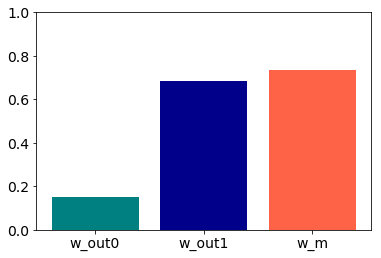

similarity DeltaC1 & DeltaC1_pred_w_out: 0.099
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.723
similarity DeltaC1 & DeltaC1_pred_w_m: 0.881


>> CTRL DeltaC1 & CTRL_h1_pre: 0.265
>> CTRL DeltaC1 & CTRL_h1_post: 0.796
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.090
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.379
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.587




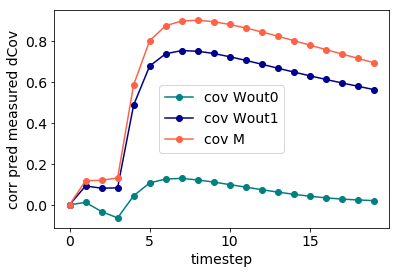

67it [00:00, 668.28it/s]

M norm: 0.00	 M angle: 1.00, 0 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 0.00	 w_out1 vs. w_m angle: 1.00
w_m norm: 1.50	 w_out vs. w_m angle: 0.50

500it [00:00, 963.54it/s]
1500it [00:04, 365.30it/s]
500it [00:00, 1086.19it/s]


AR early fit 0.963, late fit 0.977


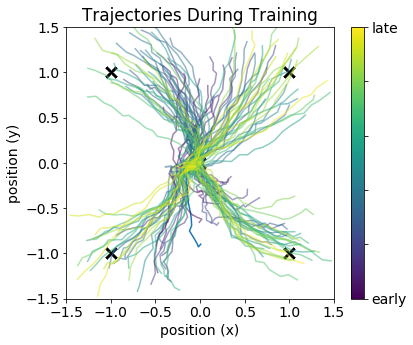

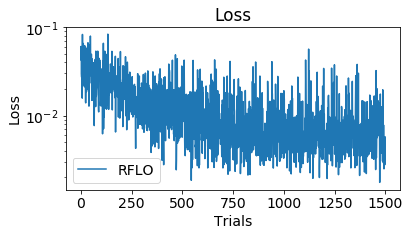

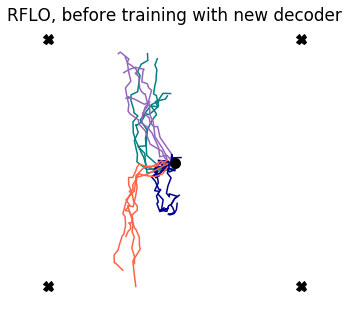

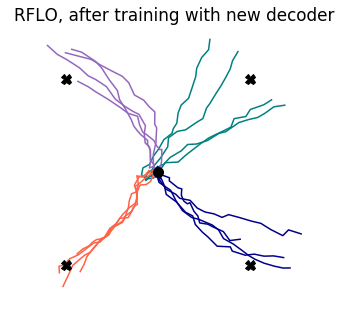

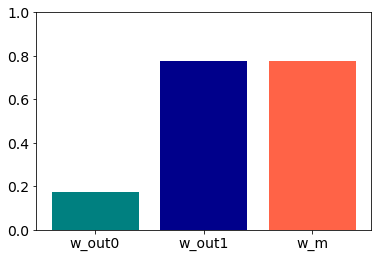

similarity DeltaC1 & DeltaC1_pred_w_out: 0.328
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.894
similarity DeltaC1 & DeltaC1_pred_w_m: 0.894


>> CTRL DeltaC1 & CTRL_h1_pre: 0.429
>> CTRL DeltaC1 & CTRL_h1_post: 0.839
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.276
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.454
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.454




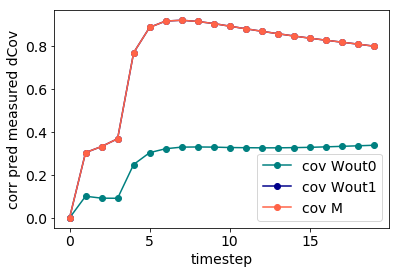

82it [00:00, 816.66it/s]

M norm: 1.35	 M angle: 0.20, 12 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.35	 w_out1 vs. w_m angle: 0.20
w_m norm: 1.72	 w_out vs. w_m angle: 0.21

500it [00:00, 1011.51it/s]
1500it [00:04, 341.21it/s]
500it [00:00, 1075.53it/s]


AR early fit 0.963, late fit 0.987


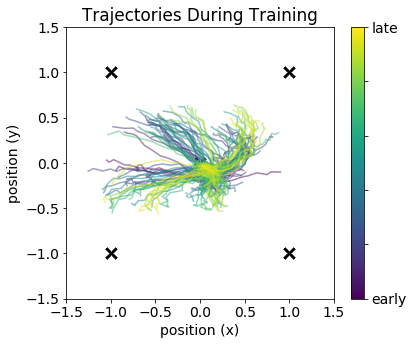

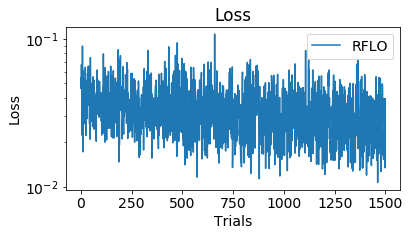

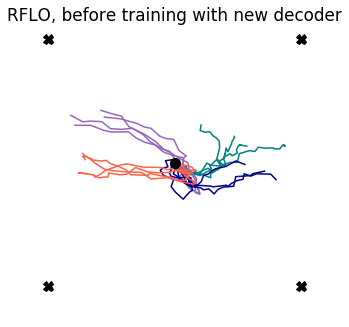

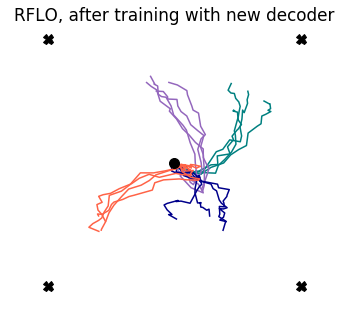

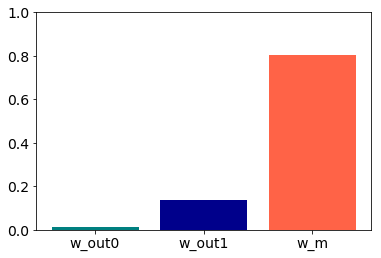

similarity DeltaC1 & DeltaC1_pred_w_out: 0.083
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.084
similarity DeltaC1 & DeltaC1_pred_w_m: 0.953


>> CTRL DeltaC1 & CTRL_h1_pre: 0.033
>> CTRL DeltaC1 & CTRL_h1_post: 0.948
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.076
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.026
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.805




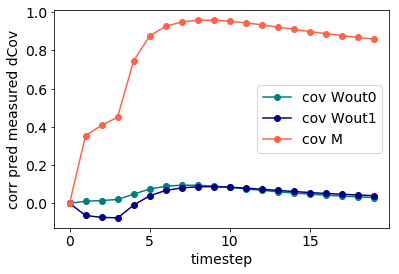

162it [00:00, 725.85it/s]

M norm: 1.27	 M angle: 0.31, 5 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.27	 w_out1 vs. w_m angle: 0.31
w_m norm: 1.72	 w_out vs. w_m angle: 0.23

500it [00:00, 907.91it/s]
1500it [00:04, 332.48it/s]
500it [00:00, 977.93it/s]


AR early fit 0.963, late fit 0.985


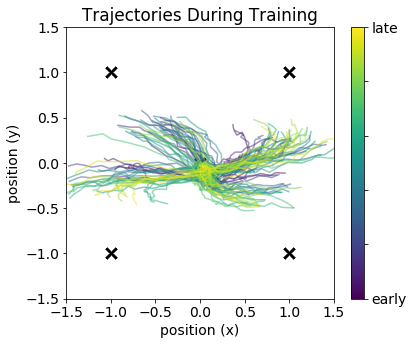

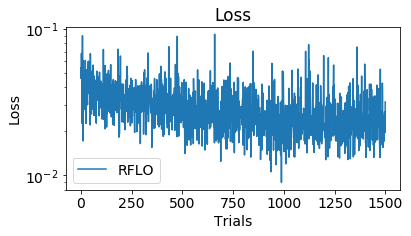

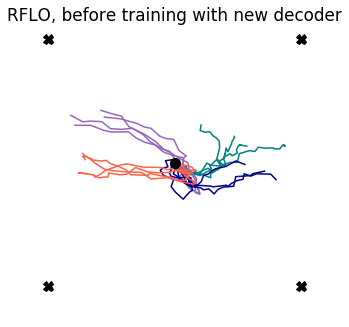

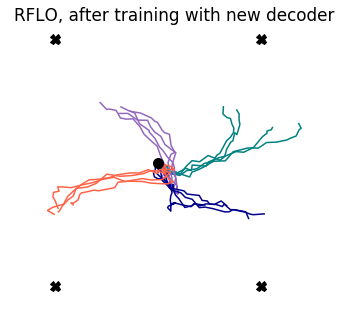

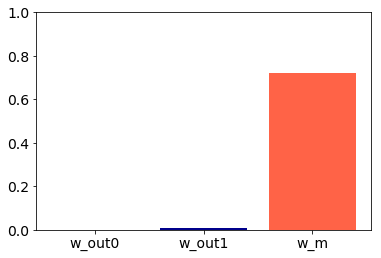

similarity DeltaC1 & DeltaC1_pred_w_out: -0.080
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.067
similarity DeltaC1 & DeltaC1_pred_w_m: 0.900


>> CTRL DeltaC1 & CTRL_h1_pre: -0.038
>> CTRL DeltaC1 & CTRL_h1_post: 0.915
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.073
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.024
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.747




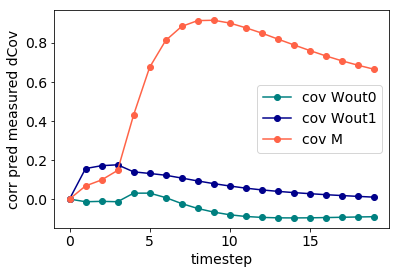

64it [00:00, 636.26it/s]

M norm: 1.17	 M angle: 0.39, 6 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.39
w_m norm: 1.76	 w_out vs. w_m angle: 0.16

500it [00:00, 930.75it/s]
1500it [00:04, 345.00it/s]
500it [00:00, 1082.22it/s]


AR early fit 0.963, late fit 0.978


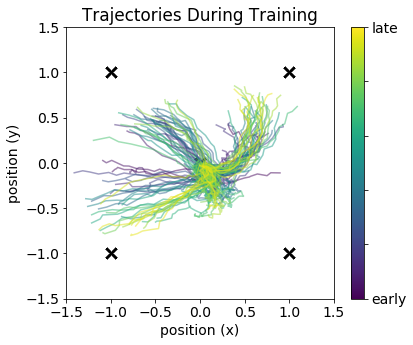

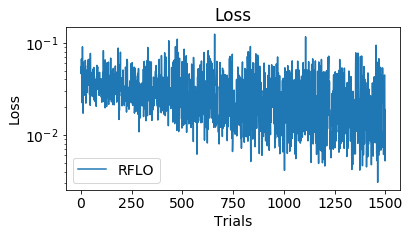

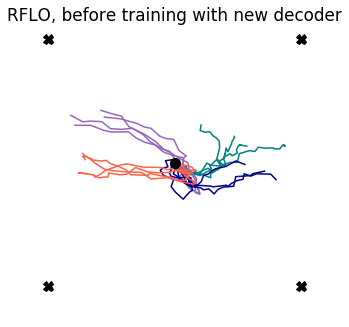

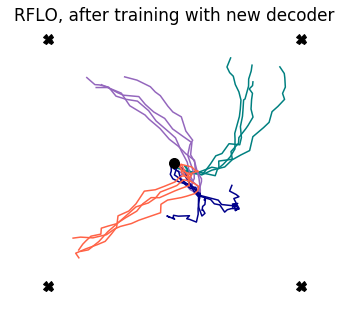

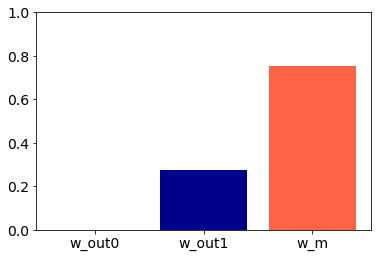

similarity DeltaC1 & DeltaC1_pred_w_out: -0.066
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.358
similarity DeltaC1 & DeltaC1_pred_w_m: 0.903


>> CTRL DeltaC1 & CTRL_h1_pre: -0.126
>> CTRL DeltaC1 & CTRL_h1_post: 0.776
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: -0.074
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.224
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.597




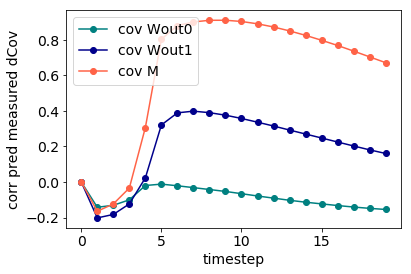

85it [00:00, 846.99it/s]

M norm: 1.11	 M angle: 0.50, 11 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.70	 w_out vs. w_m angle: 0.26

500it [00:00, 1029.46it/s]
1500it [00:04, 360.56it/s]
500it [00:00, 999.22it/s]


AR early fit 0.963, late fit 0.982


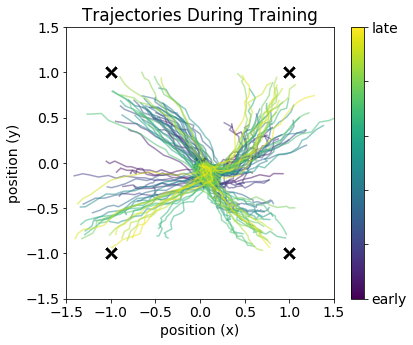

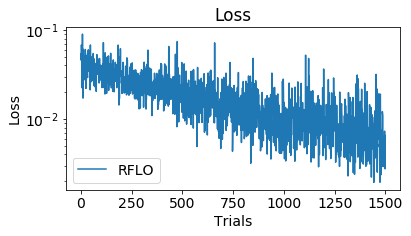

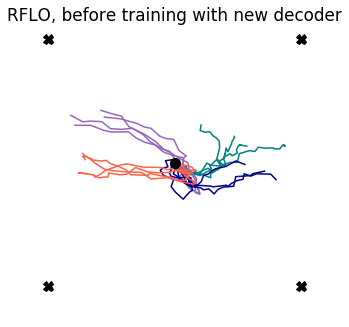

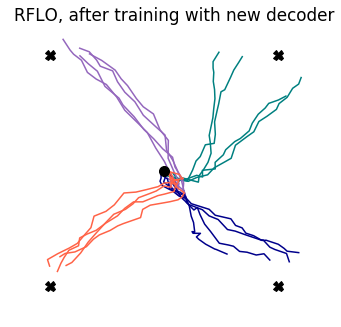

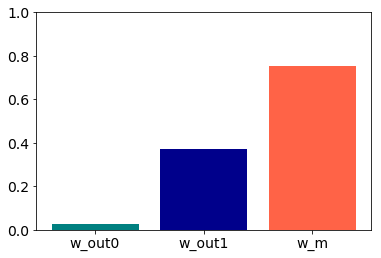

similarity DeltaC1 & DeltaC1_pred_w_out: 0.091
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.439
similarity DeltaC1 & DeltaC1_pred_w_m: 0.899


>> CTRL DeltaC1 & CTRL_h1_pre: 0.102
>> CTRL DeltaC1 & CTRL_h1_post: 0.868
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.077
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.236
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.616




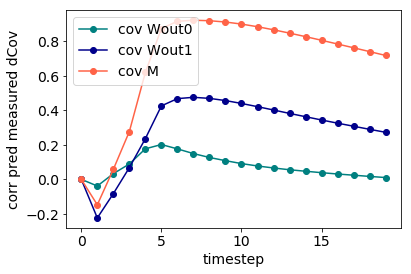

189it [00:00, 875.03it/s]

M norm: 1.00	 M angle: 0.60, 3 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.00	 w_out1 vs. w_m angle: 0.60
w_m norm: 1.56	 w_out vs. w_m angle: 0.41

500it [00:00, 1013.04it/s]
1500it [00:04, 357.16it/s]
500it [00:00, 1052.97it/s]


AR early fit 0.963, late fit 0.982


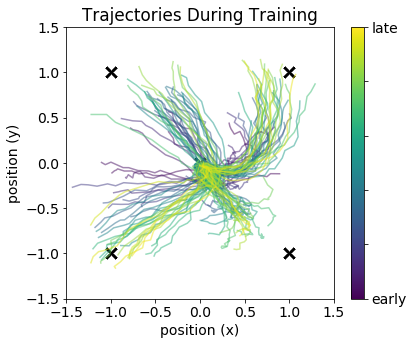

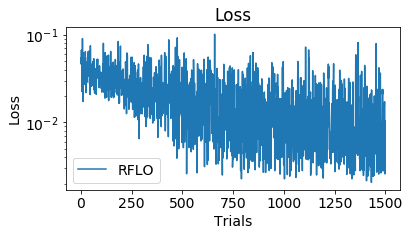

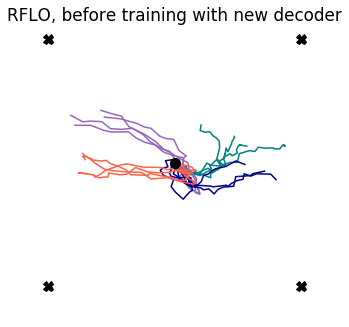

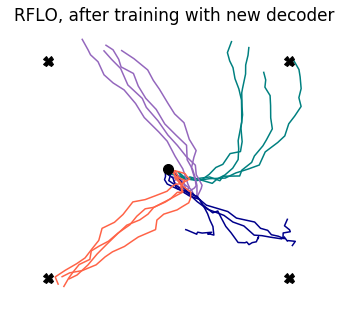

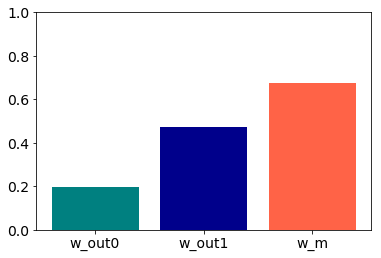

similarity DeltaC1 & DeltaC1_pred_w_out: 0.325
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.541
similarity DeltaC1 & DeltaC1_pred_w_m: 0.917


>> CTRL DeltaC1 & CTRL_h1_pre: 0.254
>> CTRL DeltaC1 & CTRL_h1_post: 0.895
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.247
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.241
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.698




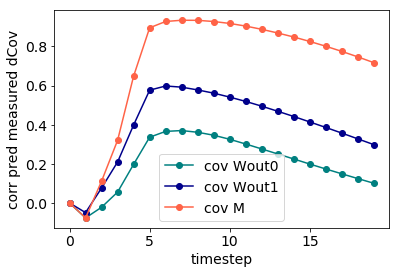

85it [00:00, 844.46it/s]

M norm: 0.89	 M angle: 0.71, 8 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.89	 w_out1 vs. w_m angle: 0.71
w_m norm: 1.52	 w_out vs. w_m angle: 0.46

500it [00:00, 984.03it/s]
1500it [00:04, 348.24it/s]
500it [00:00, 1001.32it/s]


AR early fit 0.963, late fit 0.981


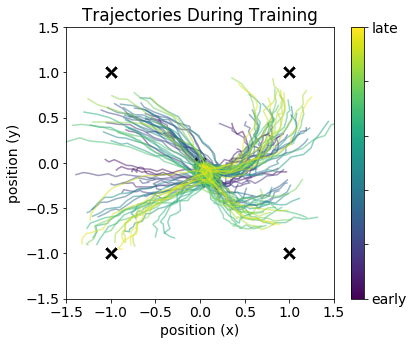

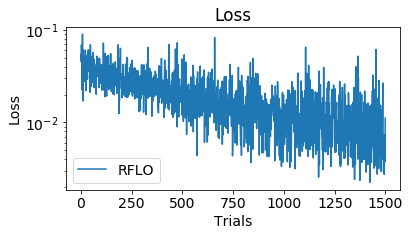

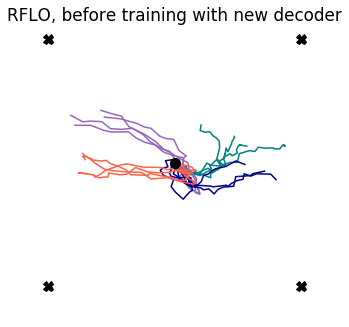

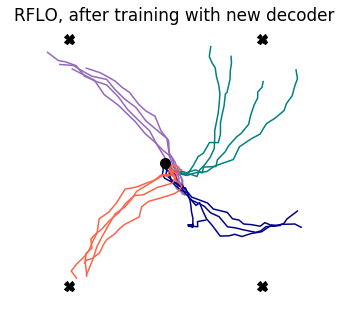

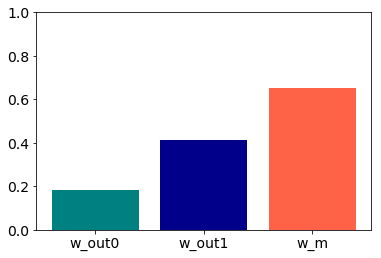

similarity DeltaC1 & DeltaC1_pred_w_out: 0.243
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.435
similarity DeltaC1 & DeltaC1_pred_w_m: 0.927


>> CTRL DeltaC1 & CTRL_h1_pre: 0.208
>> CTRL DeltaC1 & CTRL_h1_post: 0.881
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.218
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.224
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.689




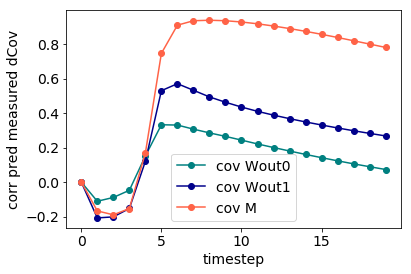

142it [00:00, 540.91it/s]

M norm: 0.72	 M angle: 0.80, 5 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.72	 w_out1 vs. w_m angle: 0.80
w_m norm: 1.55	 w_out vs. w_m angle: 0.42

500it [00:00, 902.77it/s]
1500it [00:04, 344.39it/s]
500it [00:00, 1098.23it/s]


AR early fit 0.963, late fit 0.980


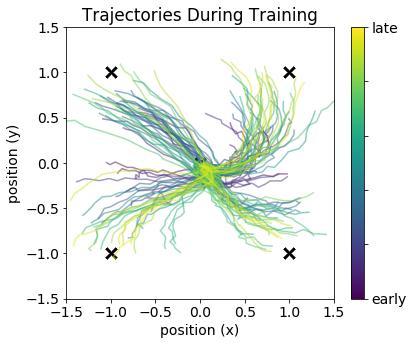

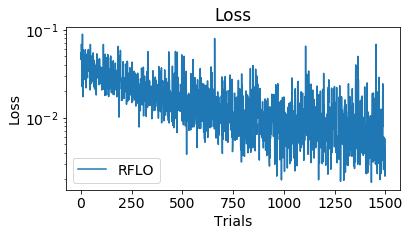

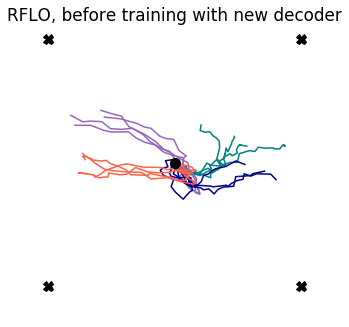

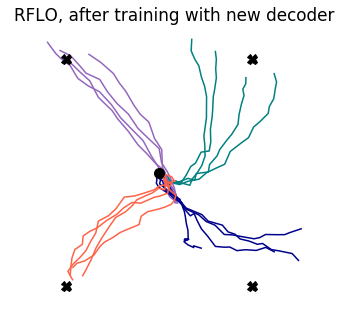

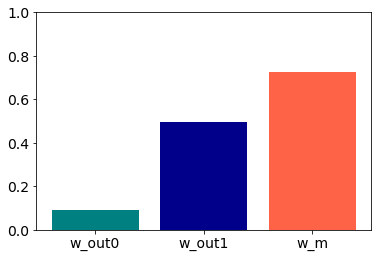

similarity DeltaC1 & DeltaC1_pred_w_out: 0.165
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.557
similarity DeltaC1 & DeltaC1_pred_w_m: 0.927


>> CTRL DeltaC1 & CTRL_h1_pre: 0.137
>> CTRL DeltaC1 & CTRL_h1_post: 0.844
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.143
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.357
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.615




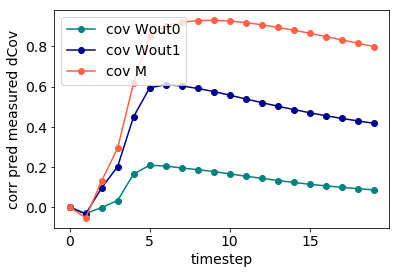

68it [00:00, 678.28it/s]

M norm: 0.53	 M angle: 0.90, 35 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.53	 w_out1 vs. w_m angle: 0.90
w_m norm: 1.54	 w_out vs. w_m angle: 0.45

500it [00:00, 958.76it/s]
1500it [00:04, 361.10it/s]
500it [00:00, 1050.08it/s]


AR early fit 0.963, late fit 0.977


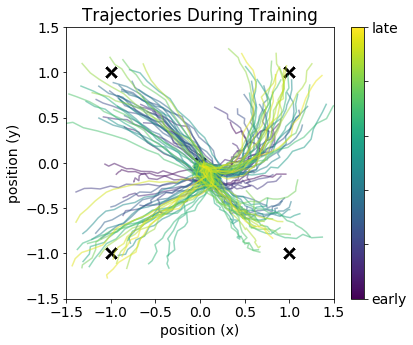

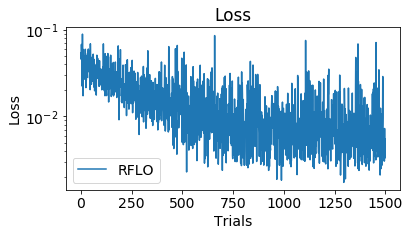

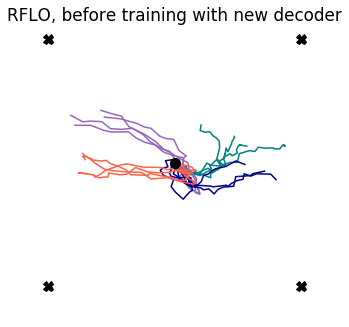

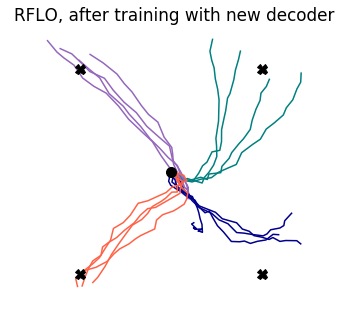

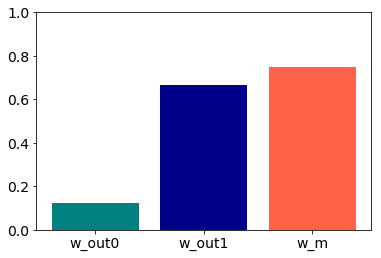

similarity DeltaC1 & DeltaC1_pred_w_out: 0.213
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.807
similarity DeltaC1 & DeltaC1_pred_w_m: 0.923


>> CTRL DeltaC1 & CTRL_h1_pre: 0.192
>> CTRL DeltaC1 & CTRL_h1_post: 0.809
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.190
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.521
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.540




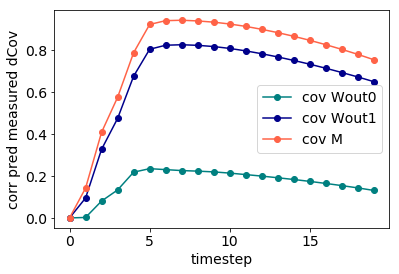

66it [00:00, 655.32it/s]

M norm: 0.00	 M angle: 1.00, 0 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 0.00	 w_out1 vs. w_m angle: 1.00
w_m norm: 1.47	 w_out vs. w_m angle: 0.51

500it [00:00, 987.82it/s]
1500it [00:04, 346.67it/s]
500it [00:00, 1003.80it/s]


AR early fit 0.963, late fit 0.977


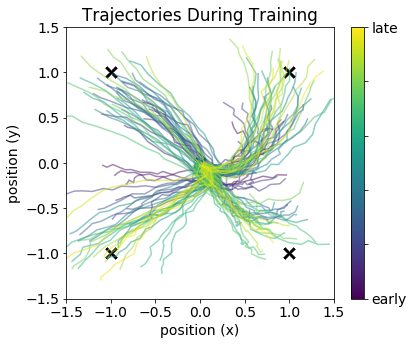

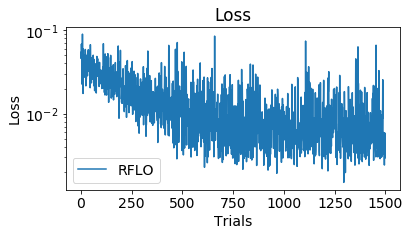

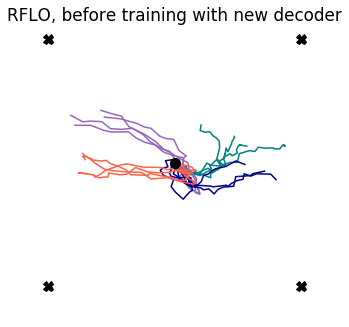

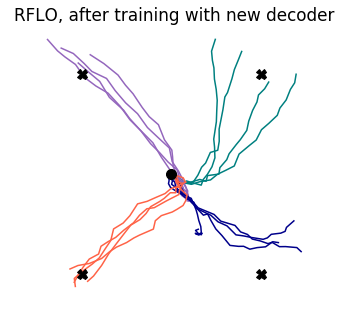

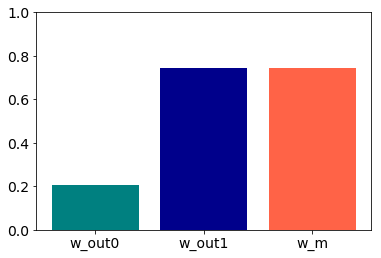

similarity DeltaC1 & DeltaC1_pred_w_out: 0.292
similarity DeltaC1 & DeltaC1_pred_w_out1: 0.925
similarity DeltaC1 & DeltaC1_pred_w_m: 0.925


>> CTRL DeltaC1 & CTRL_h1_pre: 0.289
>> CTRL DeltaC1 & CTRL_h1_post: 0.825
>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: 0.255
>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: 0.553
>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: 0.553




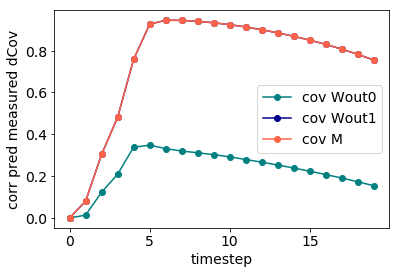

In [15]:
# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.1,
               sig_in=0.0,sig_rec=0.25,sig_out=0.01,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(72))
params.print_params()

# Initialize RNN
net0 = RNN(params)
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec'],online=False)
sim0.run_session(n_trials=2500, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')






""" Average over multiple seeds """
seeds = [0,22,33,47] #,54,72,81]
overlaps = [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
n_changes = [75,75,60,50,50,50,30,30,1]
overlap_w_out0 = 0.5
n_change_w_out0 = 50


stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []
stats['corrcoef'] = []

stats['covariance1'] = []
stats['covariance2'] = []
stats['covariance3'] = []
stats['seeds'] = seeds
stats['overlaps'] = overlaps
stats['overlap_w_out0'] = overlap_w_out0
stats['n_change_w_out0'] = n_change_w_out0

for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []
    corrcoef_list = []
    
    covariance1_list = []
    covariance2_list = []
    covariance3_list = []

    for overlap,n_change in zip(overlaps,n_changes):
        
        """ let overlap between w_out0 and w_out1 be constant """
        w_out1 = choose_aligned_matrix(net0.w_out.copy(),n_change=n_change_w_out0,overlap=overlap_w_out0,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)
        """ change overlap between w_out1 and w_m  """
        w_m = choose_aligned_matrix(w_out1,n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)

        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        net1_pre = RNN(params)
        net1_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1_pre.set_weights(w_out = w_out1)
        net1_pre.set_weights(w_m = w_m.T)

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net1 = RNN(params)
        net1.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1.set_weights(w_out = w_out1)
        net1.set_weights(w_m = w_m.T)




        """ Track activity with new decoder, before training """

        sim1_pre = Simulation(net1_pre)
        trackvars = TrackVars(net1_pre,apply_to=[]) 
        sim1_pre.run_session(n_trials=500, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
        #fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        """ Train with new decoder """

        sim1_train = Simulation(net1)
        rflo = RFLO(net1,apply_to=['w_rec'],online=False)
        sim1_train.run_session(n_trials=1500, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['h','loss','err'], plot=True, plot_freq=10)

        """ Track activity with new decoder, after training """
        net1_post = RNN(params)
        net1_post.set_weights(w_in=net1.w_in.copy(), w_rec=net1.w_rec.copy())
        net1_post.set_weights(w_out = net1.w_out)
        net1_post.set_weights(w_m = net1.w_m)

        sim1_post = Simulation(net1_post)
        trackvars = TrackVars(net1_post,apply_to=[]) 
        sim1_post.run_session(n_trials=500, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)

        
        fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        fig = plot_trained_trajectories(sim=sim1_post, tasks=[task1,task2,task3,task4],title='RFLO, after training with new decoder')
        
        
        """ Calculate F fields """
        F_early, score_early = flow_field_data(sim1_pre.session_probes['h'])
        F_late, score_late = flow_field_data(sim1_post.session_probes['h'])

        print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

        Fdata = F_late - F_early

        # separate train and test data from sim1_train
        n_total = len(sim1_train.session_probes['h'])
        n_train = int(0.5 * n_total)
        idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
        idx_test = np.arange(0,n_total)[~idx_train].astype(int)
        #idx_test=idx_train

        h_train = np.asarray(sim1_train.session_probes['h'])[idx_train,:,:,:]
        err_train = np.asarray(sim1_train.session_probes['err'])[idx_train,:,:,:]

        Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
        Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
        Fpred_w_m = flow_field_predicted(w_m,err_train,h_train)

        h_test = np.asarray(sim1_train.session_probes['h'])[idx_test,:,:,:]

        corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
        corr1_list.append(corr1)

        corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
        corr2_list.append(corr2)

        corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
        corr3_list.append(corr3)
        
        fig,ax = plt.subplots(1,1)
        plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])
        plt.ylim([0,1])
        plt.show()
        
        
        
        
        
        
        """ Calculate Covariance """
        """ Activity During """
        covariance1 = np.zeros(task1.trial_duration)
        covariance2 = np.zeros(task1.trial_duration)
        covariance3 = np.zeros(task1.trial_duration)
        
        for t_ind in range(1,task1.trial_duration):
            """ Covariance Before """
            h1_pre = np.asarray(sim1_pre.session_probes['h']).squeeze()

            C1_pre = np.cov(h1_pre[:,t_ind,:].T) # neurons x trials at a single time point

            """ Covariance After """
            h1_post = np.asarray(sim1_post.session_probes['h']).squeeze()

            C1_post = np.cov(h1_post[:,t_ind,:].T) # neurons x trials at a single time point
            
            """ Change in Covariance (Measured)"""
            DeltaC1 = C1_post - C1_pre

            h1_train = sim1_train.session_probes['h']
            err1_train = sim1_train.session_probes['err']

            dW1_w_out = flow_field_predicted(net0.w_out,err1_train,h1_train)
            dW1_w_out *= 0.001 #dW1_w_out/LA.norm(dW1_w_out)
            dW1_w_out1 = flow_field_predicted(net1.w_out,err1_train,h1_train)
            dW1_w_out1 *= 0.001 #dW1_w_out/LA.norm(dW1_w_out)
            dW1_w_m = flow_field_predicted(net1.w_m.T,err1_train,h1_train)
            dW1_w_m *= 0.001 #dW1_w_m/LA.norm(dW1_w_m)

            h1_pre = np.asarray(sim1_pre.session_probes['h']).squeeze()
            h1_post = np.asarray(sim1_post.session_probes['h']).squeeze()

            C1_pred_w_out = np.cov(h1_pre[:,t_ind,:].T + dW1_w_out@(h1_pre[:,t_ind-1,:].T))
            C1_pred_w_out1 = np.cov(h1_pre[:,t_ind,:].T + dW1_w_out1@(h1_pre[:,t_ind-1,:].T))
            C1_pred_w_m = np.cov(h1_pre[:,t_ind,:].T + dW1_w_m@(h1_pre[:,t_ind-1,:].T))
            
            """ Change in Covariance (Predicted) """
            DeltaC1_pred_w_out = C1_pred_w_out - C1_pre
            DeltaC1_pred_w_out1 = C1_pred_w_out1 - C1_pre
            DeltaC1_pred_w_m = C1_pred_w_m - C1_pre

            covariance1[t_ind] = np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out.ravel())[0,1]
            covariance2[t_ind] = np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out1.ravel())[0,1]
            covariance3[t_ind] = np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_m.ravel())[0,1]
            


            if t_ind == 10:
                print('similarity DeltaC1 & DeltaC1_pred_w_out: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out.ravel())[0,1]))
                print('similarity DeltaC1 & DeltaC1_pred_w_out1: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_out1.ravel())[0,1]))
                print('similarity DeltaC1 & DeltaC1_pred_w_m: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),DeltaC1_pred_w_m.ravel())[0,1]))
                print('\n')

            CTRL_h1_pre = np.cov(h1_pre[:,t_ind,:].T)
            CTRL_h1_post = np.cov(h1_post[:,t_ind,:].T)
            CTRL_dW1_w_out_h1_post = np.cov(dW1_w_out@(h1_post[:,t_ind,:].T))
            CTRL_dW1_w_out1_h1_post = np.cov(dW1_w_out1@(h1_post[:,t_ind,:].T))
            CTRL_dW1_w_m_h1_post = np.cov(dW1_w_m@(h1_post[:,t_ind,:].T))

            if t_ind == 10:
                print('>> CTRL DeltaC1 & CTRL_h1_pre: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_h1_pre.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_h1_post.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_dW1_w_out_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_dW1_w_out_h1_post.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_dW1_w_out1_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_dW1_w_out1_h1_post.ravel())[0,1]))
                print('>> CTRL DeltaC1 & CTRL_dW1_w_m_h1_post: {:.3f}'.format(np.corrcoef(DeltaC1.ravel(),CTRL_dW1_w_m_h1_post.ravel())[0,1]))

                print('\n')
                
        covariance1_list.append(covariance1)
        covariance2_list.append(covariance2)
        covariance3_list.append(covariance3)
        
        fig,ax = plt.subplots(1,1)
        plt.plot(np.asarray(covariance1).T,'o-',label='cov Wout0',color='teal')
        plt.plot(np.asarray(covariance2).T,'o-',label='cov Wout1',color='darkblue')
        plt.plot(np.asarray(covariance3).T,'o-',label='cov M',color='tomato')
        plt.legend()
        plt.xlabel('timestep')
        plt.ylabel('corr pred measured dCov')
        plt.show()
        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)
    #stats['corrcoef'].append(corrcoef_list)
    stats['covariance1'].append(covariance1_list)
    stats['covariance2'].append(covariance2_list)
    stats['covariance3'].append(covariance3_list)


In [16]:
""" save dict with unique name """
stats_rflo_m = stats

""" save dict """

save = True

if save:
    
    with open(folder+'stats_rflo_m.pickle', 'wb') as handle:
        pickle.dump(stats_rflo_m, handle, protocol=pickle.HIGHEST_PROTOCOL)


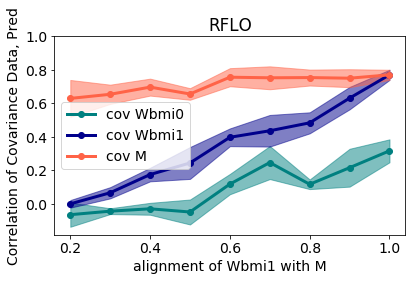

In [45]:
save = False
paper = False

fig,ax = plt.subplots(1,1,figsize=(6,4))


mn1 = np.mean(np.sum(np.asarray(stats_rflo_m['covariance1']),axis=2)/task1.trial_duration,axis=0) # seed by m by time
mn2 = np.mean(np.sum(np.asarray(stats_rflo_m['covariance2']),axis=2)/task1.trial_duration,axis=0) # seed by m by time
mn3 = np.mean(np.sum(np.asarray(stats_rflo_m['covariance3']),axis=2)/task1.trial_duration,axis=0) # seed by m by time

std1 = np.std(np.sum(np.asarray(stats_rflo_m['covariance1']),axis=2)/task1.trial_duration,axis=0) # seed by m by time
std2 = np.std(np.sum(np.asarray(stats_rflo_m['covariance2']),axis=2)/task1.trial_duration,axis=0) # seed by m by time
std3 = np.std(np.sum(np.asarray(stats_rflo_m['covariance3']),axis=2)/task1.trial_duration,axis=0) # seed by m by time

plt.plot(overlaps,mn1,'o-',linewidth=3,label='cov Wbmi0',color='teal')
plt.fill_between(overlaps,mn1-std1,mn1+std1,alpha=0.5,color='teal')

plt.plot(overlaps,mn2,'o-',linewidth=3,label='cov Wbmi1',color='darkblue')
plt.fill_between(overlaps,mn2-std2,mn2+std2,alpha=0.5,color='darkblue')

plt.plot(overlaps,mn3,'o-',linewidth=3,label='cov M',color='tomato')
plt.fill_between(overlaps,mn3-std3,mn3+std3,alpha=0.5,color='tomato')
plt.ylim(top =1)
plt.legend()
plt.title('RFLO')
plt.xlabel('alignment of Wbmi1 with M')
plt.ylabel('Correlation of Covariance Data, Pred')

plt.tight_layout()
plt.show()

if save:

    fig.savefig('rflo-cov-change-alignment.pdf')

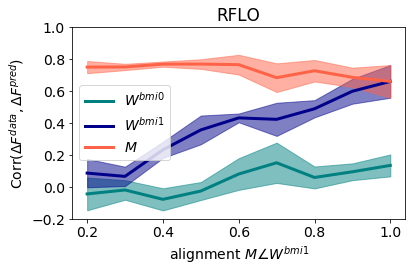

In [51]:
""" Same plot using flow field """
paper = False
save = False


fig,ax = plt.subplots(1,1,figsize=(6,4))

mn1 = np.mean(np.asarray(stats_rflo_m['corr1']),axis=0)
std1 = np.std(np.asarray(stats_rflo_m['corr1']),axis=0)

mn2 = np.mean(np.asarray(stats_rflo_m['corr2']),axis=0)
std2 = np.std(np.asarray(stats_rflo_m['corr2']),axis=0)

mn3 = np.mean(np.asarray(stats_rflo_m['corr3']),axis=0)
std3 = np.std(np.asarray(stats_rflo_m['corr3']),axis=0)


plt.plot(overlaps,mn1,'-',linewidth=3,label=r'$W^{bmi0}$',color='teal')
plt.fill_between(overlaps,mn1-std1,mn1+std1,alpha=0.5,color='teal')


plt.plot(overlaps,mn2,'-',linewidth=3,label=r'$W^{bmi1}$',color='darkblue')
plt.fill_between(overlaps,mn2-std2,mn2+std2,alpha=0.5,color='darkblue')

plt.plot(overlaps,mn3,'-',linewidth=3,label=r'$ M$',color='tomato')
plt.fill_between(overlaps,mn3-std3,mn3+std3,alpha=0.5,color='tomato')
plt.ylim([-0.2,1])
plt.legend()
plt.title('RFLO')
plt.xlabel('alignment '+r'$M \angle W^{bmi1}$')
plt.ylabel('Corr'+r'$(\Delta F^{data}, \Delta F^{pred})$')

plt.tight_layout()

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=[0.25,0.5,0.75,1],ylabels=[0,0.25,0.5,0.75,1],ticksize=10,linewidth=2,ylim=[-.2,1],figsize=(2.25,3))

plt.show()

if save:
    if paper:
        fig.savefig(folder+'rflo-dF-change-m.pdf')
    else:
        fig.savefig(folder+'rflo-dF-change-m_v2.pdf')


# Part 4 - REINFORCE ACROSS Wbmi0


Here, I pretrain a single network with decoder `W_bmi0` and then change the decoder to `W_bmi1` and train again with REINFORCE. Since REINFORCE does not rely on `W_m`, the only matrices we care about are `W_bmi0` and `W_bmi1`. Here I vary the alignment between these two decoders and then apply the two general metrics to the simulation results.

Note: Unfortunately this simulation takes a little too long, and might not be worth doing frequently. I've saved the results in a dict called `stats_reinforce_wout.pickle`

```
""" Average over multiple seeds """
seeds = [0,1,12,54,72,81]
overlaps = [0.5,0.6,0.7,0.8,0.9,1]
n_changes = [50,50,50,40,30,1]
```

15it [00:00, 148.05it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fce69a30828>


2500it [00:11, 218.71it/s]
74it [00:00, 733.86it/s]


~~~~ OVERLAP 0.2, SEED 0


M norm: 1.03	 M angle: 0.49, 20 iterations
w_out1 norm: 1.81	 w_out vs. w_out1 angle: 0.19
w_m norm: 1.03	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.93	 w_out vs. w_m angle: 0.05

1000it [00:02, 370.65it/s]
15000it [00:49, 303.69it/s]
1000it [00:01, 668.06it/s]


AR early fit 0.964, late fit 0.978


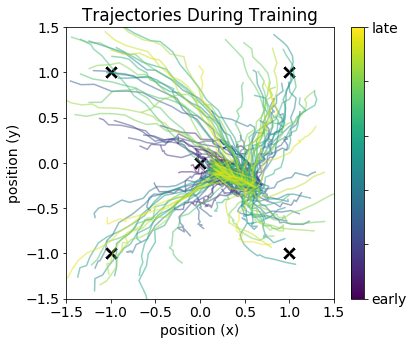

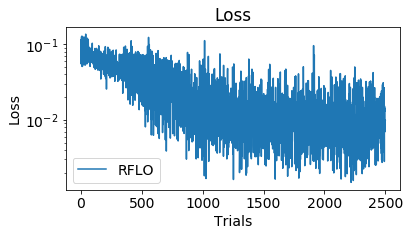

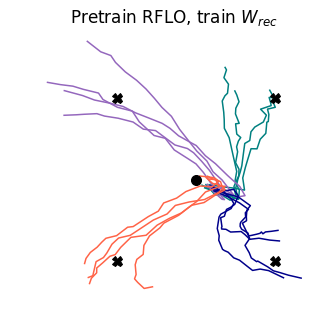

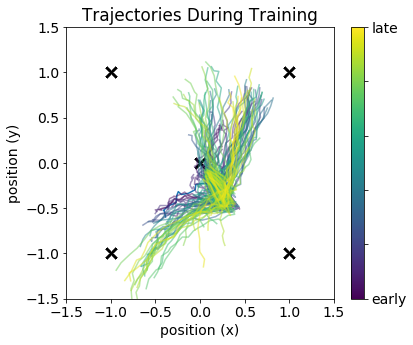

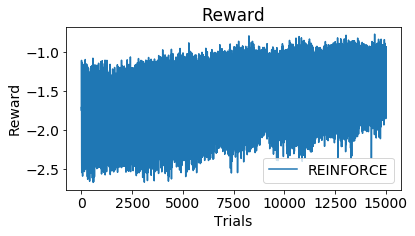

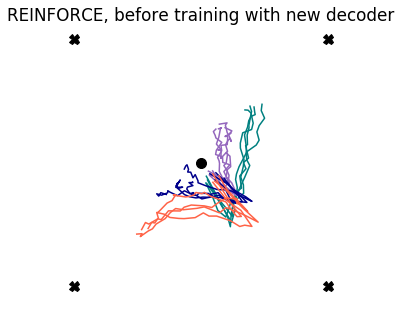

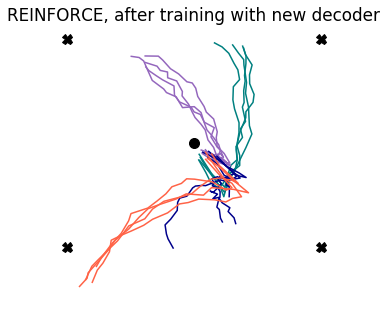

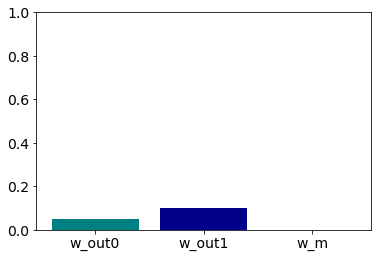

similarity DeltaC2 & C2_pred_w_out: 0.133
similarity DeltaC2 & C2_pred_w_out1: 0.348
similarity DeltaC2 & C2_pred_w_m: 0.053


>> CTRL DeltaC2 & CTRL_h2_pre: 0.266
>> CTRL DeltaC2 & CTRL_h2_post: 0.755
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.131
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.341
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.048




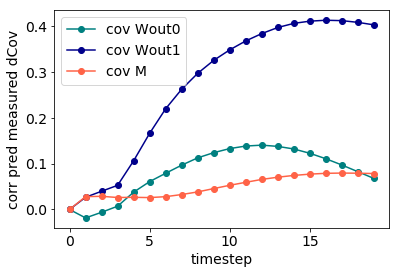

67it [00:00, 664.93it/s]


~~~~ OVERLAP 0.3, SEED 0


M norm: 0.96	 M angle: 0.51, 7 iterations
w_out1 norm: 1.67	 w_out vs. w_out1 angle: 0.30
w_m norm: 0.96	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.17

1000it [00:01, 938.78it/s]
15000it [00:36, 409.95it/s]
1000it [00:01, 916.04it/s]


AR early fit 0.964, late fit 0.980


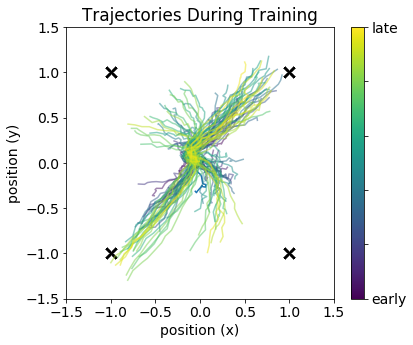

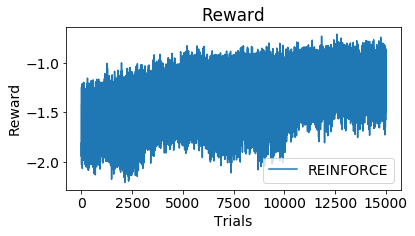

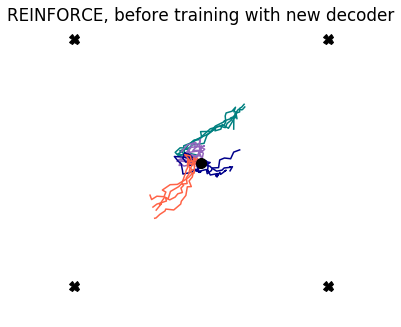

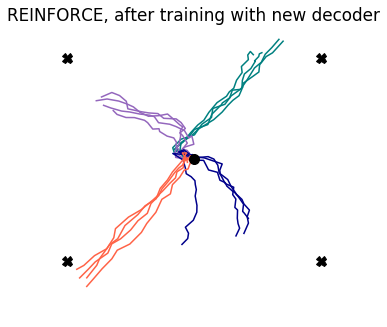

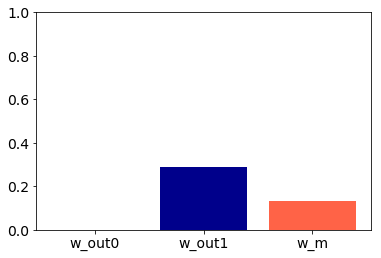

similarity DeltaC2 & C2_pred_w_out: 0.330
similarity DeltaC2 & C2_pred_w_out1: 0.447
similarity DeltaC2 & C2_pred_w_m: 0.217


>> CTRL DeltaC2 & CTRL_h2_pre: 0.483
>> CTRL DeltaC2 & CTRL_h2_post: 0.872
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.328
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.439
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.211




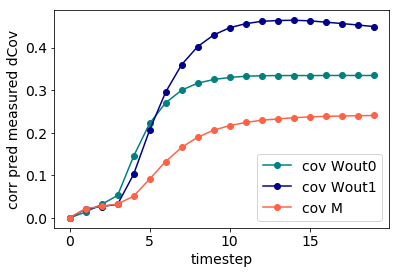

34it [00:00, 335.92it/s]


~~~~ OVERLAP 0.4, SEED 0


M norm: 1.13	 M angle: 0.50, 7 iterations
w_out1 norm: 1.60	 w_out vs. w_out1 angle: 0.41
w_m norm: 1.13	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.66	 w_out vs. w_m angle: 0.33

1000it [00:01, 899.60it/s]
15000it [00:34, 431.01it/s]
1000it [00:01, 947.02it/s]


AR early fit 0.964, late fit 0.980


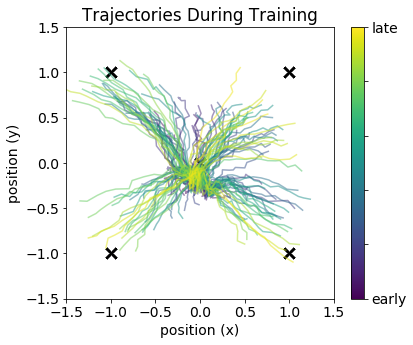

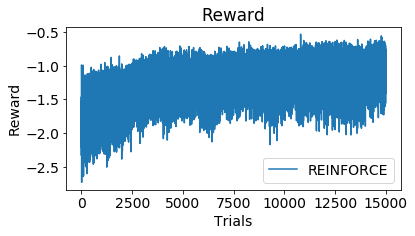

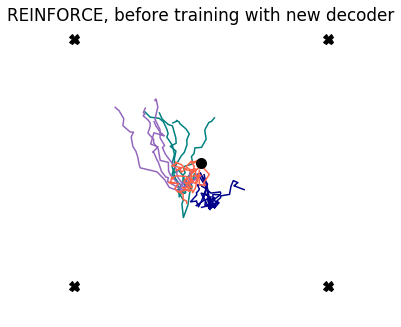

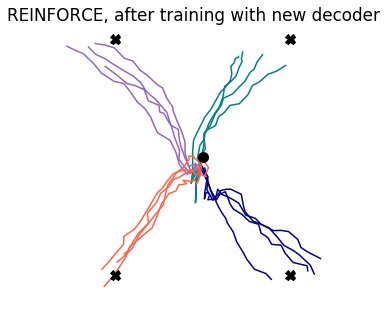

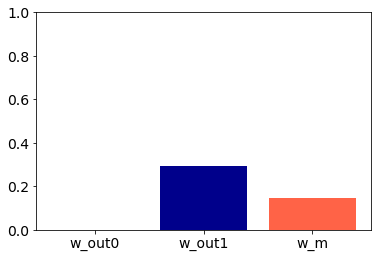

similarity DeltaC2 & C2_pred_w_out: 0.297
similarity DeltaC2 & C2_pred_w_out1: 0.405
similarity DeltaC2 & C2_pred_w_m: 0.250


>> CTRL DeltaC2 & CTRL_h2_pre: 0.323
>> CTRL DeltaC2 & CTRL_h2_post: 0.842
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.296
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.396
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.246




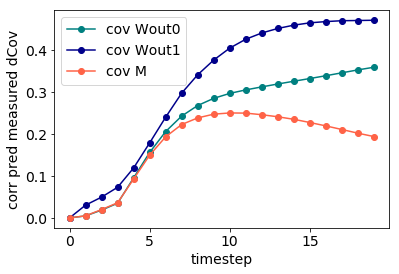

37it [00:00, 366.99it/s]


~~~~ OVERLAP 0.5, SEED 0


M norm: 1.21	 M angle: 0.49, 34 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.21	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.85	 w_out vs. w_m angle: 0.11

1000it [00:01, 696.89it/s]
15000it [00:43, 343.80it/s]
1000it [00:01, 794.50it/s]


AR early fit 0.964, late fit 0.982


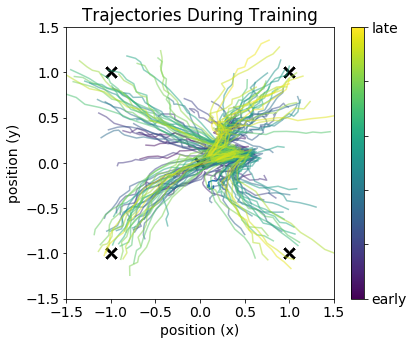

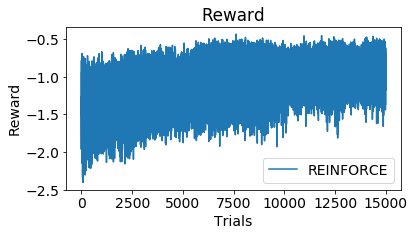

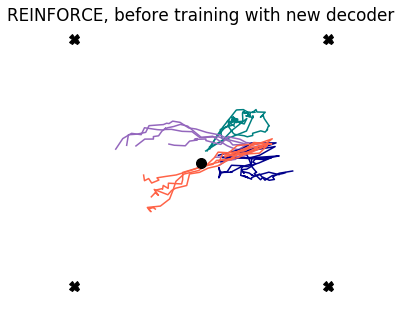

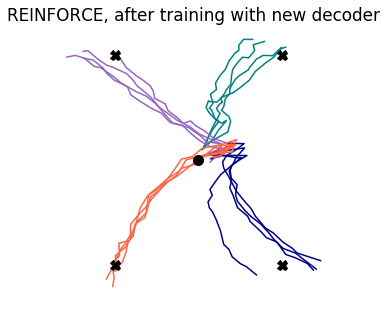

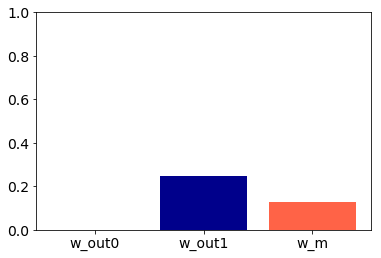

similarity DeltaC2 & C2_pred_w_out: 0.355
similarity DeltaC2 & C2_pred_w_out1: 0.466
similarity DeltaC2 & C2_pred_w_m: 0.081


>> CTRL DeltaC2 & CTRL_h2_pre: 0.567
>> CTRL DeltaC2 & CTRL_h2_post: 0.915
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.352
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.459
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.074




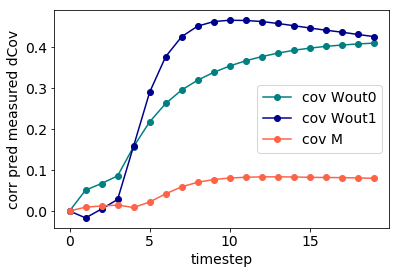

75it [00:00, 748.38it/s]


~~~~ OVERLAP 0.6, SEED 0


M norm: 1.18	 M angle: 0.49, 2 iterations
w_out1 norm: 1.37	 w_out vs. w_out1 angle: 0.60
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.73	 w_out vs. w_m angle: 0.24

1000it [00:01, 787.13it/s]
15000it [00:35, 418.23it/s]
1000it [00:01, 930.83it/s]


AR early fit 0.964, late fit 0.980


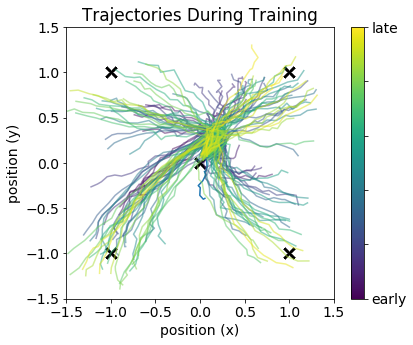

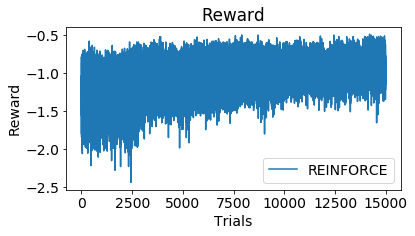

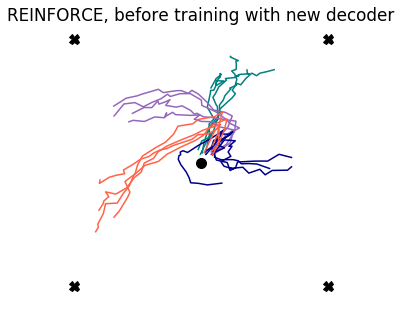

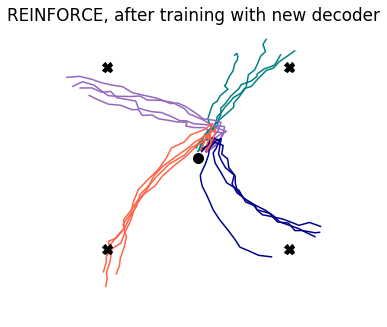

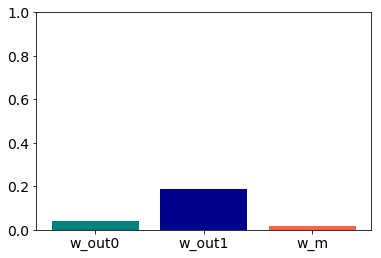

similarity DeltaC2 & C2_pred_w_out: 0.430
similarity DeltaC2 & C2_pred_w_out1: 0.486
similarity DeltaC2 & C2_pred_w_m: 0.079


>> CTRL DeltaC2 & CTRL_h2_pre: 0.636
>> CTRL DeltaC2 & CTRL_h2_post: 0.909
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.427
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.477
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.073




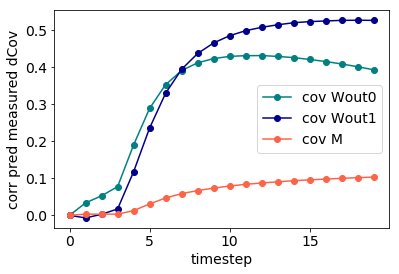

71it [00:00, 705.38it/s]


~~~~ OVERLAP 0.7, SEED 0


M norm: 1.20	 M angle: 0.50, 37 iterations
w_out1 norm: 1.20	 w_out vs. w_out1 angle: 0.70
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.58	 w_out vs. w_m angle: 0.38

1000it [00:01, 986.74it/s]
15000it [00:37, 402.84it/s]
1000it [00:01, 927.99it/s]


AR early fit 0.964, late fit 0.982


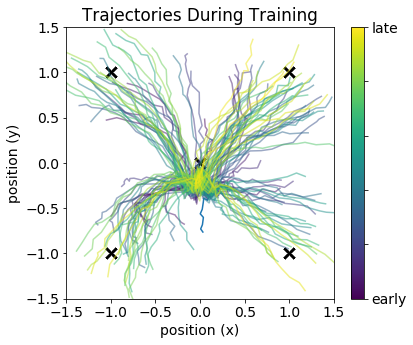

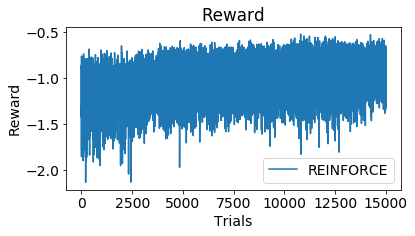

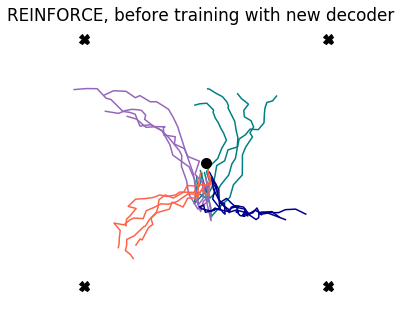

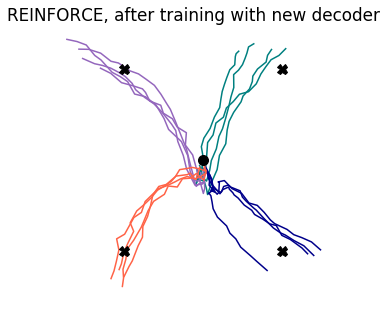

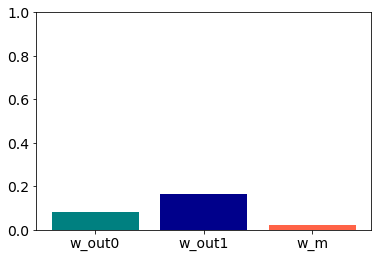

similarity DeltaC2 & C2_pred_w_out: 0.586
similarity DeltaC2 & C2_pred_w_out1: 0.407
similarity DeltaC2 & C2_pred_w_m: 0.138


>> CTRL DeltaC2 & CTRL_h2_pre: 0.740
>> CTRL DeltaC2 & CTRL_h2_post: 0.943
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.583
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.400
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.131




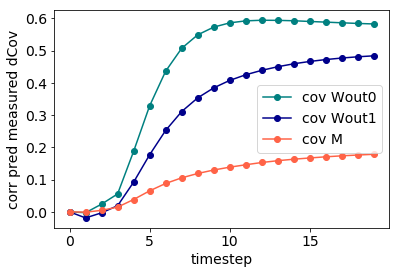

61it [00:00, 607.51it/s]


~~~~ OVERLAP 0.8, SEED 0


M norm: 1.38	 M angle: 0.49, 38 iterations
w_out1 norm: 1.00	 w_out vs. w_out1 angle: 0.81
w_m norm: 1.38	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.71	 w_out vs. w_m angle: 0.31

1000it [00:01, 876.45it/s]
15000it [00:40, 365.94it/s]
1000it [00:01, 937.92it/s]


AR early fit 0.964, late fit 0.979


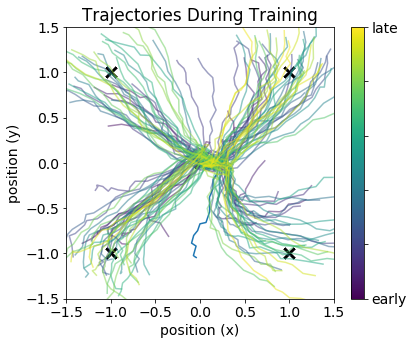

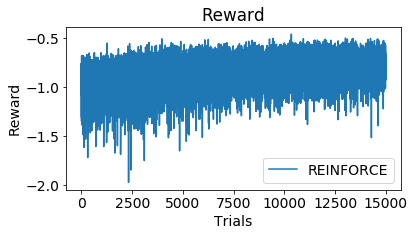

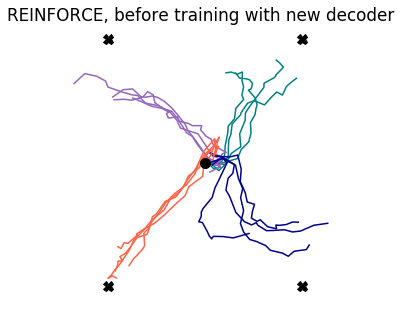

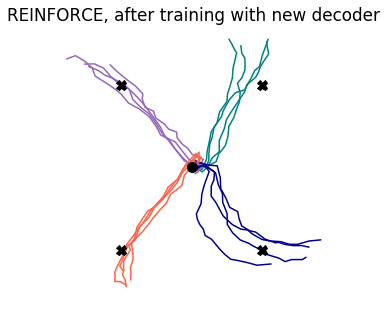

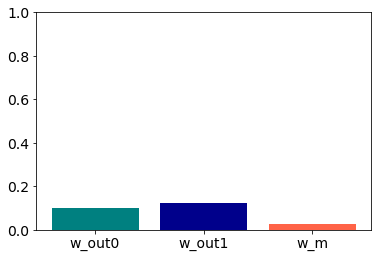

similarity DeltaC2 & C2_pred_w_out: 0.577
similarity DeltaC2 & C2_pred_w_out1: 0.544
similarity DeltaC2 & C2_pred_w_m: 0.093


>> CTRL DeltaC2 & CTRL_h2_pre: 0.833
>> CTRL DeltaC2 & CTRL_h2_post: 0.959
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.570
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.533
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.083




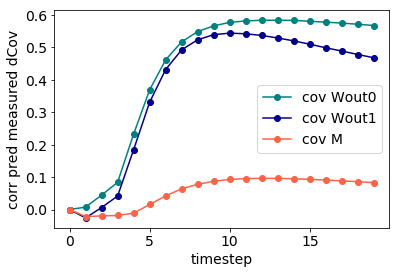

66it [00:00, 655.75it/s]


~~~~ OVERLAP 0.9, SEED 0


M norm: 1.41	 M angle: 0.51, 55 iterations
w_out1 norm: 0.76	 w_out vs. w_out1 angle: 0.89
w_m norm: 1.41	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.57	 w_out vs. w_m angle: 0.44

1000it [00:01, 843.44it/s]
15000it [00:34, 434.56it/s]
1000it [00:01, 904.89it/s]


AR early fit 0.964, late fit 0.976


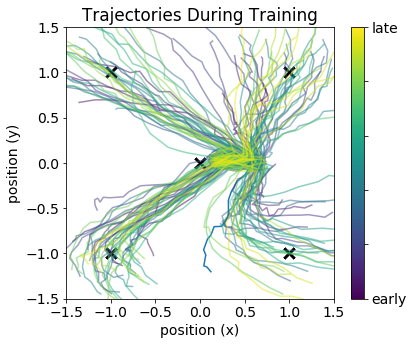

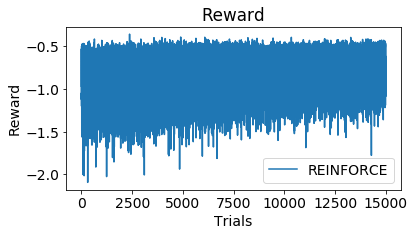

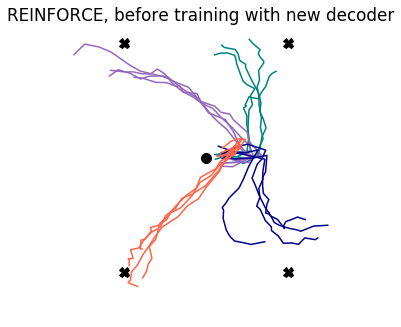

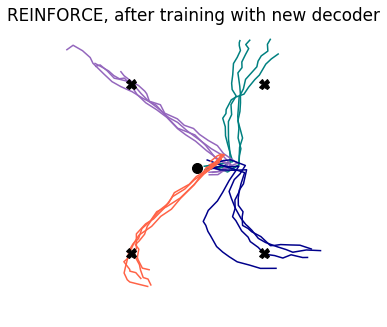

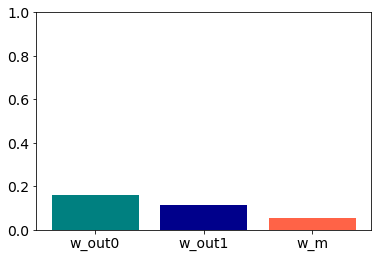

similarity DeltaC2 & C2_pred_w_out: 0.515
similarity DeltaC2 & C2_pred_w_out1: 0.506
similarity DeltaC2 & C2_pred_w_m: 0.120


>> CTRL DeltaC2 & CTRL_h2_pre: 0.870
>> CTRL DeltaC2 & CTRL_h2_post: 0.957
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.505
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.493
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.106




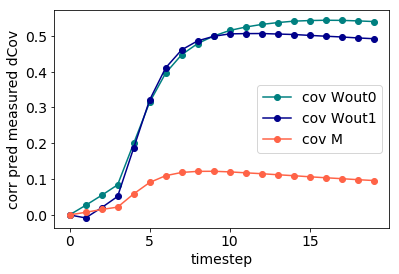

48it [00:00, 476.33it/s]


~~~~ OVERLAP 1, SEED 0


M norm: 1.52	 M angle: 0.51, 53 iterations
w_out1 norm: 0.00	 w_out vs. w_out1 angle: 1.00
w_m norm: 1.52	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.52	 w_out vs. w_m angle: 0.51

1000it [00:01, 663.09it/s]
15000it [00:43, 341.61it/s]
1000it [00:01, 600.06it/s]


AR early fit 0.964, late fit 0.973


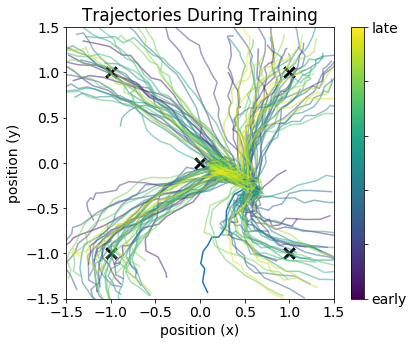

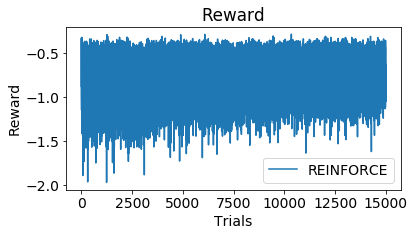

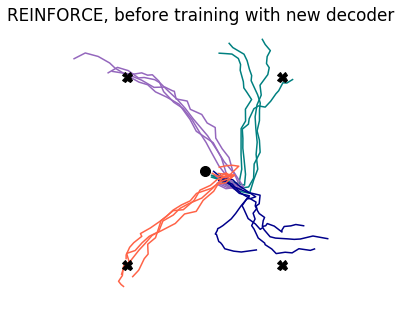

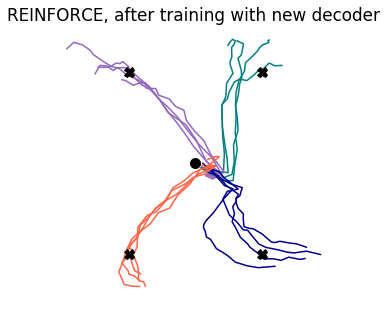

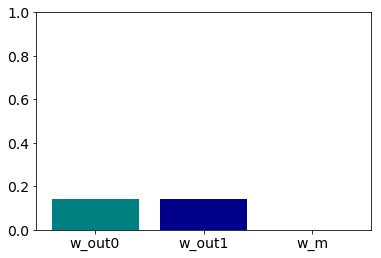

similarity DeltaC2 & C2_pred_w_out: 0.536
similarity DeltaC2 & C2_pred_w_out1: 0.536
similarity DeltaC2 & C2_pred_w_m: 0.099


>> CTRL DeltaC2 & CTRL_h2_pre: 0.842
>> CTRL DeltaC2 & CTRL_h2_post: 0.933
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.524
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.524
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.087




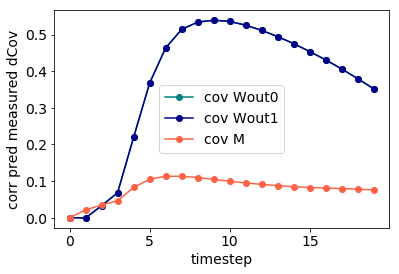

50it [00:00, 494.86it/s]


~~~~ OVERLAP 0.2, SEED 22


M norm: 0.99	 M angle: 0.49, 9 iterations
w_out1 norm: 1.78	 w_out vs. w_out1 angle: 0.21
w_m norm: 0.99	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.86	 w_out vs. w_m angle: 0.03

1000it [00:01, 972.39it/s]
15000it [00:33, 447.72it/s]
1000it [00:01, 889.58it/s]


AR early fit 0.964, late fit 0.980


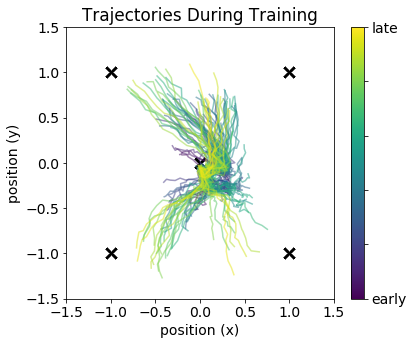

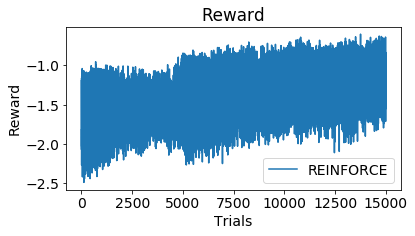

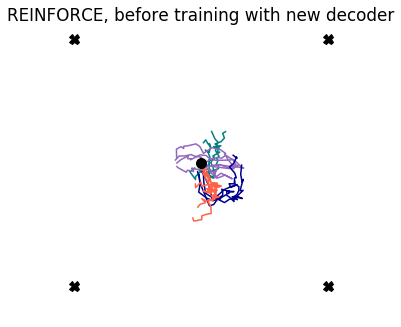

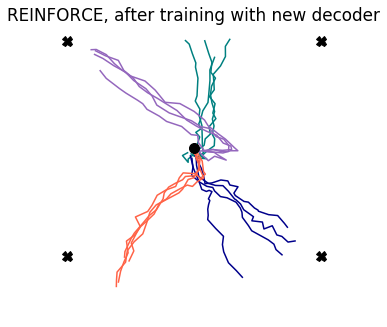

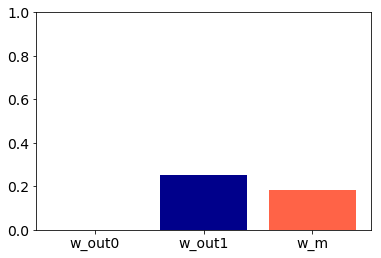

similarity DeltaC2 & C2_pred_w_out: 0.194
similarity DeltaC2 & C2_pred_w_out1: 0.418
similarity DeltaC2 & C2_pred_w_m: 0.042


>> CTRL DeltaC2 & CTRL_h2_pre: 0.406
>> CTRL DeltaC2 & CTRL_h2_post: 0.866
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.192
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.410
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.038




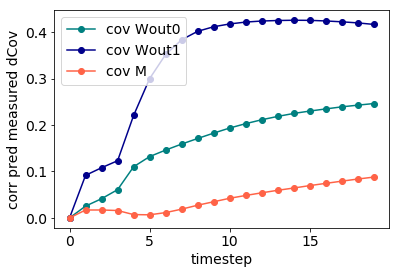

56it [00:00, 554.26it/s]


~~~~ OVERLAP 0.3, SEED 22


M norm: 0.99	 M angle: 0.51, 14 iterations
w_out1 norm: 1.69	 w_out vs. w_out1 angle: 0.30
w_m norm: 0.99	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.77	 w_out vs. w_m angle: 0.15

1000it [00:01, 923.85it/s]
15000it [00:33, 449.65it/s]
1000it [00:00, 1007.69it/s]


AR early fit 0.964, late fit 0.979


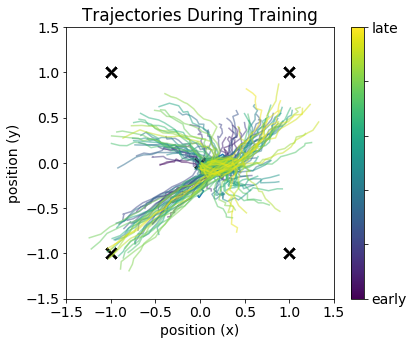

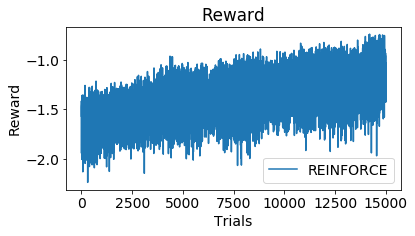

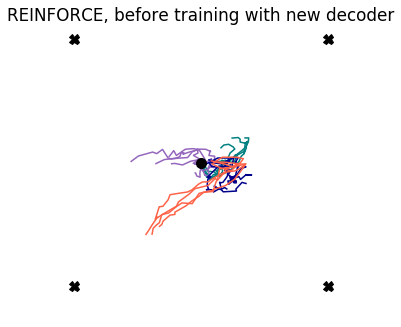

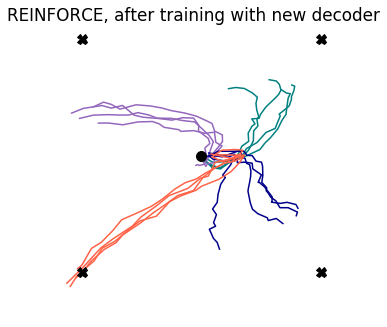

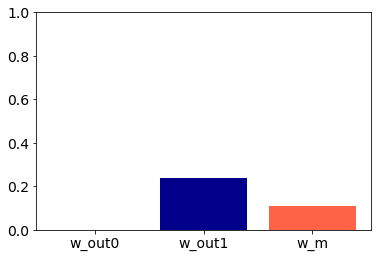

similarity DeltaC2 & C2_pred_w_out: 0.141
similarity DeltaC2 & C2_pred_w_out1: 0.394
similarity DeltaC2 & C2_pred_w_m: 0.079


>> CTRL DeltaC2 & CTRL_h2_pre: 0.307
>> CTRL DeltaC2 & CTRL_h2_post: 0.807
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.139
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.386
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.074




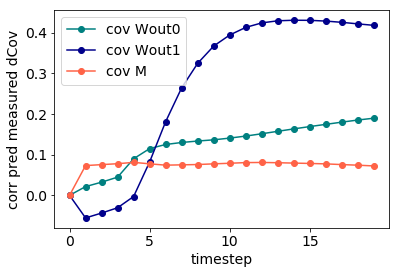

53it [00:00, 528.19it/s]


~~~~ OVERLAP 0.4, SEED 22


M norm: 1.04	 M angle: 0.50, 2 iterations
w_out1 norm: 1.60	 w_out vs. w_out1 angle: 0.40
w_m norm: 1.04	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.79	 w_out vs. w_m angle: 0.12

1000it [00:01, 937.23it/s]
15000it [00:33, 441.38it/s]
1000it [00:01, 998.87it/s]


AR early fit 0.964, late fit 0.979


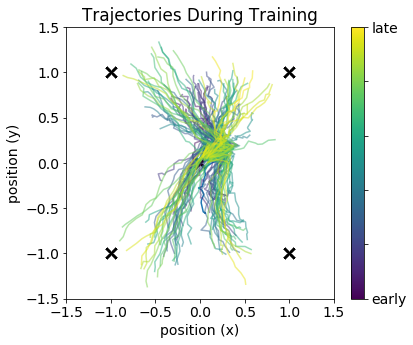

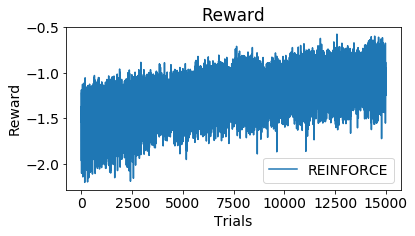

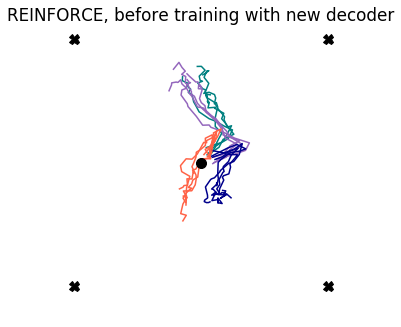

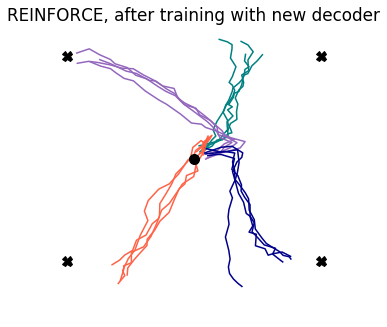

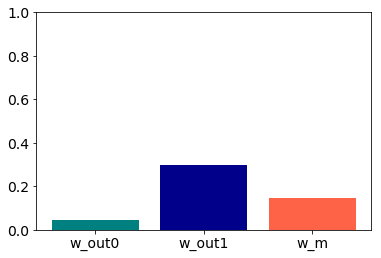

similarity DeltaC2 & C2_pred_w_out: 0.363
similarity DeltaC2 & C2_pred_w_out1: 0.470
similarity DeltaC2 & C2_pred_w_m: 0.150


>> CTRL DeltaC2 & CTRL_h2_pre: 0.498
>> CTRL DeltaC2 & CTRL_h2_post: 0.873
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.361
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.461
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.144




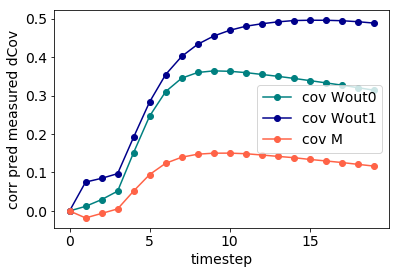

43it [00:00, 427.14it/s]


~~~~ OVERLAP 0.5, SEED 22


M norm: 1.13	 M angle: 0.50, 5 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.13	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.76	 w_out vs. w_m angle: 0.21

1000it [00:01, 938.96it/s]
15000it [00:34, 441.14it/s]
1000it [00:01, 951.08it/s]


AR early fit 0.964, late fit 0.982


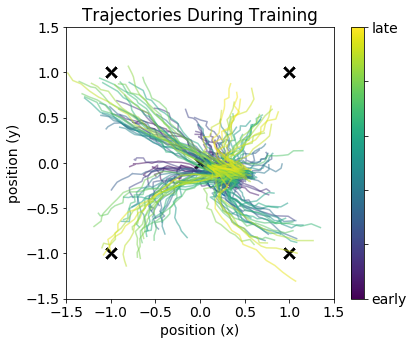

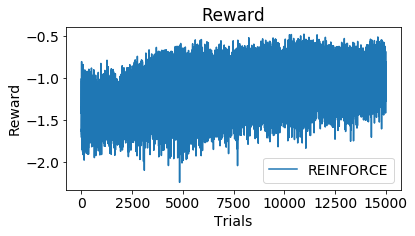

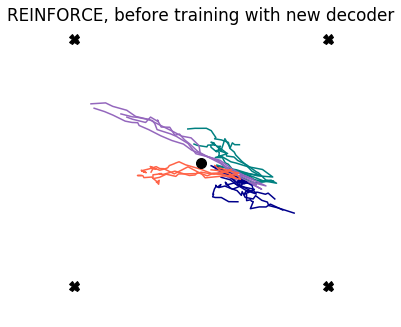

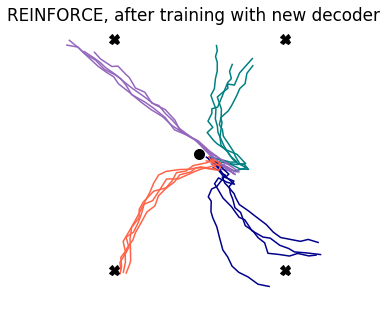

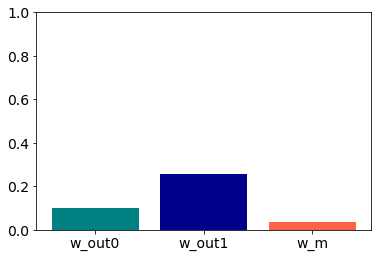

similarity DeltaC2 & C2_pred_w_out: 0.504
similarity DeltaC2 & C2_pred_w_out1: 0.433
similarity DeltaC2 & C2_pred_w_m: 0.041


>> CTRL DeltaC2 & CTRL_h2_pre: 0.636
>> CTRL DeltaC2 & CTRL_h2_post: 0.929
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.502
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.425
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.041




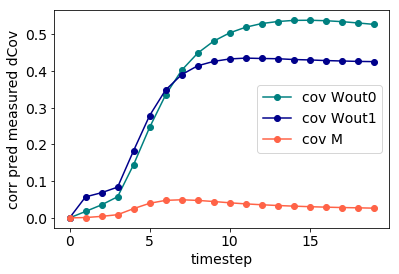

85it [00:00, 844.55it/s]


~~~~ OVERLAP 0.6, SEED 22


M norm: 1.14	 M angle: 0.51, 7 iterations
w_out1 norm: 1.34	 w_out vs. w_out1 angle: 0.61
w_m norm: 1.14	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.69	 w_out vs. w_m angle: 0.27

1000it [00:00, 1000.20it/s]
15000it [00:33, 449.46it/s]
1000it [00:01, 986.60it/s]


AR early fit 0.964, late fit 0.982


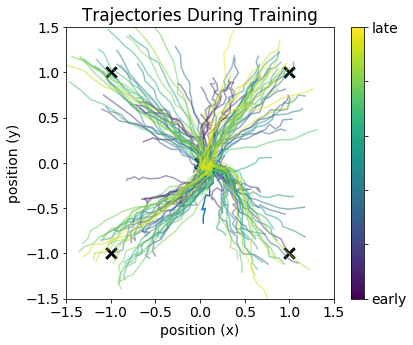

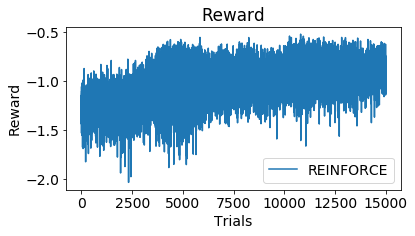

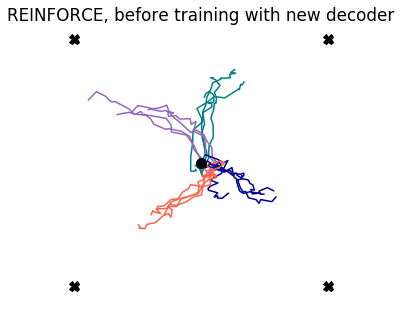

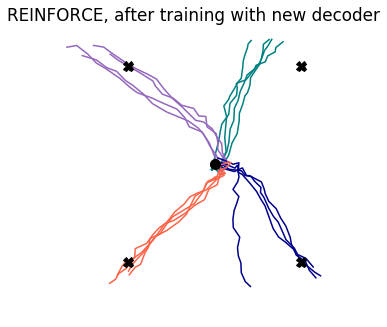

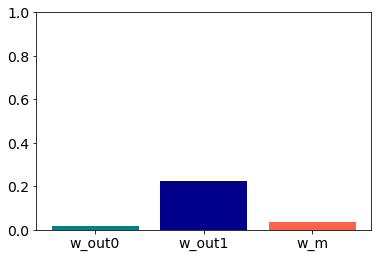

similarity DeltaC2 & C2_pred_w_out: 0.507
similarity DeltaC2 & C2_pred_w_out1: 0.506
similarity DeltaC2 & C2_pred_w_m: 0.078


>> CTRL DeltaC2 & CTRL_h2_pre: 0.621
>> CTRL DeltaC2 & CTRL_h2_post: 0.920
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.505
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.499
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.073




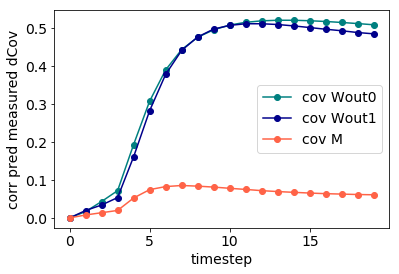

53it [00:00, 527.83it/s]


~~~~ OVERLAP 0.7, SEED 22


M norm: 1.14	 M angle: 0.50, 0 iterations
w_out1 norm: 1.21	 w_out vs. w_out1 angle: 0.69
w_m norm: 1.14	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.60	 w_out vs. w_m angle: 0.36

1000it [00:01, 939.75it/s]
15000it [00:34, 435.79it/s]
1000it [00:01, 921.02it/s]


AR early fit 0.964, late fit 0.981


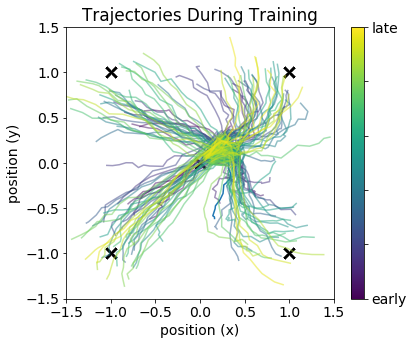

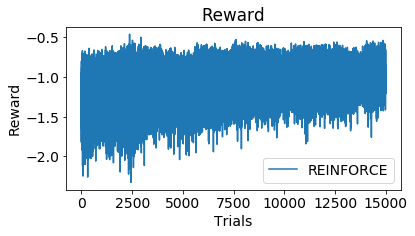

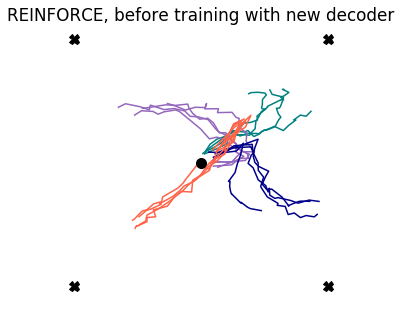

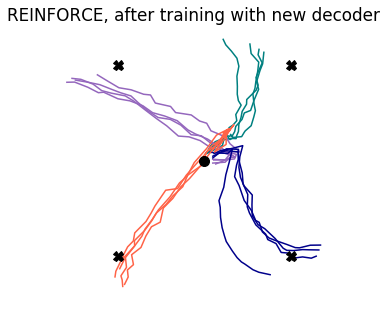

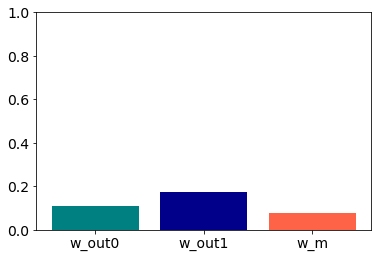

similarity DeltaC2 & C2_pred_w_out: 0.503
similarity DeltaC2 & C2_pred_w_out1: 0.492
similarity DeltaC2 & C2_pred_w_m: 0.087


>> CTRL DeltaC2 & CTRL_h2_pre: 0.679
>> CTRL DeltaC2 & CTRL_h2_post: 0.928
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.500
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.484
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.081




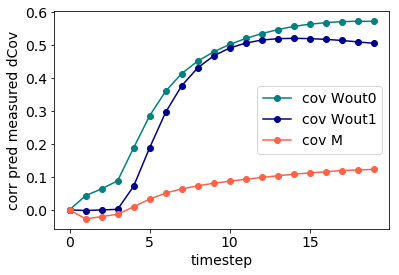

32it [00:00, 214.13it/s]


~~~~ OVERLAP 0.8, SEED 22


M norm: 1.28	 M angle: 0.50, 7 iterations
w_out1 norm: 1.03	 w_out vs. w_out1 angle: 0.79
w_m norm: 1.28	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.61	 w_out vs. w_m angle: 0.36

1000it [00:01, 854.31it/s]
15000it [00:33, 446.37it/s]
1000it [00:01, 998.68it/s]


AR early fit 0.964, late fit 0.980


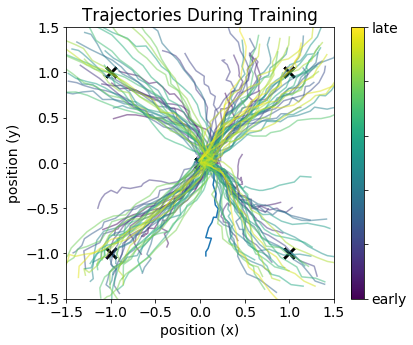

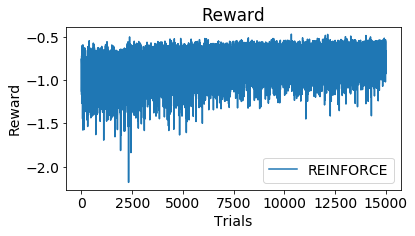

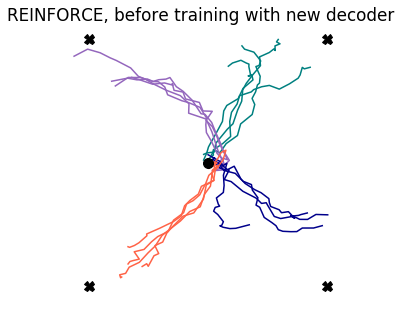

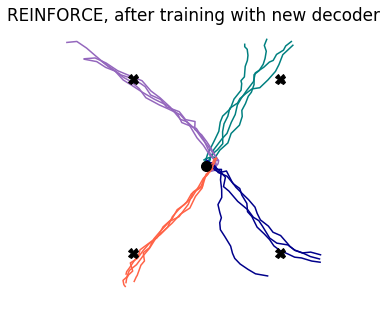

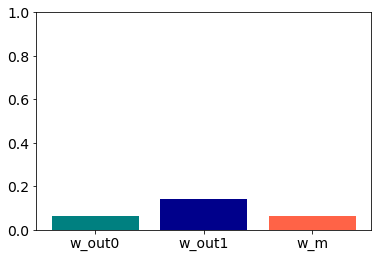

similarity DeltaC2 & C2_pred_w_out: 0.648
similarity DeltaC2 & C2_pred_w_out1: 0.603
similarity DeltaC2 & C2_pred_w_m: 0.093


>> CTRL DeltaC2 & CTRL_h2_pre: 0.841
>> CTRL DeltaC2 & CTRL_h2_post: 0.960
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.641
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.592
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.081




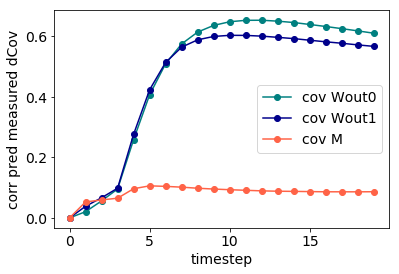

39it [00:00, 387.41it/s]


~~~~ OVERLAP 0.9, SEED 22


M norm: 1.37	 M angle: 0.51, 4 iterations
w_out1 norm: 0.73	 w_out vs. w_out1 angle: 0.90
w_m norm: 1.37	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.53	 w_out vs. w_m angle: 0.46

1000it [00:01, 952.65it/s]
15000it [00:33, 453.07it/s]
1000it [00:01, 753.50it/s]


AR early fit 0.964, late fit 0.978


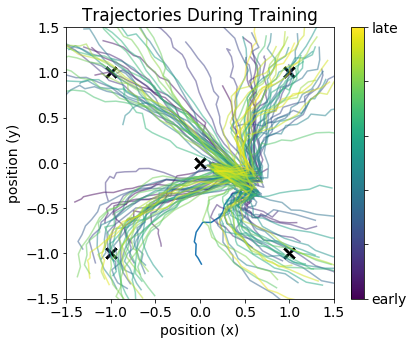

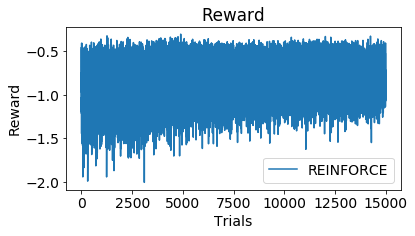

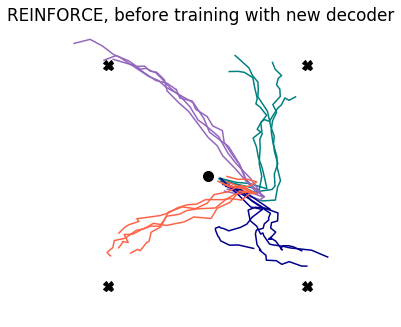

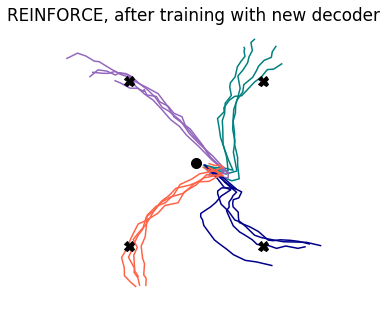

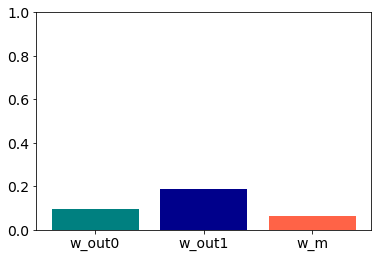

similarity DeltaC2 & C2_pred_w_out: 0.653
similarity DeltaC2 & C2_pred_w_out1: 0.567
similarity DeltaC2 & C2_pred_w_m: 0.057


>> CTRL DeltaC2 & CTRL_h2_pre: 0.876
>> CTRL DeltaC2 & CTRL_h2_post: 0.966
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.646
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.557
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.048




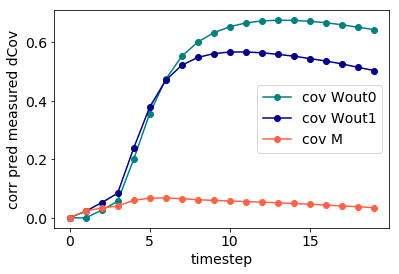

31it [00:00, 308.12it/s]


~~~~ OVERLAP 1, SEED 22


M norm: 1.50	 M angle: 0.50, 114 iterations
w_out1 norm: 0.00	 w_out vs. w_out1 angle: 1.00
w_m norm: 1.50	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.50	 w_out vs. w_m angle: 0.50

1000it [00:01, 918.87it/s]
15000it [00:33, 443.45it/s]
1000it [00:01, 762.43it/s]


AR early fit 0.964, late fit 0.973


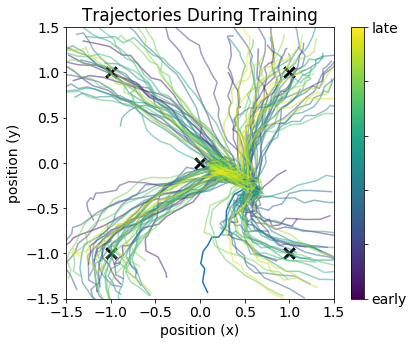

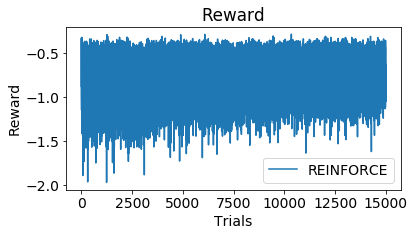

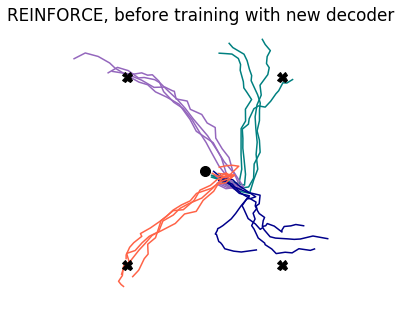

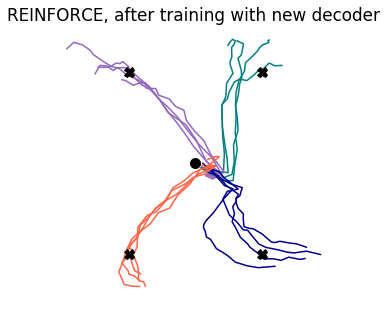

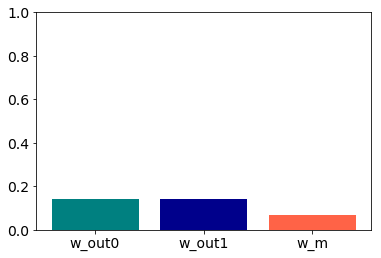

similarity DeltaC2 & C2_pred_w_out: 0.536
similarity DeltaC2 & C2_pred_w_out1: 0.536
similarity DeltaC2 & C2_pred_w_m: 0.111


>> CTRL DeltaC2 & CTRL_h2_pre: 0.842
>> CTRL DeltaC2 & CTRL_h2_post: 0.933
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.524
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.524
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.098




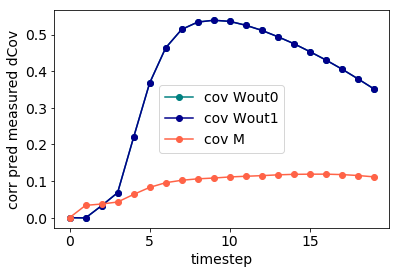

54it [00:00, 536.76it/s]


~~~~ OVERLAP 0.2, SEED 33


M norm: 0.91	 M angle: 0.51, 10 iterations
w_out1 norm: 1.75	 w_out vs. w_out1 angle: 0.19
w_m norm: 0.91	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.69	 w_out vs. w_m angle: 0.23

1000it [00:01, 962.87it/s]
15000it [00:34, 438.74it/s]
1000it [00:01, 854.01it/s]


AR early fit 0.964, late fit 0.979


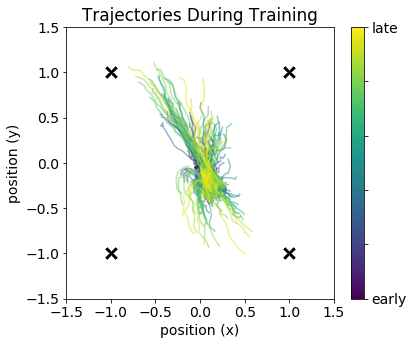

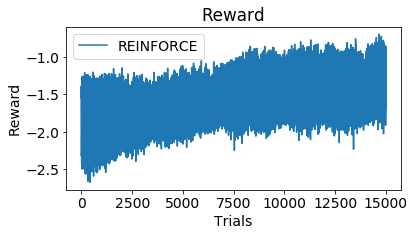

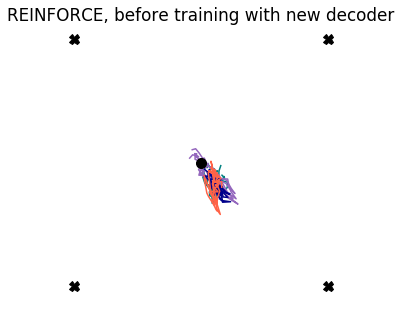

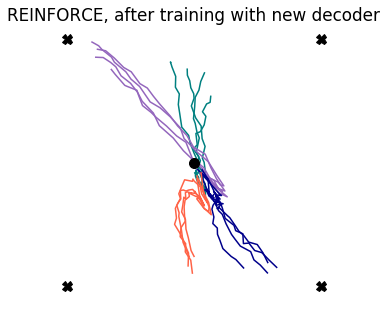

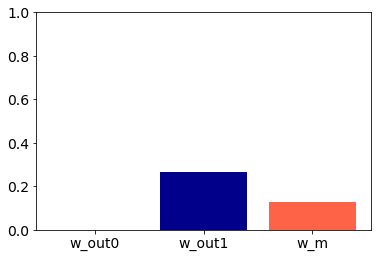

similarity DeltaC2 & C2_pred_w_out: 0.122
similarity DeltaC2 & C2_pred_w_out1: 0.283
similarity DeltaC2 & C2_pred_w_m: 0.109


>> CTRL DeltaC2 & CTRL_h2_pre: 0.109
>> CTRL DeltaC2 & CTRL_h2_post: 0.754
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.122
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.275
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.104




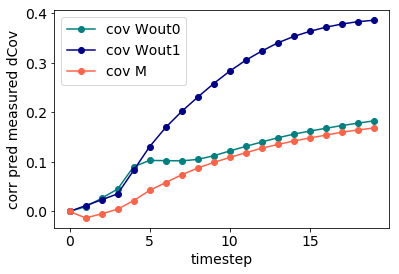

55it [00:00, 543.55it/s]


~~~~ OVERLAP 0.3, SEED 33


M norm: 1.04	 M angle: 0.50, 16 iterations
w_out1 norm: 1.71	 w_out vs. w_out1 angle: 0.29
w_m norm: 1.04	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.79	 w_out vs. w_m angle: 0.15

1000it [00:01, 883.46it/s]
15000it [00:33, 446.54it/s]
1000it [00:00, 1018.02it/s]


AR early fit 0.964, late fit 0.979


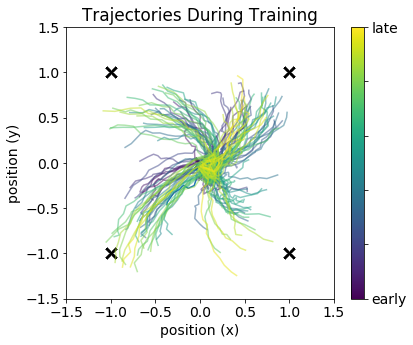

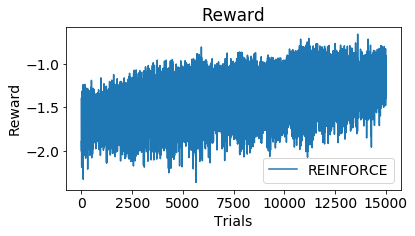

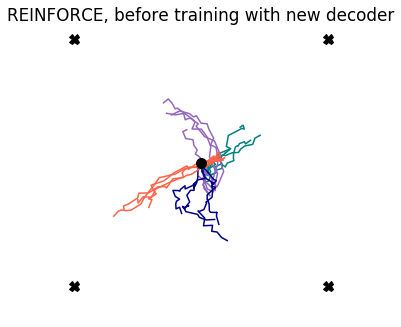

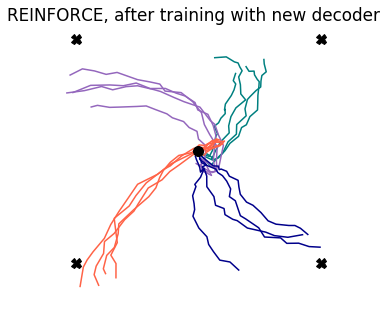

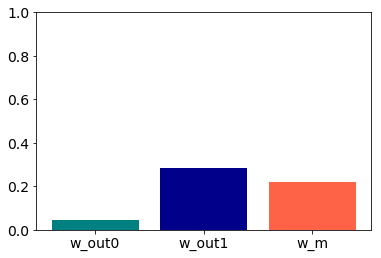

similarity DeltaC2 & C2_pred_w_out: 0.305
similarity DeltaC2 & C2_pred_w_out1: 0.436
similarity DeltaC2 & C2_pred_w_m: 0.201


>> CTRL DeltaC2 & CTRL_h2_pre: 0.318
>> CTRL DeltaC2 & CTRL_h2_post: 0.801
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.304
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.428
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.194




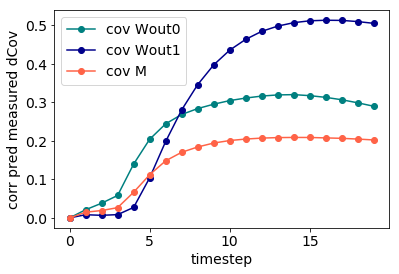

43it [00:00, 420.03it/s]


~~~~ OVERLAP 0.4, SEED 33


M norm: 1.11	 M angle: 0.50, 4 iterations
w_out1 norm: 1.61	 w_out vs. w_out1 angle: 0.41
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.90	 w_out vs. w_m angle: 0.05

1000it [00:01, 855.88it/s]
15000it [00:34, 434.51it/s]
1000it [00:01, 957.01it/s]


AR early fit 0.964, late fit 0.981


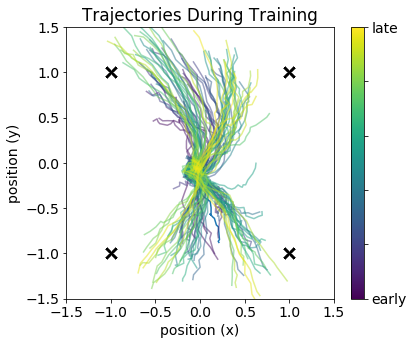

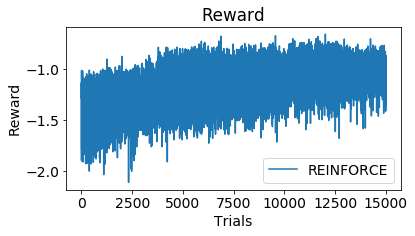

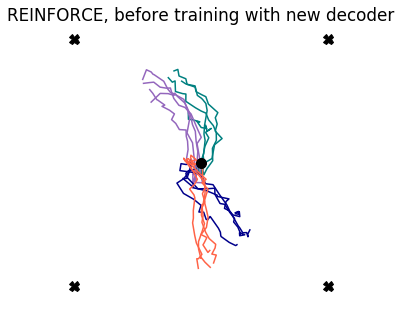

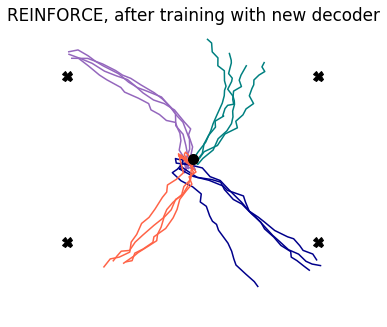

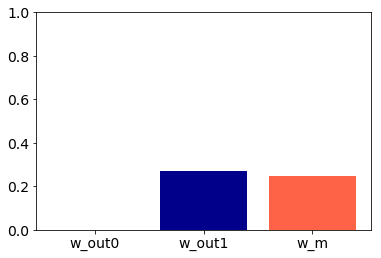

similarity DeltaC2 & C2_pred_w_out: 0.329
similarity DeltaC2 & C2_pred_w_out1: 0.358
similarity DeltaC2 & C2_pred_w_m: 0.069


>> CTRL DeltaC2 & CTRL_h2_pre: 0.648
>> CTRL DeltaC2 & CTRL_h2_post: 0.919
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.327
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.349
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.064




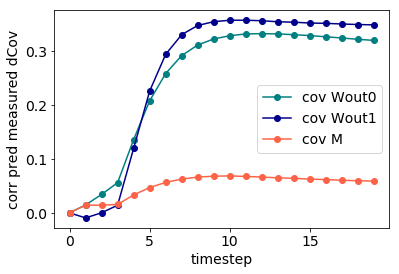

57it [00:00, 569.23it/s]


~~~~ OVERLAP 0.5, SEED 33


M norm: 1.14	 M angle: 0.51, 9 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.14	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.84	 w_out vs. w_m angle: 0.14

1000it [00:01, 960.83it/s]
15000it [00:33, 460.56it/s]
1000it [00:01, 851.21it/s]


AR early fit 0.964, late fit 0.981


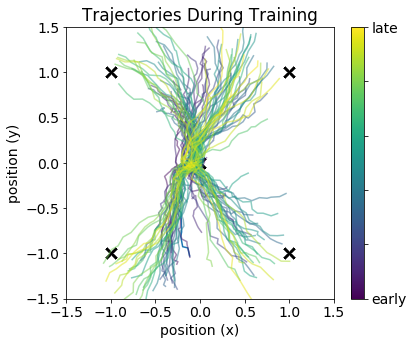

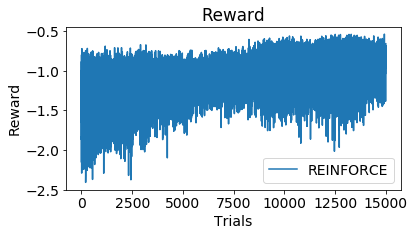

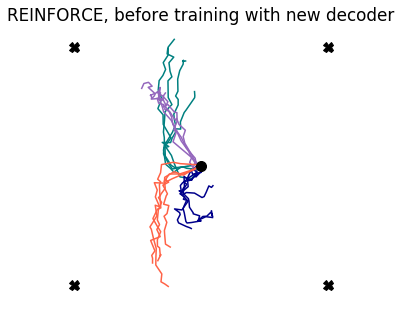

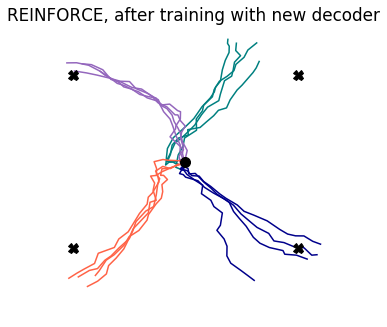

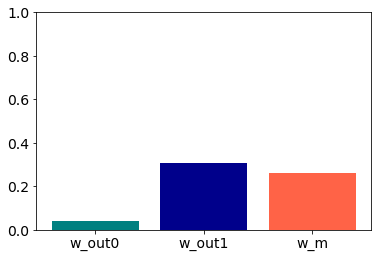

similarity DeltaC2 & C2_pred_w_out: 0.385
similarity DeltaC2 & C2_pred_w_out1: 0.344
similarity DeltaC2 & C2_pred_w_m: 0.056


>> CTRL DeltaC2 & CTRL_h2_pre: 0.611
>> CTRL DeltaC2 & CTRL_h2_post: 0.909
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.383
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.336
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.051




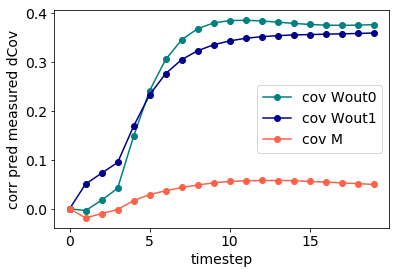

66it [00:00, 657.42it/s]


~~~~ OVERLAP 0.6, SEED 33


M norm: 1.15	 M angle: 0.51, 3 iterations
w_out1 norm: 1.36	 w_out vs. w_out1 angle: 0.60
w_m norm: 1.15	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.62	 w_out vs. w_m angle: 0.35

1000it [00:01, 911.42it/s]
15000it [00:34, 439.68it/s]
1000it [00:01, 955.31it/s]


AR early fit 0.964, late fit 0.981


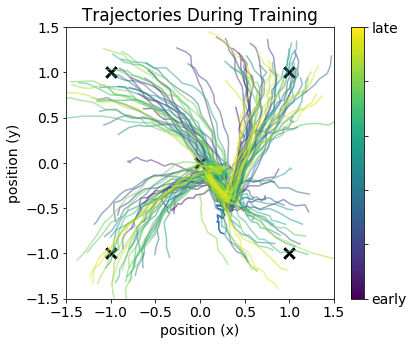

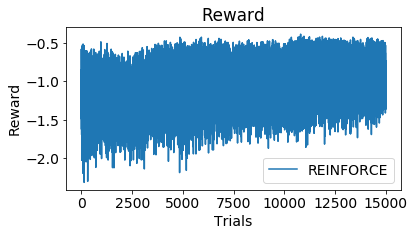

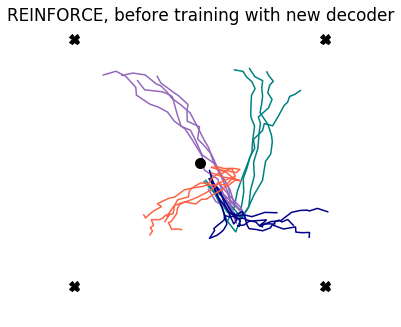

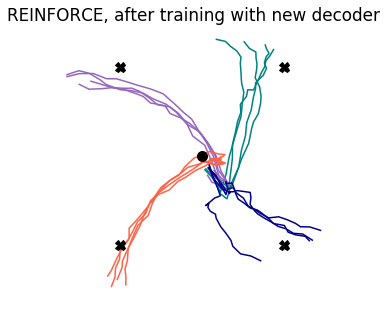

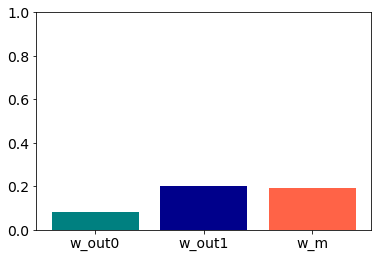

similarity DeltaC2 & C2_pred_w_out: 0.459
similarity DeltaC2 & C2_pred_w_out1: 0.498
similarity DeltaC2 & C2_pred_w_m: 0.093


>> CTRL DeltaC2 & CTRL_h2_pre: 0.608
>> CTRL DeltaC2 & CTRL_h2_post: 0.905
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.456
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.490
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.087




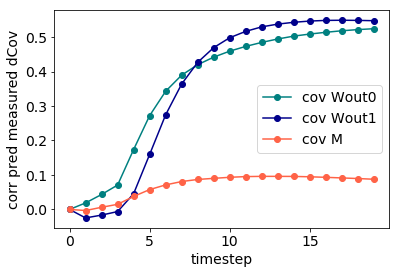

80it [00:00, 794.20it/s]


~~~~ OVERLAP 0.7, SEED 33


M norm: 1.26	 M angle: 0.51, 16 iterations
w_out1 norm: 1.20	 w_out vs. w_out1 angle: 0.70
w_m norm: 1.26	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.64	 w_out vs. w_m angle: 0.36

1000it [00:01, 889.23it/s]
15000it [00:34, 430.13it/s]
1000it [00:01, 992.44it/s]


AR early fit 0.964, late fit 0.982


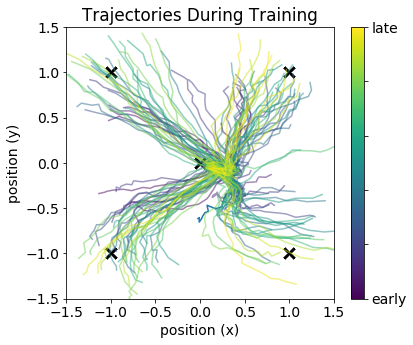

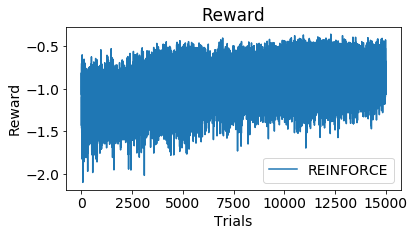

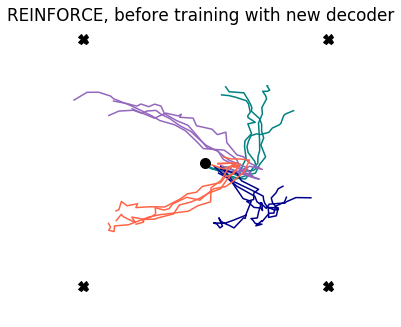

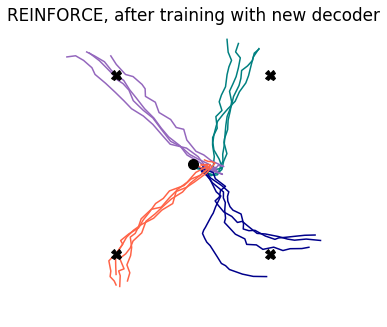

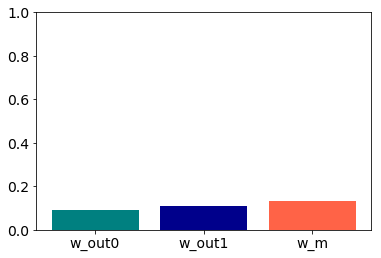

similarity DeltaC2 & C2_pred_w_out: 0.586
similarity DeltaC2 & C2_pred_w_out1: 0.491
similarity DeltaC2 & C2_pred_w_m: 0.145


>> CTRL DeltaC2 & CTRL_h2_pre: 0.793
>> CTRL DeltaC2 & CTRL_h2_post: 0.961
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.583
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.484
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.138




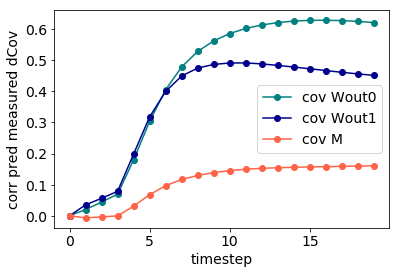

71it [00:00, 707.02it/s]


~~~~ OVERLAP 0.8, SEED 33


M norm: 1.28	 M angle: 0.51, 20 iterations
w_out1 norm: 0.99	 w_out vs. w_out1 angle: 0.81
w_m norm: 1.28	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.63	 w_out vs. w_m angle: 0.37

1000it [00:01, 927.92it/s]
15000it [00:35, 449.84it/s]
1000it [00:01, 960.85it/s]


AR early fit 0.964, late fit 0.981


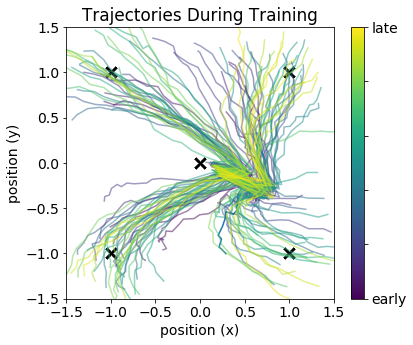

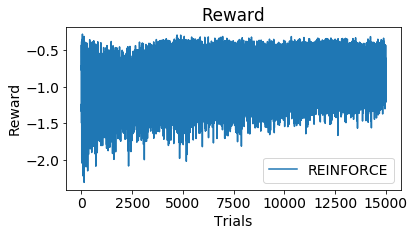

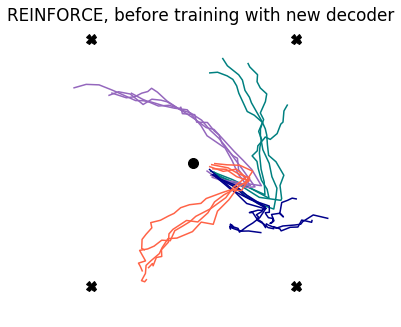

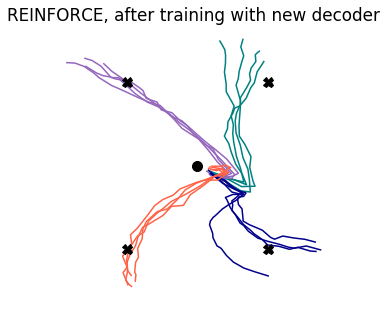

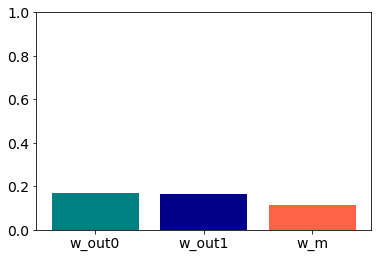

similarity DeltaC2 & C2_pred_w_out: 0.559
similarity DeltaC2 & C2_pred_w_out1: 0.530
similarity DeltaC2 & C2_pred_w_m: 0.397


>> CTRL DeltaC2 & CTRL_h2_pre: 0.821
>> CTRL DeltaC2 & CTRL_h2_post: 0.958
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.553
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.521
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.388




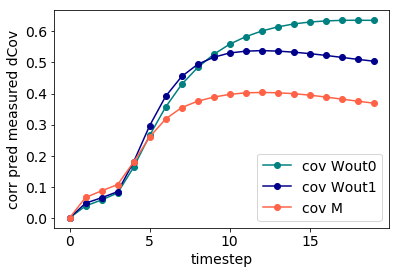

54it [00:00, 535.90it/s]


~~~~ OVERLAP 0.9, SEED 33


M norm: 1.34	 M angle: 0.50, 3 iterations
w_out1 norm: 0.74	 w_out vs. w_out1 angle: 0.90
w_m norm: 1.34	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.52	 w_out vs. w_m angle: 0.45

1000it [00:01, 962.68it/s]
15000it [00:33, 449.70it/s]
1000it [00:01, 1007.57it/s]


AR early fit 0.964, late fit 0.976


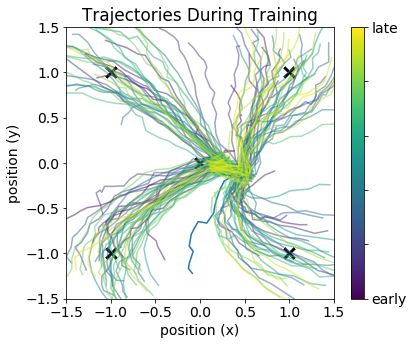

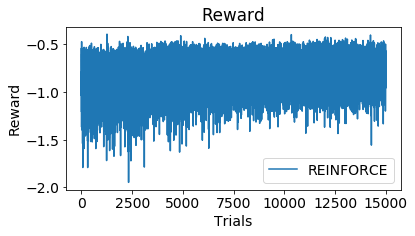

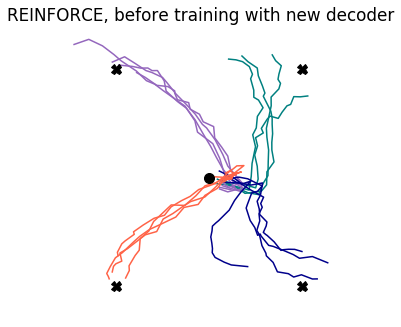

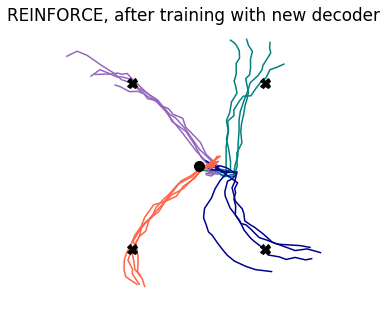

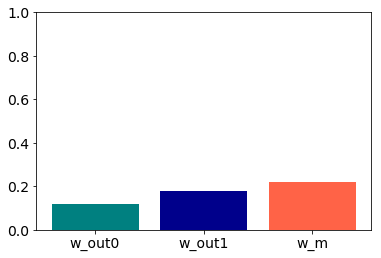

similarity DeltaC2 & C2_pred_w_out: 0.618
similarity DeltaC2 & C2_pred_w_out1: 0.583
similarity DeltaC2 & C2_pred_w_m: 0.147


>> CTRL DeltaC2 & CTRL_h2_pre: 0.864
>> CTRL DeltaC2 & CTRL_h2_post: 0.955
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.609
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.572
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.133




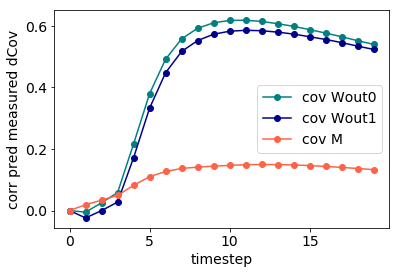

40it [00:00, 398.53it/s]


~~~~ OVERLAP 1, SEED 33


M norm: 1.50	 M angle: 0.50, 20 iterations
w_out1 norm: 0.00	 w_out vs. w_out1 angle: 1.00
w_m norm: 1.50	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.50	 w_out vs. w_m angle: 0.50

1000it [00:01, 772.10it/s]
15000it [00:34, 439.76it/s]
1000it [00:00, 1012.17it/s]


AR early fit 0.964, late fit 0.973


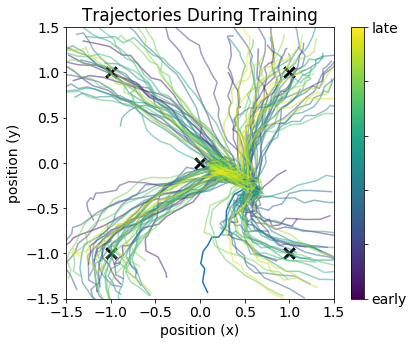

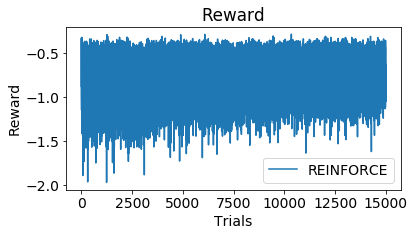

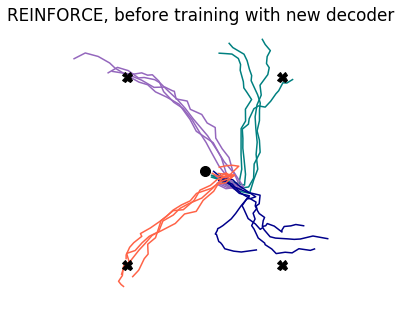

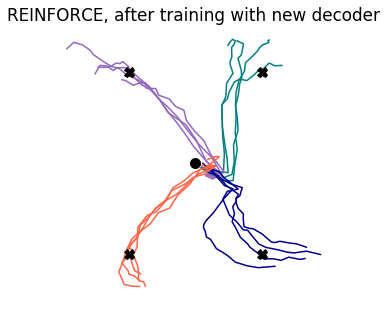

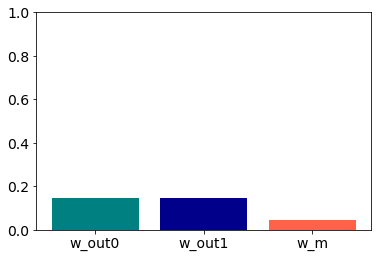

similarity DeltaC2 & C2_pred_w_out: 0.536
similarity DeltaC2 & C2_pred_w_out1: 0.536
similarity DeltaC2 & C2_pred_w_m: 0.341


>> CTRL DeltaC2 & CTRL_h2_pre: 0.842
>> CTRL DeltaC2 & CTRL_h2_post: 0.933
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.524
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.524
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.324




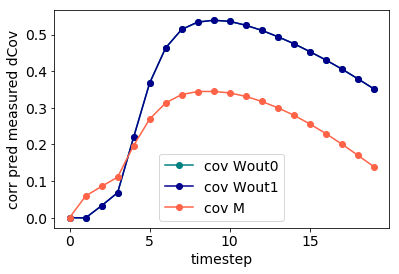

31it [00:00, 306.83it/s]


~~~~ OVERLAP 0.2, SEED 47


M norm: 0.95	 M angle: 0.50, 40 iterations
w_out1 norm: 1.76	 w_out vs. w_out1 angle: 0.20
w_m norm: 0.95	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.76	 w_out vs. w_m angle: 0.16

1000it [00:01, 735.02it/s]
15000it [00:34, 429.26it/s]
1000it [00:01, 929.94it/s]


AR early fit 0.964, late fit 0.977


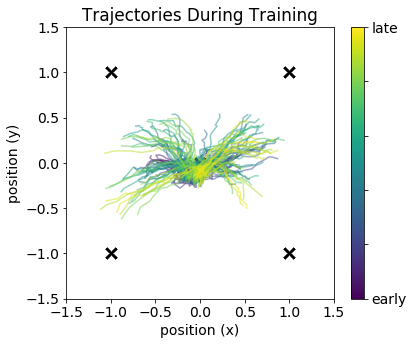

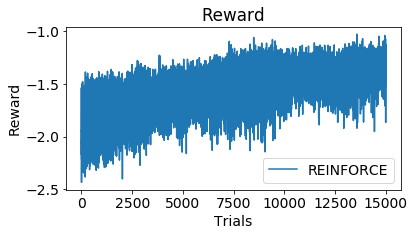

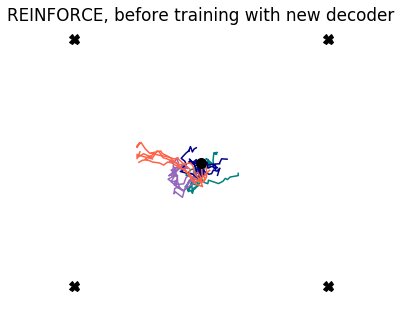

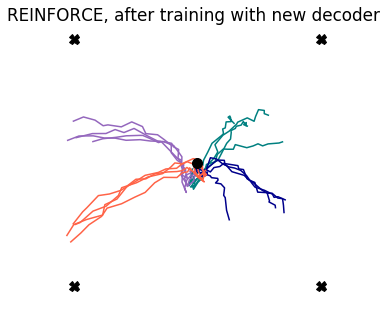

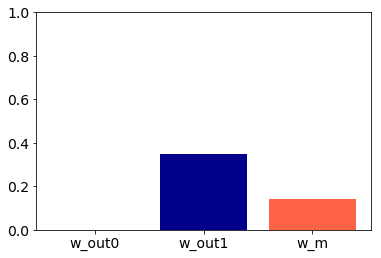

similarity DeltaC2 & C2_pred_w_out: 0.136
similarity DeltaC2 & C2_pred_w_out1: 0.289
similarity DeltaC2 & C2_pred_w_m: 0.060


>> CTRL DeltaC2 & CTRL_h2_pre: -0.071
>> CTRL DeltaC2 & CTRL_h2_post: 0.651
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.136
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.281
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.057




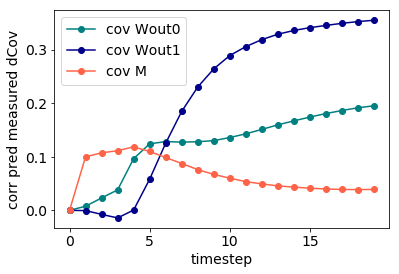

75it [00:00, 746.06it/s]


~~~~ OVERLAP 0.3, SEED 47


M norm: 1.00	 M angle: 0.50, 0 iterations
w_out1 norm: 1.68	 w_out vs. w_out1 angle: 0.31
w_m norm: 1.00	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.73	 w_out vs. w_m angle: 0.20

1000it [00:01, 936.02it/s]
15000it [00:33, 449.69it/s]
1000it [00:01, 992.01it/s]


AR early fit 0.964, late fit 0.979


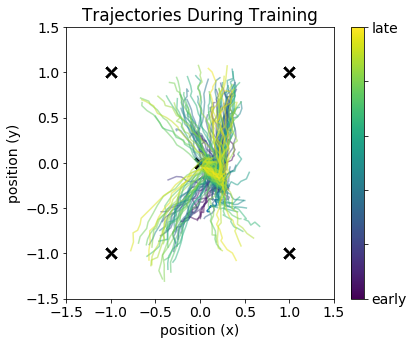

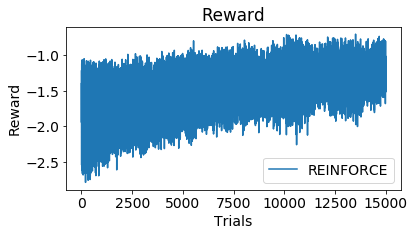

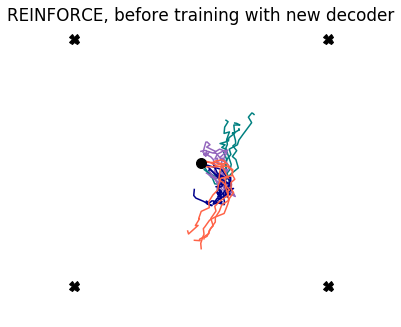

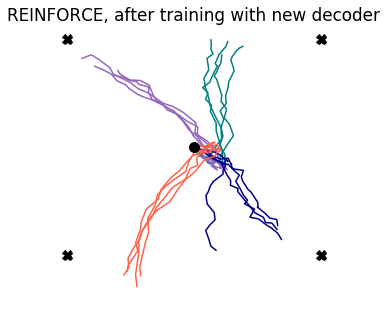

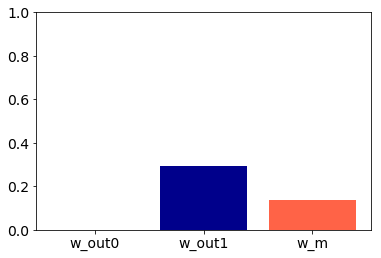

similarity DeltaC2 & C2_pred_w_out: 0.294
similarity DeltaC2 & C2_pred_w_out1: 0.402
similarity DeltaC2 & C2_pred_w_m: 0.088


>> CTRL DeltaC2 & CTRL_h2_pre: 0.381
>> CTRL DeltaC2 & CTRL_h2_post: 0.826
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.293
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.394
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.084




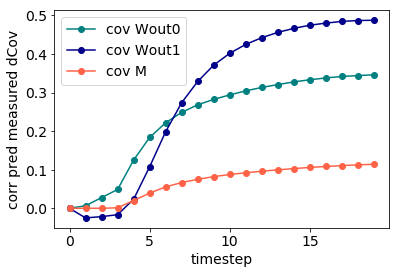

64it [00:00, 635.91it/s]


~~~~ OVERLAP 0.4, SEED 47


M norm: 1.09	 M angle: 0.51, 1 iterations
w_out1 norm: 1.61	 w_out vs. w_out1 angle: 0.41
w_m norm: 1.09	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.64	 w_out vs. w_m angle: 0.32

1000it [00:01, 959.36it/s]
15000it [00:33, 441.84it/s]
1000it [00:01, 917.94it/s]


AR early fit 0.964, late fit 0.982


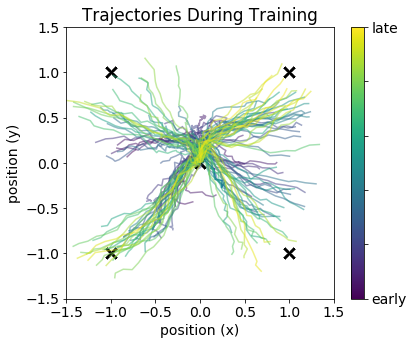

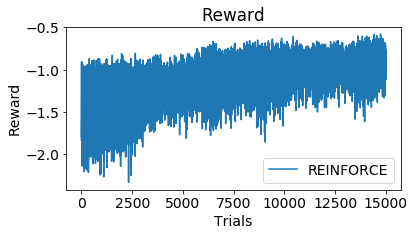

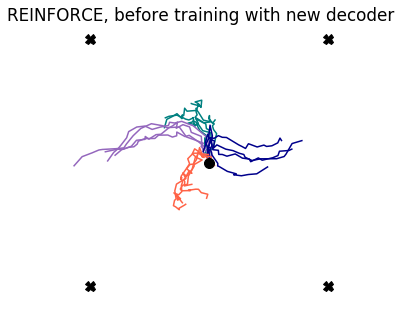

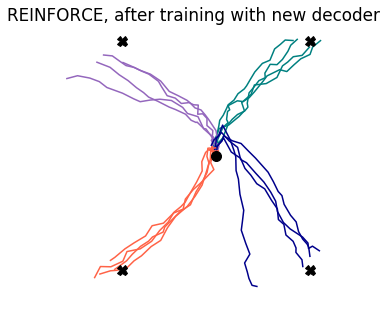

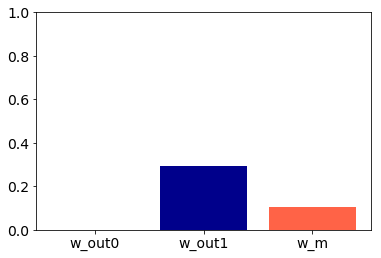

similarity DeltaC2 & C2_pred_w_out: 0.467
similarity DeltaC2 & C2_pred_w_out1: 0.470
similarity DeltaC2 & C2_pred_w_m: 0.200


>> CTRL DeltaC2 & CTRL_h2_pre: 0.641
>> CTRL DeltaC2 & CTRL_h2_post: 0.932
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.465
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.464
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.195




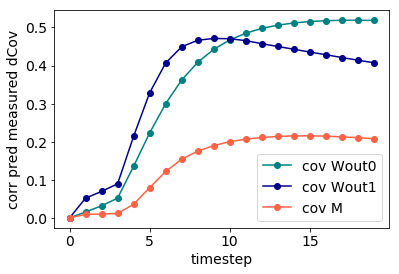

76it [00:00, 756.36it/s]


~~~~ OVERLAP 0.5, SEED 47


M norm: 1.11	 M angle: 0.50, 11 iterations
w_out1 norm: 1.47	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.70	 w_out vs. w_m angle: 0.26

1000it [00:01, 949.53it/s]
15000it [00:34, 436.19it/s]
1000it [00:01, 994.95it/s]


AR early fit 0.964, late fit 0.980


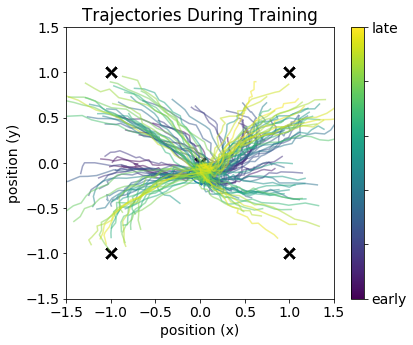

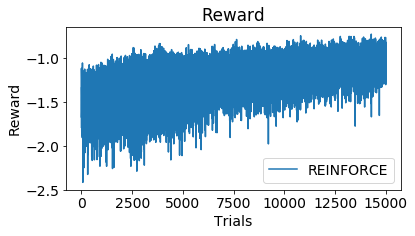

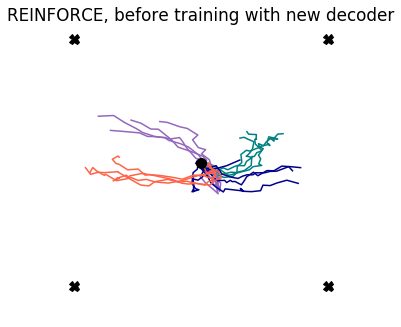

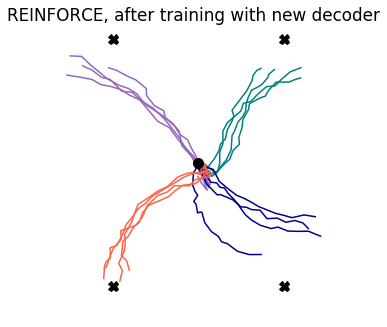

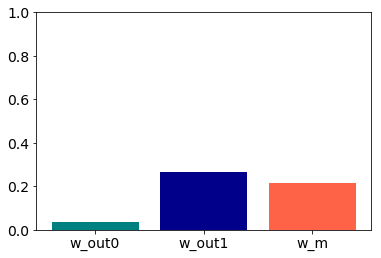

similarity DeltaC2 & C2_pred_w_out: 0.252
similarity DeltaC2 & C2_pred_w_out1: 0.411
similarity DeltaC2 & C2_pred_w_m: 0.209


>> CTRL DeltaC2 & CTRL_h2_pre: 0.389
>> CTRL DeltaC2 & CTRL_h2_post: 0.842
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.251
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.403
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.202




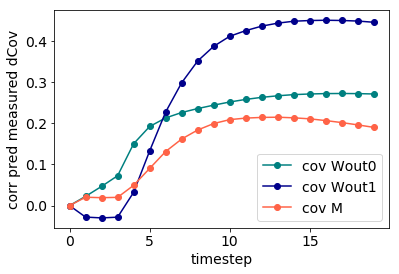

58it [00:00, 575.40it/s]


~~~~ OVERLAP 0.6, SEED 47


M norm: 1.24	 M angle: 0.49, 22 iterations
w_out1 norm: 1.36	 w_out vs. w_out1 angle: 0.61
w_m norm: 1.24	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.75	 w_out vs. w_m angle: 0.26

1000it [00:01, 883.69it/s]
15000it [00:33, 445.92it/s]
1000it [00:01, 891.20it/s]


AR early fit 0.964, late fit 0.982


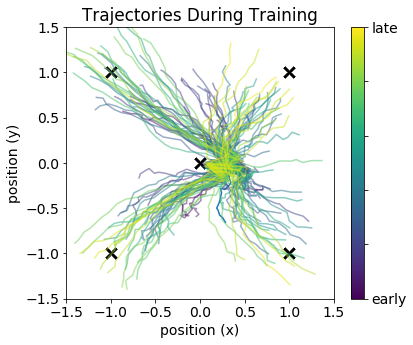

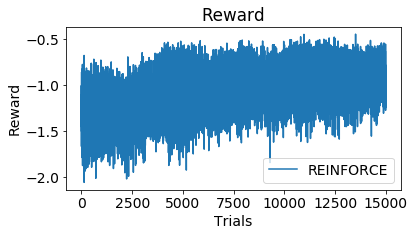

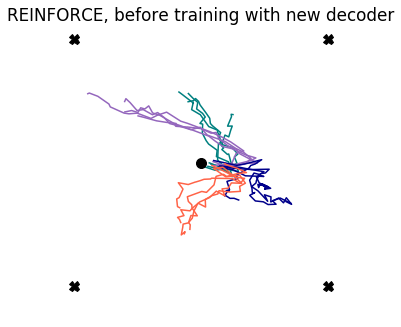

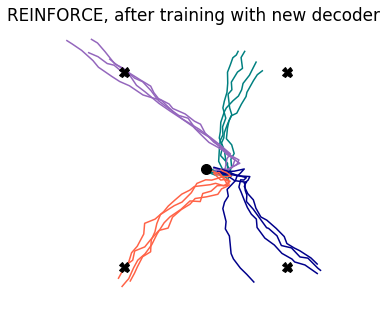

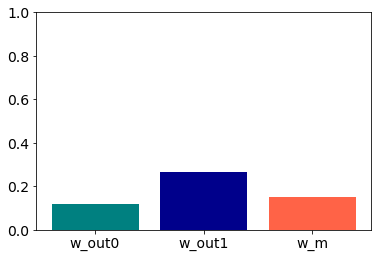

similarity DeltaC2 & C2_pred_w_out: 0.521
similarity DeltaC2 & C2_pred_w_out1: 0.464
similarity DeltaC2 & C2_pred_w_m: 0.085


>> CTRL DeltaC2 & CTRL_h2_pre: 0.640
>> CTRL DeltaC2 & CTRL_h2_post: 0.925
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.519
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.457
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.081




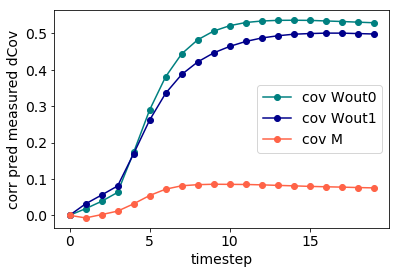

62it [00:00, 616.16it/s]


~~~~ OVERLAP 0.7, SEED 47


M norm: 1.17	 M angle: 0.51, 43 iterations
w_out1 norm: 1.19	 w_out vs. w_out1 angle: 0.70
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.60	 w_out vs. w_m angle: 0.37

1000it [00:01, 950.10it/s]
15000it [00:34, 440.44it/s]
1000it [00:01, 895.03it/s]


AR early fit 0.964, late fit 0.981


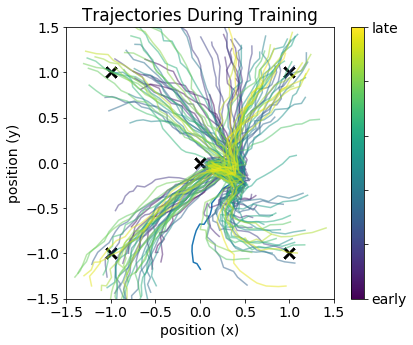

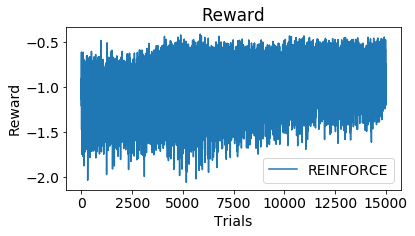

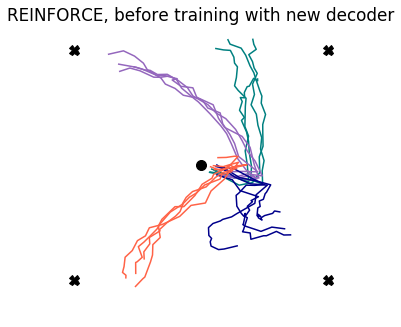

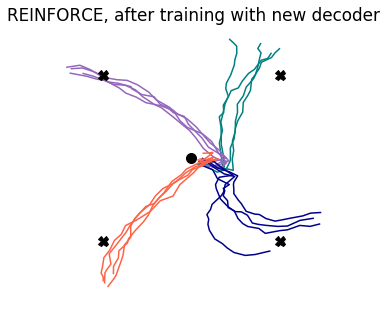

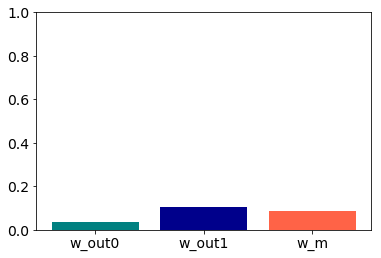

similarity DeltaC2 & C2_pred_w_out: 0.523
similarity DeltaC2 & C2_pred_w_out1: 0.491
similarity DeltaC2 & C2_pred_w_m: 0.121


>> CTRL DeltaC2 & CTRL_h2_pre: 0.757
>> CTRL DeltaC2 & CTRL_h2_post: 0.943
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.519
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.482
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.114




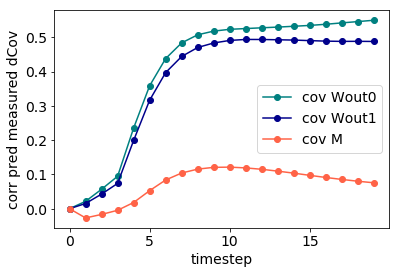

83it [00:00, 827.91it/s]


~~~~ OVERLAP 0.8, SEED 47


M norm: 1.36	 M angle: 0.50, 22 iterations
w_out1 norm: 1.02	 w_out vs. w_out1 angle: 0.80
w_m norm: 1.36	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.65	 w_out vs. w_m angle: 0.37

1000it [00:01, 962.12it/s]
15000it [00:33, 444.46it/s]
1000it [00:01, 964.79it/s]


AR early fit 0.964, late fit 0.979


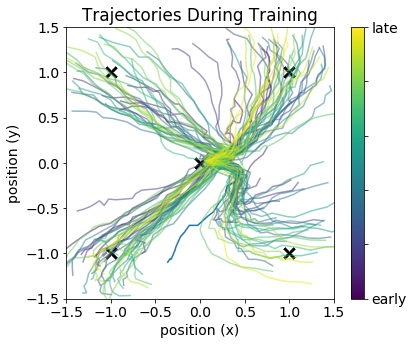

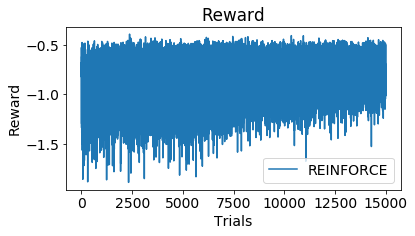

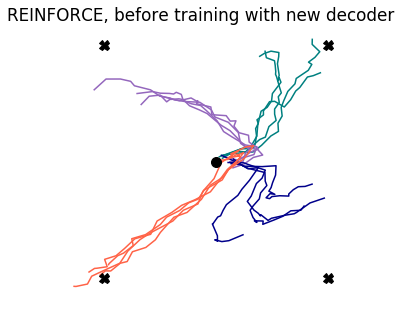

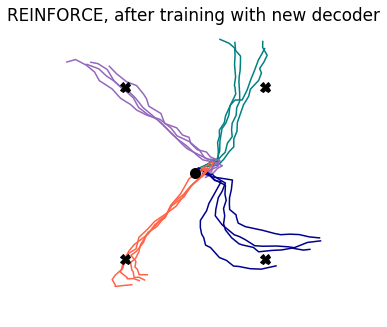

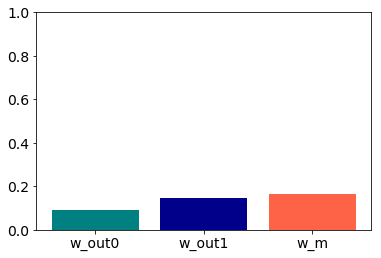

similarity DeltaC2 & C2_pred_w_out: 0.488
similarity DeltaC2 & C2_pred_w_out1: 0.523
similarity DeltaC2 & C2_pred_w_m: 0.179


>> CTRL DeltaC2 & CTRL_h2_pre: 0.789
>> CTRL DeltaC2 & CTRL_h2_post: 0.944
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.481
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.513
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.168




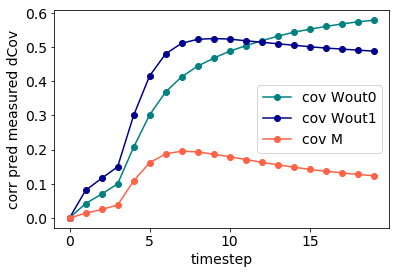

0it [00:00, ?it/s]


~~~~ OVERLAP 0.9, SEED 47


M norm: 1.41	 M angle: 0.50, 52 iterations
w_out1 norm: 0.70	 w_out vs. w_out1 angle: 0.91
w_m norm: 1.41	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.52	 w_out vs. w_m angle: 0.47

1000it [00:01, 780.25it/s]
15000it [00:35, 423.15it/s]
1000it [00:01, 894.36it/s]


AR early fit 0.964, late fit 0.977


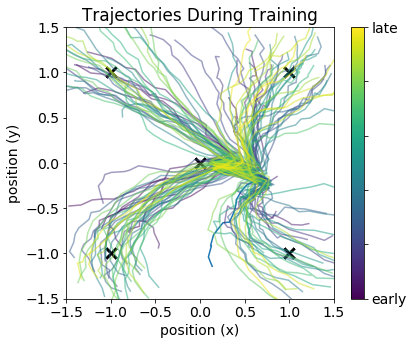

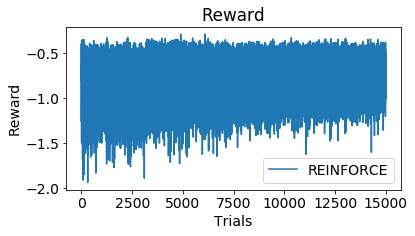

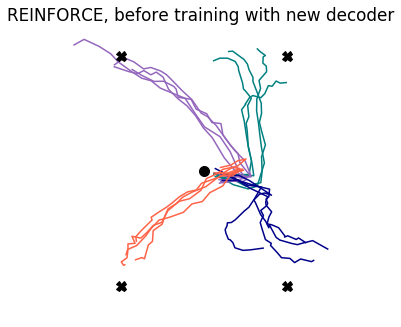

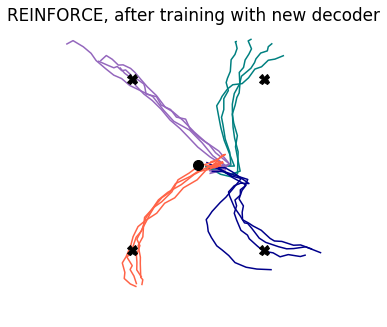

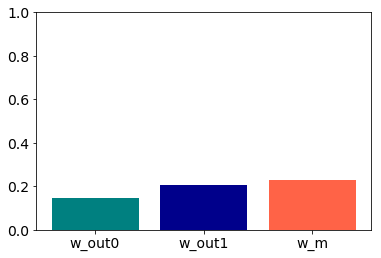

similarity DeltaC2 & C2_pred_w_out: 0.602
similarity DeltaC2 & C2_pred_w_out1: 0.562
similarity DeltaC2 & C2_pred_w_m: 0.217


>> CTRL DeltaC2 & CTRL_h2_pre: 0.866
>> CTRL DeltaC2 & CTRL_h2_post: 0.958
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.593
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.550
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.202




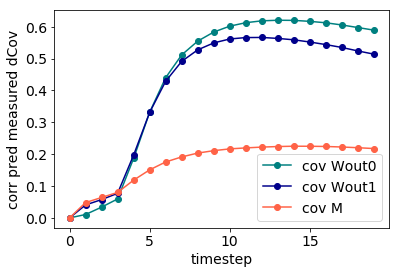

78it [00:00, 777.31it/s]


~~~~ OVERLAP 1, SEED 47


M norm: 1.47	 M angle: 0.51, 9 iterations
w_out1 norm: 0.00	 w_out vs. w_out1 angle: 1.00
w_m norm: 1.47	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.47	 w_out vs. w_m angle: 0.51

1000it [00:01, 983.99it/s]
15000it [00:33, 441.43it/s]
1000it [00:01, 973.25it/s]


AR early fit 0.964, late fit 0.973


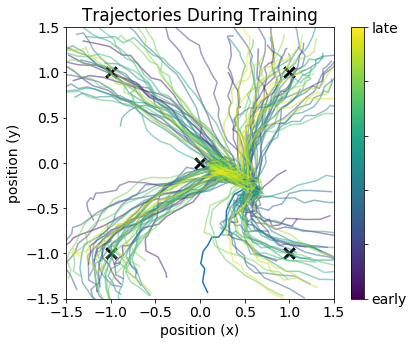

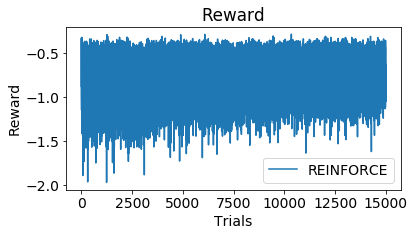

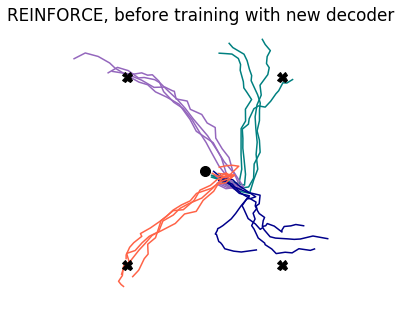

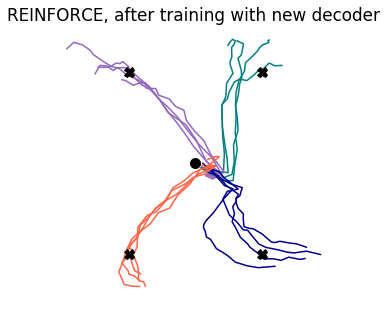

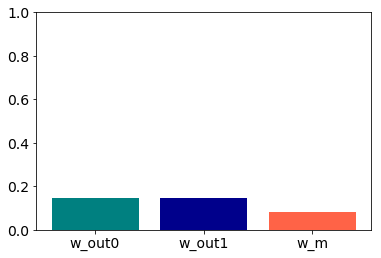

similarity DeltaC2 & C2_pred_w_out: 0.536
similarity DeltaC2 & C2_pred_w_out1: 0.536
similarity DeltaC2 & C2_pred_w_m: 0.084


>> CTRL DeltaC2 & CTRL_h2_pre: 0.842
>> CTRL DeltaC2 & CTRL_h2_post: 0.933
>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: 0.524
>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: 0.524
>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: 0.073




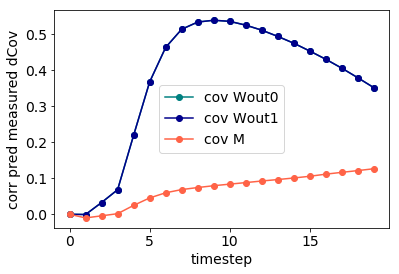

In [52]:
# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.1,
               sig_in=0.0,sig_rec=0.25,sig_out=0.01,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(72))
params.print_params()

# Initialize RNN, train with RFLO
net0 = RNN(params)
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec'],online=False)
sim0.run_session(n_trials=2500, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')






""" Average over multiple seeds """
# seeds = [1]#,12,54,72,81]
# overlaps = [0.1] #,0.5,1]
# n_changes = [2*50] #,50,1]
seeds = [0,22,33,47] #,54,72,81]
overlaps = [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
n_changes = [75,75,60,50,50,50,30,30,1]

overlap_w_m = 0.5
n_change_w_m = 50


stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []
stats['corrcoef'] = []

stats['covariance1'] = []
stats['covariance2'] = []
stats['covariance3'] = []
stats['seeds'] = seeds
stats['overlaps'] = overlaps
stats['overlap_w_m'] = overlap_w_m


for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []
    corrcoef_list = []
    
    covariance1_list = []
    covariance2_list = []
    covariance3_list = []

    for overlap,n_change in zip(overlaps,n_changes):
        
        print('\n~~~~ OVERLAP {}, SEED {}'.format(overlap,seed))
        print('\n')
        
        """ choose new decoder w_out1, change overlap """
        w_out1 = choose_aligned_matrix(net0.w_out.copy(),n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)
        """ choose new internal model w_m, keep constant """
        w_m = choose_aligned_matrix(w_out1.copy(),n_change=n_change_w_m,overlap=overlap_w_m,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)

        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        net2_pre = RNN(params)
        net2_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net2_pre.set_weights(w_out = w_out1)
        net2_pre.set_weights(w_m = 0*w_m.T) # shouldn't matter for REINFORCE

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net2 = RNN(params)
        net2.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net2.set_weights(w_out = w_out1)
        net2.set_weights(w_m = 0*w_m.T) # shouldn't matter for REINFORCE



        """ Track activity with new decoder, before training """

        sim2_pre = Simulation(net2_pre)
        trackvars = TrackVars(net2_pre,apply_to=[]) 
        sim2_pre.run_session(n_trials=1000, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
        #fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        """ Train with new decoder """

        sim2_train = Simulation(net2)
        reinforce = REINFORCE(net2,apply_to=['w_rec'],online=False,tau_reward=5)
        sim2_train.run_session(n_trials=15000, tasks=[task1,task2,task3,task4], learn_alg=[reinforce], probe_types=['h','reward','err'], plot=True, plot_freq=100)

        """ Track activity with new decoder, after training """
        net2_post = RNN(params)
        net2_post.set_weights(w_in=net2.w_in.copy(), w_rec=net2.w_rec.copy())
        net2_post.set_weights(w_out = net2.w_out)
        net2_post.set_weights(w_m = 0*net2.w_m) # shouldn't matter for REINFORCE

        sim2_post = Simulation(net2_post)
        trackvars = TrackVars(net2_post,apply_to=[]) 
        sim2_post.run_session(n_trials=1000, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)

        
        fig = plot_trained_trajectories(sim=sim2_pre, tasks=[task1,task2,task3,task4],title='REINFORCE, before training with new decoder')

        fig = plot_trained_trajectories(sim=sim2_post, tasks=[task1,task2,task3,task4],title='REINFORCE, after training with new decoder')
        
        
        """ Calculate F fields """
        F_early, score_early = flow_field_data(sim2_pre.session_probes['h'])
        F_late, score_late = flow_field_data(sim2_post.session_probes['h'])

        print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

        Fdata = F_late - F_early

        # separate train and test data from sim1_train
        n_total = len(sim2_train.session_probes['h'])
        n_train = int(0.5 * n_total)
        idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
        idx_test = np.arange(0,n_total)[~idx_train].astype(int)
        #idx_test=idx_train

        h_train = np.asarray(sim2_train.session_probes['h'])[idx_train,:,:,:]
        err_train = np.asarray(sim2_train.session_probes['err'])[idx_train,:,:,:]

        Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
        Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
        Fpred_w_m = flow_field_predicted(w_m,err_train,h_train)

        h_test = np.asarray(sim2_train.session_probes['h'])[idx_test,:,:,:]

        corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
        corr1_list.append(corr1)

        corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
        corr2_list.append(corr2)

        corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
        corr3_list.append(corr3)
        
        fig,ax = plt.subplots(1,1)
        plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])
        plt.ylim([0,1])
        plt.show()
        
        
        
        
        
        
        
        """ Calculate Covariance """
        """ Activity During """
        covariance1 = np.zeros(task1.trial_duration)
        covariance2 = np.zeros(task1.trial_duration)
        covariance3 = np.zeros(task1.trial_duration)
        
        for t_ind in range(1,task1.trial_duration):
            """ Covariance Before """
            h2_pre = np.asarray(sim2_pre.session_probes['h']).squeeze()

            C2_pre = np.cov(h2_pre[:,t_ind,:].T) # neurons x trials at a single time point

            """ Covariance After """
            h2_post = np.asarray(sim2_post.session_probes['h']).squeeze()

            C2_post = np.cov(h2_post[:,t_ind,:].T) # neurons x trials at a single time point

            DeltaC2 = C2_post - C2_pre

            h2_train = sim2_train.session_probes['h']
            err2_train = sim2_train.session_probes['err']

            dW2_w_out = flow_field_predicted(net0.w_out,err2_train,h2_train)
            dW2_w_out *= 0.001 #dW1_w_out/LA.norm(dW1_w_out)
            dW2_w_out1 = flow_field_predicted(w_out1,err2_train,h2_train)
            dW2_w_out1 *= 0.001 #dW1_w_out/LA.norm(dW1_w_out)
            dW2_w_m = flow_field_predicted(w_m,err2_train,h2_train) # w_m defined above
            dW2_w_m *= 0.001 #dW1_w_m/LA.norm(dW1_w_m)

            h2_pre = np.asarray(sim2_pre.session_probes['h']).squeeze()
            h2_post = np.asarray(sim2_post.session_probes['h']).squeeze()

            C2_pred_w_out = np.cov(h2_pre[:,t_ind,:].T + dW2_w_out@(h2_post[:,t_ind,:].T))
            C2_pred_w_out1 = np.cov(h2_pre[:,t_ind,:].T + dW2_w_out1@(h2_post[:,t_ind,:].T))
            C2_pred_w_m = np.cov(h2_pre[:,t_ind,:].T + dW2_w_m@(h2_post[:,t_ind,:].T))
            
            dC2_pred_w_out = C2_pred_w_out - C2_pre
            dC2_pred_w_out1 = C2_pred_w_out1 - C2_pre
            dC2_pred_w_m = C2_pred_w_m - C2_pre

            covariance1[t_ind] = np.corrcoef(DeltaC2.ravel(),dC2_pred_w_out.ravel())[0,1]
            covariance2[t_ind] = np.corrcoef(DeltaC2.ravel(),dC2_pred_w_out1.ravel())[0,1]
            covariance3[t_ind] = np.corrcoef(DeltaC2.ravel(),dC2_pred_w_m.ravel())[0,1]
            


            if t_ind == 10:
                print('similarity DeltaC2 & C2_pred_w_out: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),dC2_pred_w_out.ravel())[0,1]))
                print('similarity DeltaC2 & C2_pred_w_out1: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),dC2_pred_w_out1.ravel())[0,1]))
                print('similarity DeltaC2 & C2_pred_w_m: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),dC2_pred_w_m.ravel())[0,1]))
                print('\n')

            CTRL_h2_pre = np.cov(h2_pre[:,t_ind,:].T)
            CTRL_h2_post = np.cov(h2_post[:,t_ind,:].T)
            CTRL_dW2_w_out_h2_post = np.cov(dW2_w_out@(h2_post[:,t_ind,:].T))
            CTRL_dW2_w_out1_h2_post = np.cov(dW2_w_out1@(h2_post[:,t_ind,:].T))
            CTRL_dW2_w_m_h2_post = np.cov(dW2_w_m@(h2_post[:,t_ind,:].T))

            if t_ind == 10:
                print('>> CTRL DeltaC2 & CTRL_h2_pre: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),CTRL_h2_pre.ravel())[0,1]))
                print('>> CTRL DeltaC2 & CTRL_h2_post: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),CTRL_h2_post.ravel())[0,1]))
                print('>> CTRL DeltaC2 & CTRL_dW2_w_out_h2_post: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),CTRL_dW2_w_out_h2_post.ravel())[0,1]))
                print('>> CTRL DeltaC2 & CTRL_dW2_w_out1_h2_post: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),CTRL_dW2_w_out1_h2_post.ravel())[0,1]))
                print('>> CTRL DeltaC2 & CTRL_dW2_w_m_h2_post: {:.3f}'.format(np.corrcoef(DeltaC2.ravel(),CTRL_dW2_w_m_h2_post.ravel())[0,1]))

                print('\n')
                
        covariance1_list.append(covariance1)
        covariance2_list.append(covariance2)
        covariance3_list.append(covariance3)
        
        fig,ax = plt.subplots(1,1)
        plt.plot(np.asarray(covariance1).T,'o-',label='cov Wout0',color='teal')
        plt.plot(np.asarray(covariance2).T,'o-',label='cov Wout1',color='darkblue')
        plt.plot(np.asarray(covariance3).T,'o-',label='cov M',color='tomato')
        plt.legend()
        plt.xlabel('timestep')
        plt.ylabel('corr pred measured dCov')
        plt.show()
        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)
    #stats['corrcoef'].append(corrcoef_list)
    
    stats['covariance1'].append(covariance1_list)
    stats['covariance2'].append(covariance2_list)
    stats['covariance3'].append(covariance3_list)


In [ ]:
stats_reinforce_wout = stats


In [53]:
import pickle
""" save dict with unique name """
stats_reinforce_wout = stats

save = True

if save:
    
    with open(folder+'stats_reinforce_wout.pickle', 'wb') as handle:
        pickle.dump(stats_reinforce_wout, handle, protocol=pickle.HIGHEST_PROTOCOL)


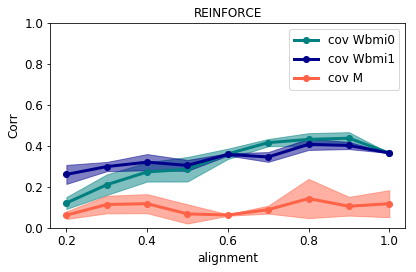

In [55]:
save = True
paper = False
if paper:
    fig,ax = plt.subplots(1,1,figsize=(2.5,2.5))
else:
    fig,ax = plt.subplots(1,1)
fs = 12

mn1 = np.mean(np.sum(np.asarray(stats_reinforce_wout['covariance1']),axis=2)/task1.trial_duration,axis=0) # seed by m by time
mn2 = np.mean(np.sum(np.asarray(stats_reinforce_wout['covariance2']),axis=2)/task1.trial_duration,axis=0) # seed by m by time
mn3 = np.mean(np.sum(np.asarray(stats_reinforce_wout['covariance3']),axis=2)/task1.trial_duration,axis=0) # seed by m by time

std1 = np.std(np.sum(np.asarray(stats_reinforce_wout['covariance1']),axis=2)/task1.trial_duration,axis=0) # seed by m by time
std2 = np.std(np.sum(np.asarray(stats_reinforce_wout['covariance2']),axis=2)/task1.trial_duration,axis=0) # seed by m by time
std3 = np.std(np.sum(np.asarray(stats_reinforce_wout['covariance3']),axis=2)/task1.trial_duration,axis=0) # seed by m by time

plt.plot(overlaps[:],mn1[:],'o-',linewidth=3,label='cov Wbmi0',color='teal')
plt.fill_between(overlaps[:],mn1[:]-std1[:],mn1[:]+std1[:],alpha=0.5,color='teal')

plt.plot(overlaps[:],mn2[:],'o-',linewidth=3,label='cov Wbmi1',color='darkblue')
plt.fill_between(overlaps[:],mn2[:]-std2[:],mn2[:]+std2[:],alpha=0.5,color='darkblue')

plt.plot(overlaps[:],mn3[:],'o-',linewidth=3,label='cov M',color='tomato')
plt.fill_between(overlaps[:],mn3[:]-std3[:],mn3[:]+std3[:],alpha=0.5,color='tomato')
plt.ylim([0,1])
plt.legend(fontsize=fs)
plt.title('REINFORCE',fontsize=fs)
plt.xlabel('alignment',fontsize=fs)
plt.ylabel('Corr',fontsize=fs)
plt.xticks(fontsize=fs)
plt.yticks(fontsize=fs)

if paper:
    from matplotlib.ticker import FixedLocator,FixedFormatter
    ax.xaxis.set_major_locator(FixedLocator(overlaps[:]))
    ax.xaxis.set_major_formatter(FixedFormatter(overlaps[:]))


plt.tight_layout()
plt.show()



if save:
    if paper:
        fig.savefig(folder+'reinforce-cov-change-alignment.pdf')
    else:
        fig.savefig(folder+'reinforce-cov-change-alignment_v2.pdf')

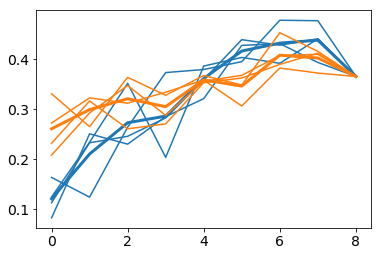

In [64]:
a = np.sum(np.asarray(stats_reinforce_wout['covariance1']),axis=2)/task1.trial_duration
plt.plot(a.T,color='C0')
plt.plot(np.mean(a.T,axis=1),linewidth=3,color='C0')
b = np.sum(np.asarray(stats_reinforce_wout['covariance2']),axis=2)/task1.trial_duration
plt.plot(b.T,color='C1')
plt.plot(np.mean(b.T,axis=1),linewidth=3,color='C1')

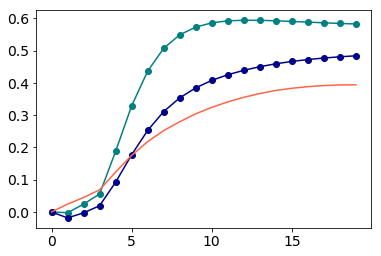

In [204]:
""" checking something """
plt.plot(np.asarray(stats_reinforce_wout['covariance1'])[0,2,:].T,'o-',label='cov Wout0',color='teal')
plt.plot(np.asarray(stats_reinforce_wout['covariance2'])[0,2,:].T,'o-',label='cov Wout1',color='darkblue')
plt.plot(np.asarray(stats_reinforce_wout['covariance3'])[0,2,:].T,'-',label='cov W_M',color='tomato')


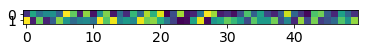

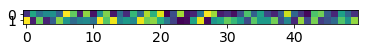

In [178]:
plt.imshow(net0.w_out)
plt.show()
plt.imshow(net2.w_out)

In [172]:
np.asarray(stats_reinforce_wout['corr1']).shape

(1, 2)

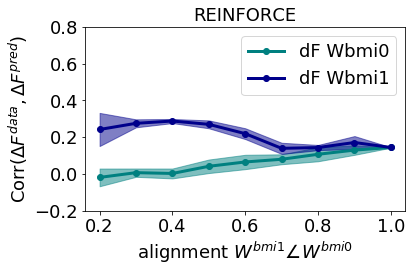

In [74]:
""" Same plot using flow field """

save = True
paper = False


fig,ax = plt.subplots(1,1)
lw = 3
fs = 18





mn1 = np.mean(np.asarray(stats_reinforce_wout['corr1']),axis=0)
std1 = np.std(np.asarray(stats_reinforce_wout['corr1']),axis=0)

mn2 = np.mean(np.asarray(stats_reinforce_wout['corr2']),axis=0)
std2 = np.std(np.asarray(stats_reinforce_wout['corr2']),axis=0)

mn3 = np.mean(np.asarray(stats_reinforce_wout['corr3']),axis=0)
std3 = np.std(np.asarray(stats_reinforce_wout['corr3']),axis=0)

plt.plot(overlaps[:],mn1,'o-',linewidth=lw,label='dF Wbmi0',color='teal')
plt.fill_between(overlaps[:],mn1-std1,mn1+std1,alpha=0.5,color='teal')

plt.plot(overlaps[:],mn2,'o-',linewidth=lw,label='dF Wbmi1',color='darkblue')
plt.fill_between(overlaps[:],mn2-std2,mn2+std2,alpha=0.5,color='darkblue')

#plt.plot(overlaps[:],mn3,'o-',linewidth=3,label='dF M',color='tomato')
#plt.fill_between(overlaps[:],mn3-std3,mn3+std3,alpha=0.5,color='tomato')

plt.legend(fontsize=fs)
plt.title('REINFORCE',fontsize=fs)
plt.xlabel('alignment '+r'$W^{bmi1} \angle W^{bmi0}$',fontsize=fs)
plt.ylabel('Corr'+r'$(\Delta F^{data},\Delta F^{pred})$',fontsize=fs)
plt.xticks(fontsize=fs)
plt.yticks(fontsize=fs)

if paper:
    
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=[0.2,0.4,0.6,0.8,1],ticksize=10,linewidth=2,ylim=[-0.1,1],figsize=(2.25,3))

    
else:
    plt.ylim([-0.2,0.8])


plt.tight_layout()
plt.show()


if save:
    if paper:
        fig.savefig(folder+'reinforce-dF-change-alignment.pdf')
    else:
        fig.savefig(folder+'reinforce-dF-change-alignment_v2_noWbmi0.pdf')